In [78]:
import warnings
warnings.filterwarnings('ignore')
from math import factorial
import math
import random
import matplotlib.pyplot as plt
import numpy as np
from deap import algorithms
from deap import base
from deap import creator
from deap import tools
import matplotlib.pyplot as plt
import mpl_toolkits.mplot3d as Axes3d
import time
import pandas as pd
from tqdm import tqdm
import numpy as np
from numpy import matlib
import matplotlib.pyplot as plt
import random as random
import math
from tqdm import tqdm

In [79]:
def deleteOneRepositoryMember(rep , gamma):
    gridindices = [item.gridIndex for item in rep]
    OCells = np.unique(gridindices) # ocupied cells
    N = np.zeros(len(OCells))
    for k in range(len(OCells)):
        N[k] = gridindices.count(OCells[k])
    # selection probablity
    p = [math.exp(gamma*item) for item in N]
    p = np.array(p)/sum(p)

    # select cell index
    sci = roulettewheelSelection(p)
    SelectedCell = OCells[sci]

    #selected Cell members
    selectedCellmembers = [item for item in gridindices if item == SelectedCell]

    selectedmemberindex = np.random.randint(0,len(selectedCellmembers))
    #selectedmember = selectedCellmembers[selectedmemberindex]

    # delete memeber
    #rep[selectedmemberindex] = []
    rep = np.delete(rep, selectedmemberindex)

    return rep.tolist()

In [80]:
def SelectLeader(rep , beta):
    gridindices = [item.gridIndex for item in rep]
    OCells = np.unique(gridindices) # ocupied cells
    N = np.zeros(len(OCells))
    for k in range(len(OCells)):
        N[k] = gridindices.count(OCells[k])
    # selection probablity
    p = [math.exp(-beta*item) for item in N]
    p = np.array(p)/sum(p)

    # select cell index
    sci = roulettewheelSelection(p)
    SelectedCell = OCells[sci]

    #selected Cell members
    selectedCellmembers = [item for item in gridindices if item == SelectedCell]

    selectedmemberindex = np.random.randint(0,len(selectedCellmembers))
    # selectedmember = selectedCellmembers[selectedmemberindex]

    return rep[selectedmemberindex]


In [81]:
def roulettewheelSelection(p):
    r = random.random()
    cumsum = np.cumsum(p)
    y = (cumsum<r)
    x= [i for i in y if i==True]
    return len(x)

In [82]:
def FindGridIndex(particle, grid):
    nObj = len(particle.cost)
    NGrid = len(grid[0].LowerBounds)
    
    particle.gridSubIndex = np.zeros((1,nObj))[0]
    for j in range(nObj):  
        index_in_Dim = len( [item for item in grid[j].UpperBounds if particle.cost[j]>item]) 
        particle.gridSubIndex[j] = index_in_Dim

    particle.gridIndex = particle.gridSubIndex[0]

    for j in range(1,nObj):
        particle.gridIndex = particle.gridIndex 
        particle.gridIndex = NGrid*particle.gridIndex
        particle.gridIndex = particle.gridIndex + particle.gridSubIndex[j]

    return particle

In [83]:
def CreateGrid(pop,nGrid,alpha,nobj):
    costs = [item.cost for item in pop]
    Cmin = np.min(costs,axis=0)
    Cmax = np.max(costs,axis=0)
    deltaC = Cmax - Cmin
    Cmin =  Cmin - alpha*deltaC
    Cmax = Cmax + alpha*deltaC
   
    grid = [GridDim() for p in range(nobj)]
    for i in range(nobj):
       dimValues = np.linspace(Cmin[i],Cmax[i],nGrid+1).tolist()
       grid[i].LowerBounds = [-float('inf')] + dimValues
       grid[i].UpperBounds = dimValues  + [float('inf')]
    return grid

In [84]:
def Dominates(x,y):
    x=np.array(x)
    y=np.array(y)
    x_dominate_y = all(x<=y) and any(x<y)
    return x_dominate_y

def DetermineDomination(pop):
    pop_len= len(pop)
    for i in range(pop_len):
         pop[i].IsDominated = False 

    for i in range(pop_len-1):
        for j in range(i+1,pop_len):
            if Dominates(pop[i].cost,pop[j].cost):
                pop[j].IsDominated = True
            if Dominates(pop[j].cost,pop[i].cost):
                pop[i].IsDominated = True

    return pop

In [85]:
def dupfix(VA):
    VA = [int(x) for x in VA]
    for i in range(len(VA)):
      if VA[i] < 0:
        VA[i] = 0
      elif VA[i] > 20:
        VA[i] = 20
      
      
    k = []
    for i in range(len(VA)):
        VA[i] = int(round(VA[i]))
        if VA[i] not in k:
            k.append(VA[i])
        else:
            f = 0
            for q in range(VA[i], 20):
                if q not in k:
                    VA[i] = q
                    k.append(q)
                    f = 1
                    break
            if f == 0:
                for q in reversed(range(0, VA[i])):
                    if q not in k:
                        VA[i] = q
                        k.append(q)
                        f = 1
                        break
    return VA

In [86]:
import time
import platypus as plat
import pygmo as pg
from pygmo import hypervolume
from platypus import Hypervolume, calculate, display
import psutil, tracemalloc

In [87]:
import pandas as pd
import numpy as np
def uniform(low, up, size=None):
  return random.sample(range(varMin,varMax),nVar)
import autograd.numpy as anp 
def MOCPParticle(nVar): #passing VARS=init pop and NDIM=number of decision variables into the funct.
        #print(type(VARS))
        #if isinstance(nVar,np.ndarray):
           # nVar = nVar.tolist()
        #if type(nVar) is numpy.ndarray:
        if not isinstance(nVar, list):
            nVar = nVar.tolist()
            nVar = [int(x) for x in nVar]
       
       
        #nVar = list(nVar)
        #if isinstance(nVar,np.ndarray):
         #   nVar = type(nVar)
          #  return 0
                
        #print("Details of X below")

        #VARS.apply(pd.to_numeric)
        #VARS.astype('int32').dtypes
        #df = VARS.convert_objects(convert_numeric=True)
        dataset = pd.read_csv('DistanceMatrixnan2.csv',index_col=0)
        global x
        #x = pd.DataFrame(nVar)
        
        li = []
        cont_distance =[]
        cont_distanc =[]
        ctyu = []
        sam = 0
        a = 0
        sm = []
        city = dataset.columns.to_list()
        #print("city is \n", city)
        v = len(dataset)
        #print("length of dataset is ", v)
        minL = []
        sumL = []
        maxC2C = []
        avgC2C = []
        C2C = []
        end_values = []
        
        r = nVar
        print (r)
        for i in range(len(r)):
            ctyu.append(city[r[i]])
          #print('city being appended is ',city[r[i]])

        
          #print('selected', city[r[i]]  )
        a = i
        dty = dataset[ctyu].iloc[0]

          #print('tobi is ',dty)
        cont_distance = max(dty)
          
        ydt = dataset[ctyu]
        lo = ydt.iloc[0]
        #print(lo)
        for i in range(len(lo)):
            si = 0
            a = i
              
            for j in range(i +1,len(lo), 1):
                si = lo[i] + lo[j]
                sm.append(si)
            t = 0
            for u in sm:
              t = t + u
            #print(t)
            C2 = (t)/(math.comb(len(r), 2))
            print(C2)
        new_dataset = ydt.dropna() 
        
        row_list = []
        new_list =[]
        ij = []
        values = pd.DataFrame()
        for index, row in ydt.iterrows():
            #print('index is length ',len(row))
            for k in range(len(row)):
              
              if isinstance(row.loc[ctyu[k]], pd.core.series.Series):
                
                row_list.append(row.loc[ctyu[k]].iloc[0])
              else:
                row_list.append(row.loc[ctyu[k]])
            #print("row_list\n", row_list)
            for i in row_list:
              if i != min(row_list):
                    #print("I is not equal to min of rowlist")
                    new_list.append(0)
              else:
                    new_list.append(1)
            #print("New list is \n",new_list)
            to_load = pd.Series(new_list, index=ctyu)
            #print("loaded list is \n", to_load)
            values = values.append(to_load, ignore_index=True)
            #print("values \n", values)
            row_list =[]
            new_list =[]

            result = values.apply(pd.value_counts).drop([0])
            #print("result\n", result,"\nMAX", result.max(axis = 1), "\nMIN", result.min(axis = 1))
            end_val = (result.max(axis = 1) - result.min(axis = 1))/result.max(axis = 1)
            
            #print("end_val\n",end_val)
            end_values.append(end_val)

            
            
            
            C2C.append(C2)
            maxC2C.append(cont_distance)
            avgC2C.append(C2)

            for i in r:
              li.append(city[i])
            #print("A new row ") 
            #print(li)
            new_dataset2 = dataset[li]  
            new_dataset2 = new_dataset2.dropna() 
            new_dataset2 = new_dataset2.reset_index(drop=True)
            new_dataset2 =  pd.DataFrame(new_dataset2)
            mins =  new_dataset2.min(axis=1)
            sum1 = 1/(abs(len(new_dataset2))) * np.sum(mins)
            #print(new_dataset2)
            minL.append(mins)
            sumL.append(sum1)
        minDataset = pd.DataFrame(minL)
        maxC2CDataset = pd.DataFrame(maxC2C)
        C2CDataset = pd.DataFrame(C2C)
        EndValDataset = pd.DataFrame(end_values)
        avgC2CDataset = pd.DataFrame(avgC2C)
        
        #norm_EndValDataset = EndValDataset / (EndValDataset.max())
        #print('EndValDataset.max() is \n', EndValDataset.max())
        #print('EndValDataset is \n',norm_EndValDataset)
        #return norm_EndValDataset
        #endvalues_norm = norm_EndValDataset[1.0].to_list()
        
        maxNu = minDataset.max(axis=1) #generates the maximum of minimum
        maxIjogbon = maxNu.values.tolist()
        end_valmod = end_val.values.tolist()
        #print("Maximum of Minimum is ")
        #print(maxNu)
        #print("\n\n")
        #print("Sum")
        maxNuDataset = pd.DataFrame(maxNu)
        sumDataset = pd.DataFrame(sumL) #generates the sum
        
        print("maxIjogbon", maxIjogbon[0])
        print("cont_distance",  cont_distance)
        print("C2", C2 )
        print("end_valmod", end_valmod[0])
        print("sum", sum1)
        
        #return numpy.array([maxIjogbon[0], cont_distance, C2, sum1])
        return numpy.array([maxIjogbon[0], cont_distance, C2, end_valmod[0],  sum1])

In [88]:
#CUSTOM INITIAL PARAMETER 
nVar = 5 # number of decision vars
varMin = 0
varMax = 20
maxIt = 51
nPop = 455
nRep = 100  # size of repository
w = 0.5 # inertia wieght
c1 = 5 # personal learning coefficient
c2 = 5 # global learning coefficient
wdamping = 0.99

In [89]:
D_lower = varMin
D_upper = varMax
NDIM = nVar
def uniform(low, up, size=None):
    return random.sample(range(D_lower,D_upper), NDIM)
uniform(D_lower,D_upper, NDIM)

[11, 9, 8, 7, 4]

In [90]:
import numpy as np
import numpy
beta = 1 # leader selection pressure
gamma = 1 # deletion selection pressure
NoGrid = 5
alpha=0.1 # nerkhe tavarrom grid

# initialization
class Particle:
    position = []
    cost = []
    velocity = []
    best_position = []
    best_cost = []
    IsDominated = []
    gridIndex = []
    gridSubIndex = []


# for each objective a grid items is division of values of objective cost
class GridDim: 
    LowerBounds = []
    UpperBounds = []

global Particles
hyper2 = []
Particles = [Particle() for p in range(nPop)]
Temp_Particles = []

a=1
for i in tqdm(range(nPop)):
    Temp_Position = np.array(uniform(varMin,varMax,nVar))
    Particles[i].position = Temp_Position
    Temp_Particles.append(Temp_Position)
    #print('position is', Particles[i].position)
    Particles[i].velocity = np.zeros(nVar)
    print("\n Cycle {} \n".format(a))
    Particles[i].cost = np.array(MOCPParticle(Particles[i].position))
    # update best personal Best
    Particles[i].best_position = Particles[i].position
    Particles[i].best_cost = Particles[i].cost
    Particles[i].IsDominated = False 
    a+=1
    #fit = [item.cost for item in Particles]
    #ftDf = pd.DataFrame(fit)
    #hyp = pg.hypervolume(ftDf[[0, 1, 2, 3, 4]].values)
    #hypvol = hyp.compute([20, 20, 20, 20, 20]) / np.prod([20, 20, 20, 20, 20])
    #hyper.append(hypvol)
#print (Particles)
#Particles.cost = MOCP(Temp_Particles, NDIM)   
    
Particles = DetermineDomination(Particles)

Repos = [item for item in Particles if item.IsDominated == False ]
#print("Repos\n\n")
#print (Repos[0].cost)
#print (Repos[1].cost)
nObj =len( Repos[0].cost)
grid = CreateGrid(Repos,NoGrid,alpha=0.1,nobj=nObj)

for r in tqdm(range(len(Repos))):
    Repos[r] = FindGridIndex(Repos[0],grid)
    #print("r is", r)
    #print ("repos r is", r)


  0%|          | 0/455 [00:00<?, ?it/s]


 Cycle 1 

[8, 9, 15, 13, 6]
0.2744411081
0.5437662894
0.7163854049000001
0.7774808132000002
0.7774808132000002


  0%|          | 1/455 [00:00<02:51,  2.65it/s]

maxIjogbon 0.299491969
cont_distance 0.557618536
C2 0.7774808132000002
end_valmod 0.75
sum 0.1178081602857143

 Cycle 2 

[17, 4, 5, 12, 0]
0.2634215013
0.4400401764
0.5446232092
0.5941433819999999
0.5941433819999999


  0%|          | 2/455 [00:00<02:36,  2.90it/s]

maxIjogbon 0.446606371
cont_distance 0.495201728
C2 0.5941433819999999
end_valmod 0.7777777777777778
sum 0.1401846782857143

 Cycle 3 

[14, 3, 11, 12, 0]
0.32038931550000005
0.458671745
0.6421274176
0.6916475903999999
0.6916475903999999


  1%|          | 3/455 [00:01<02:33,  2.95it/s]

maxIjogbon 0.295152355
cont_distance 0.669677499
C2 0.6916475903999999
end_valmod 0.875
sum 0.12175339109523807

 Cycle 4 

[18, 17, 5, 3, 4]
0.2617866691
0.4446576146
0.5401743343
0.580628194
0.580628194


  1%|          | 4/455 [00:01<02:30,  3.00it/s]

maxIjogbon 0.488235886
cont_distance 0.388765402
C2 0.580628194
end_valmod 0.8571428571428571
sum 0.1687349065714286

 Cycle 5 

[4, 13, 11, 9, 10]
0.34563748240000003
0.6272062964
0.8727117183
0.9842816404000001
0.9842816404000001


  1%|          | 5/455 [00:01<02:34,  2.92it/s]

maxIjogbon 0.331890241
cont_distance 0.669677499
C2 0.9842816404000001
end_valmod 0.9090909090909091
sum 0.12149661295238096

 Cycle 6 

[19, 13, 4, 0, 17]
0.2727380347
0.44725341939999996
0.5519266862
0.5902219047999999
0.5902219047999999
maxIjogbon 0.446606371
cont_distance 0.417275195
C2 0.5902219047999999
end_valmod 0.8888888888888888
sum 0.14119059719047622


  1%|▏         | 6/455 [00:02<02:28,  3.03it/s]


 Cycle 7 

[3, 13, 12, 7, 8]
0.1818230259
0.40327413739999995
0.5712142796999999
0.6401140764
0.6401140764


  2%|▏         | 7/455 [00:02<02:31,  2.95it/s]

maxIjogbon 0.357032701
cont_distance 0.495201728
C2 0.6401140764
end_valmod 0.8
sum 0.11657158995238097

 Cycle 8 

[3, 14, 16, 2, 12]
0.2070932292
0.4834453946
0.6766060079
0.7411948896
0.7411948896


  2%|▏         | 8/455 [00:02<02:30,  2.96it/s]

maxIjogbon 0.428657641
cont_distance 0.642858658
C2 0.7411948896
end_valmod 0.75
sum 0.13518530928571426

 Cycle 9 

[13, 18, 7, 5, 14]
0.29515146059999997
0.5306811455999999
0.6917907051
0.7684812743999999
0.7684812743999999


  2%|▏         | 9/455 [00:03<02:32,  2.93it/s]

maxIjogbon 0.357032701
cont_distance 0.491591393
C2 0.7684812743999999
end_valmod 0.75
sum 0.12715453200000001

 Cycle 10 

[7, 18, 4, 0, 1]
0.25995632
0.42882774
0.5142585635
0.5333113387999999
0.5333113387999999


  2%|▏         | 10/455 [00:03<02:33,  2.89it/s]

maxIjogbon 0.495201728
cont_distance 0.422094951
C2 0.5333113387999999
end_valmod 0.6666666666666666
sum 0.15288252076190478

 Cycle 11 

[4, 2, 1, 8, 18]
0.23244442239999996
0.36227016619999997
0.46594255859999995
0.5315094003999999
0.5315094003999999


  2%|▏         | 11/455 [00:03<02:33,  2.90it/s]

maxIjogbon 0.44158265
cont_distance 0.388765402
C2 0.5315094003999999
end_valmod 0.875
sum 0.1567779735238095

 Cycle 12 

[1, 16, 14, 11, 7]
0.2988333513
0.650027333
0.8575228565999999
0.9667001016000001
0.9667001016000001


  3%|▎         | 12/455 [00:04<02:29,  2.96it/s]

maxIjogbon 0.539145578
cont_distance 0.669677499
C2 0.9667001016000001
end_valmod 0.8
sum 0.1453976569047619

 Cycle 13 

[0, 13, 14, 8, 18]
0.1490696951
0.3668268182
0.5307119386
0.5962787804
0.5962787804


  3%|▎         | 13/455 [00:04<02:27,  2.99it/s]

maxIjogbon 0.403059166
cont_distance 0.491591393
C2 0.5962787804
end_valmod 0.4
sum 0.11125983442857143

 Cycle 14 

[6, 0, 18, 4, 1]
0.19812511679999997
0.2892434564
0.4192383362
0.47148013560000007
0.47148013560000007
maxIjogbon 0.495201728
cont_distance 0.388765402
C2 0.47148013560000007
end_valmod 0.7777777777777778
sum 0.1602624242857143


  3%|▎         | 14/455 [00:04<02:22,  3.09it/s]


 Cycle 15 

[16, 13, 8, 15, 6]
0.40069102669999995
0.6129260182
0.7488201693000001
0.8313337172
0.8313337172


  3%|▎         | 15/455 [00:05<02:21,  3.11it/s]

maxIjogbon 0.403059166
cont_distance 0.642858658
C2 0.8313337172
end_valmod 0.875
sum 0.13618095238095237

 Cycle 16 

[11, 4, 16, 3, 13]
0.4069544390999999
0.6124159267999999
0.7825962079999998
0.8242047575999998
0.8242047575999998


  4%|▎         | 16/455 [00:05<02:16,  3.22it/s]

maxIjogbon 0.299491969
cont_distance 0.669677499
C2 0.8242047575999998
end_valmod 0.6666666666666666
sum 0.09844035276190476

 Cycle 17 

[16, 3, 19, 2, 5]
0.3487359572
0.45485812239999995
0.5809133003
0.6235134391999999
0.6235134391999999


  4%|▎         | 17/455 [00:05<02:13,  3.28it/s]

maxIjogbon 0.490670485
cont_distance 0.642858658
C2 0.6235134391999999
end_valmod 0.7777777777777778
sum 0.12515886947619048

 Cycle 18 

[9, 1, 15, 18, 7]
0.3591912234
0.5531974382
0.7458071807
0.826893216
0.826893216


  4%|▍         | 18/455 [00:05<02:11,  3.32it/s]

maxIjogbon 0.509327753
cont_distance 0.557618536
C2 0.826893216
end_valmod 0.8571428571428571
sum 0.1245093849047619

 Cycle 19 

[17, 9, 18, 13, 16]
0.3415096342
0.6314836736
0.8078663338000001
0.9064959136
0.9064959136


  4%|▍         | 19/455 [00:06<02:11,  3.31it/s]

maxIjogbon 0.34343714
cont_distance 0.642858658
C2 0.9064959136
end_valmod 0.875
sum 0.13199301290476192

 Cycle 20 

[5, 19, 13, 15, 10]
0.3027060894
0.5787414978
0.7639380617
0.8804471976
0.8804471976


  4%|▍         | 20/455 [00:06<02:12,  3.28it/s]

maxIjogbon 0.370983531
cont_distance 0.607472823
C2 0.8804471976
end_valmod 0.9166666666666666
sum 0.1311412967142857

 Cycle 21 

[12, 7, 6, 9, 17]
0.35615973900000003
0.5986577769999999
0.741279024
0.8303968824
0.8303968824


  5%|▍         | 21/455 [00:06<02:10,  3.32it/s]

maxIjogbon 0.268416266
cont_distance 0.508226398
C2 0.8303968824
end_valmod 0.7142857142857143
sum 0.1234641702857143

 Cycle 22 

[9, 6, 15, 16, 13]
0.38443368689999996
0.6190802032
0.8292334902
0.9278630700000001
0.9278630700000001


  5%|▍         | 22/455 [00:07<02:10,  3.31it/s]

maxIjogbon 0.299491969
cont_distance 0.642858658
C2 0.9278630700000001
end_valmod 0.9
sum 0.11694292652380953

 Cycle 23 

[16, 11, 18, 9, 10]
0.4745576754
0.8259073874
1.0152303899000001
1.126800312
1.126800312


  5%|▌         | 23/455 [00:07<02:11,  3.29it/s]

maxIjogbon 0.509327753
cont_distance 0.669677499
C2 1.126800312
end_valmod 0.9333333333333333
sum 0.1708200545714286

 Cycle 24 

[15, 17, 4, 16, 6]
0.3855692172
0.6246814572000001
0.7820970655
0.8731346256
0.8731346256


  5%|▌         | 24/455 [00:07<02:10,  3.31it/s]

maxIjogbon 0.509767536
cont_distance 0.642858658
C2 0.8731346256
end_valmod 0.875
sum 0.15524969252380955

 Cycle 25 

[5, 8, 6, 17, 1]
0.22091570980000003
0.38508630280000006
0.49593768530000004
0.5532856792
0.5532856792


  5%|▌         | 25/455 [00:08<02:09,  3.32it/s]

maxIjogbon 0.513567909
cont_distance 0.382952186
C2 0.5532856792
end_valmod 0.875
sum 0.16603368661904766

 Cycle 26 

[11, 12, 18, 6, 16]
0.44730527269999987
0.7257798914
0.8945705319
0.985608092
0.985608092


  6%|▌         | 26/455 [00:08<02:14,  3.18it/s]

maxIjogbon 0.267516943
cont_distance 0.669677499
C2 0.985608092
end_valmod 0.7142857142857143
sum 0.10864555352380952

 Cycle 27 

[15, 19, 9, 12, 11]
0.43208549640000005
0.7245786174
0.9427118197000001
1.0591997424000001
1.0591997424000001


  6%|▌         | 27/455 [00:08<02:17,  3.12it/s]

maxIjogbon 0.417275195
cont_distance 0.669677499
C2 1.0591997424000001
end_valmod 0.8888888888888888
sum 0.16526470614285713

 Cycle 28 

[9, 12, 0, 16, 19]
0.35882411729999997
0.613398021
0.7194114063
0.8254247916
0.8254247916


  6%|▌         | 28/455 [00:09<02:18,  3.08it/s]

maxIjogbon 0.2753143
cont_distance 0.642858658
C2 0.8254247916
end_valmod 0.6666666666666666
sum 0.143447719

 Cycle 29 

[17, 12, 8, 19, 6]
0.2978705626
0.5416005964
0.6634604134
0.7319396271999999
0.7319396271999999


  6%|▋         | 29/455 [00:09<02:23,  2.98it/s]

maxIjogbon 0.403059166
cont_distance 0.495201728
C2 0.7319396271999999
end_valmod 0.75
sum 0.12755783023809525

 Cycle 30 

[2, 9, 8, 4, 6]
0.19772849539999998
0.43682743479999997
0.5501487563999999
0.6100894748
0.6100894748


  7%|▋         | 30/455 [00:09<02:24,  2.95it/s]

maxIjogbon 0.44158265
cont_distance 0.508226398
C2 0.6100894748
end_valmod 0.9090909090909091
sum 0.14684228742857142

 Cycle 31 

[18, 14, 9, 2, 16]
0.3348425146
0.612497147
0.7934970012999999
0.8728515759999999
0.8728515759999999


  7%|▋         | 31/455 [00:10<02:26,  2.90it/s]

maxIjogbon 0.44158265
cont_distance 0.642858658
C2 0.8728515759999999
end_valmod 0.75
sum 0.12966636166666667

 Cycle 32 

[16, 11, 12, 5, 19]
0.4428903353999999
0.7625727073999999
0.9308720024999999
1.000130952
1.000130952


  7%|▋         | 32/455 [00:10<02:30,  2.80it/s]

maxIjogbon 0.2753143
cont_distance 0.669677499
C2 1.000130952
end_valmod 0.8181818181818182
sum 0.10545442223809523

 Cycle 33 

[17, 18, 9, 2, 0]
0.25794876330000005
0.4404697326
0.5571837211
0.57225243
0.57225243


  7%|▋         | 33/455 [00:10<02:37,  2.68it/s]

maxIjogbon 0.44158265
cont_distance 0.508226398
C2 0.57225243
end_valmod 0.75
sum 0.14389331776190478

 Cycle 34 

[1, 7, 9, 0, 12]
0.21876340889999998
0.4457347068
0.5969001592
0.6464203319999999
0.6464203319999999


  7%|▋         | 34/455 [00:11<02:43,  2.57it/s]

maxIjogbon 0.285290274
cont_distance 0.508226398
C2 0.6464203319999999
end_valmod 0.75
sum 0.11701017404761904

 Cycle 35 

[4, 19, 6, 15, 8]
0.2836874654
0.5180738733999999
0.6540294172
0.7364815724
0.7364815724


  8%|▊         | 35/455 [00:11<02:37,  2.67it/s]

maxIjogbon 0.403059166
cont_distance 0.557618536
C2 0.7364815724
end_valmod 0.2
sum 0.11585824652380951

 Cycle 36 

[5, 19, 10, 1, 0]
0.2316532971
0.43663591320000006
0.5771832531000001
0.5962360284
0.5962360284


  8%|▊         | 36/455 [00:12<02:34,  2.71it/s]

maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.5962360284
end_valmod 0.6
sum 0.11366755895238095

 Cycle 37 

[1, 8, 10, 2, 11]
0.2456851439
0.4685397898
0.6720708132
0.7541072719999999
0.7541072719999999


  8%|▊         | 37/455 [00:12<02:32,  2.75it/s]

maxIjogbon 0.44158265
cont_distance 0.669677499
C2 0.7541072719999999
end_valmod 0.7142857142857143
sum 0.14431264466666668

 Cycle 38 

[9, 8, 15, 19, 2]
0.34253894279999997
0.5351679296
0.7034878652
0.7602840935999999
0.7602840935999999


  8%|▊         | 38/455 [00:12<02:28,  2.82it/s]

maxIjogbon 0.268416266
cont_distance 0.557618536
C2 0.7602840935999999
end_valmod 0.7142857142857143
sum 0.10332290585714285

 Cycle 39 

[13, 16, 5, 12, 8]
0.30540262619999997
0.602002128
0.7332754624000001
0.8094859368
0.8094859368


  9%|▊         | 39/455 [00:13<02:24,  2.88it/s]

maxIjogbon 0.403059166
cont_distance 0.642858658
C2 0.8094859368
end_valmod 0.75
sum 0.11801516842857142

 Cycle 40 

[11, 5, 4, 3, 16]
0.4001421551
0.5874761705999999
0.7254049201999999
0.7969556215999999
0.7969556215999999


  9%|▉         | 40/455 [00:13<02:17,  3.01it/s]

maxIjogbon 0.488235886
cont_distance 0.669677499
C2 0.7969556215999999
end_valmod 0.7142857142857143
sum 0.1290038178095238

 Cycle 41 

[14, 7, 18, 5, 0]
0.30525402250000006
0.49829047800000004
0.6035749884
0.6311064184
0.6311064184


  9%|▉         | 41/455 [00:13<02:12,  3.13it/s]

maxIjogbon 0.495201728
cont_distance 0.491591393
C2 0.6311064184
end_valmod 0.5
sum 0.1452660937619048

 Cycle 42 

[17, 1, 2, 15, 9]
0.29388685200000003
0.47269838020000005
0.6094202914
0.7160047848000001
0.7160047848000001


  9%|▉         | 42/455 [00:13<02:09,  3.19it/s]

maxIjogbon 0.44158265
cont_distance 0.557618536
C2 0.7160047848000001
end_valmod 0.7142857142857143
sum 0.11797927899999999

 Cycle 43 

[16, 19, 10, 5, 9]
0.4379723348
0.7022562453999999
0.9021048797999999
0.9804589495999998
0.9804589495999998


  9%|▉         | 43/455 [00:14<02:07,  3.24it/s]

maxIjogbon 0.2753143
cont_distance 0.642858658
C2 0.9804589495999998
end_valmod 0.8181818181818182
sum 0.1110681915238095

 Cycle 44 

[7, 15, 13, 3, 8]
0.29289868519999995
0.5284830972
0.6311256624
0.6650807996
0.6650807996


 10%|▉         | 44/455 [00:14<02:04,  3.29it/s]

maxIjogbon 0.357032701
cont_distance 0.557618536
C2 0.6650807996
end_valmod 0.5
sum 0.1094146342857143

 Cycle 45 

[12, 3, 5, 14, 6]
0.3087877904
0.4340245607999999
0.5649982544
0.6409090879999999
0.6409090879999999


 10%|▉         | 45/455 [00:14<02:03,  3.33it/s]

maxIjogbon 0.423034124
cont_distance 0.495201728
C2 0.6409090879999999
end_valmod 0.5
sum 0.11498528019047617

 Cycle 46 

[10, 14, 13, 16, 12]
0.4402980211
0.7359251916
0.9184186582
1.0322246968
1.0322246968


 10%|█         | 46/455 [00:15<02:02,  3.33it/s]

maxIjogbon 0.379449102
cont_distance 0.642858658
C2 1.0322246968
end_valmod 0.8888888888888888
sum 0.16556973266666666

 Cycle 47 

[15, 5, 17, 2, 16]
0.3682286377
0.568472721
0.7244177329000001
0.8037723076000001
0.8037723076000001


 10%|█         | 47/455 [00:15<02:02,  3.34it/s]

maxIjogbon 0.44158265
cont_distance 0.642858658
C2 0.8037723076000001
end_valmod 0.875
sum 0.14724933433333334

 Cycle 48 

[8, 1, 0, 9, 13]
0.2109803355
0.3533050152
0.438471369
0.5236377228
0.5236377228


 11%|█         | 48/455 [00:15<02:00,  3.38it/s]

maxIjogbon 0.420310776
cont_distance 0.508226398
C2 0.5236377228
end_valmod 0.7142857142857143
sum 0.15968439919047617

 Cycle 49 

[0, 17, 2, 7, 14]
0.1447325619
0.36605556100000003
0.4875616132
0.5789302476
0.5789302476


 11%|█         | 49/455 [00:15<01:58,  3.42it/s]

maxIjogbon 0.44158265
cont_distance 0.491591393
C2 0.5789302476
end_valmod 0.6666666666666666
sum 0.14690084071428572

 Cycle 50 

[3, 13, 10, 1, 14]
0.19236225329999998
0.4243525922
0.6140590714
0.682270986
0.682270986


 11%|█         | 50/455 [00:16<01:57,  3.45it/s]

maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.682270986
end_valmod 0.5
sum 0.11629010347619048

 Cycle 51 

[3, 9, 15, 11, 19]
0.2443391052
0.5612641476
0.7814831242
0.8901783936000001
0.8901783936000001


 11%|█         | 51/455 [00:16<01:58,  3.42it/s]

maxIjogbon 0.268416266
cont_distance 0.669677499
C2 0.8901783936000001
end_valmod 0.875
sum 0.11344870985714288

 Cycle 52 

[8, 0, 17, 15, 11]
0.2677860285
0.4288108506
0.6281308913
0.7508604948000001
0.7508604948000001


 11%|█▏        | 52/455 [00:16<01:59,  3.39it/s]

maxIjogbon 0.495201728
cont_distance 0.669677499
C2 0.7508604948000001
end_valmod 0.75
sum 0.12622991066666667

 Cycle 53 

[9, 2, 17, 3, 1]
0.28297209759999997
0.3927910538
0.4956991019
0.5220167128
0.5220167128
maxIjogbon 0.44158265
cont_distance 0.508226398
C2 0.5220167128
end_valmod 0.75
sum 0.13520754866666665


 12%|█▏        | 53/455 [00:17<01:56,  3.45it/s]


 Cycle 54 

[0, 7, 6, 4, 10]
0.16289749580000001
0.4102139818
0.5576536768
0.6515899832000001
0.6515899832000001


 12%|█▏        | 54/455 [00:17<01:59,  3.35it/s]

maxIjogbon 0.495201728
cont_distance 0.607472823
C2 0.6515899832000001
end_valmod 0.5714285714285714
sum 0.1382732873809524

 Cycle 55 

[4, 6, 9, 16, 19]
0.3163438158
0.5534349238
0.7610935887
0.867106974
0.867106974


 12%|█▏        | 55/455 [00:17<02:04,  3.21it/s]

maxIjogbon 0.268416266
cont_distance 0.642858658
C2 0.867106974
end_valmod 0.6666666666666666
sum 0.10252981552380952

 Cycle 56 

[12, 17, 4, 14, 10]
0.37947135550000005
0.637452457
0.8137369268000001
0.9236433484000001
0.9236433484000001


 12%|█▏        | 56/455 [00:18<02:13,  2.99it/s]

maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.9236433484000001
end_valmod 0.7777777777777778
sum 0.14606340876190474

 Cycle 57 

[10, 14, 15, 3, 19]
0.3969024772
0.6491341038
0.8096501661
0.8586425212
0.8586425212


 13%|█▎        | 57/455 [00:18<02:13,  2.99it/s]

maxIjogbon 0.379449102
cont_distance 0.607472823
C2 0.8586425212
end_valmod 0.7142857142857143
sum 0.12962387728571428

 Cycle 58 

[4, 11, 18, 17, 19]
0.31862312460000003
0.6384256525999998
0.7962014711
0.8762242091999999
0.8762242091999999


 13%|█▎        | 58/455 [00:18<02:17,  2.89it/s]

maxIjogbon 0.331890241
cont_distance 0.669677499
C2 0.8762242091999999
end_valmod 0.75
sum 0.13791995133333332

 Cycle 59 

[2, 16, 17, 19, 0]
0.2045834395
0.47746377500000003
0.5957817317
0.6375092512
0.6375092512


 13%|█▎        | 59/455 [00:19<02:13,  2.96it/s]

maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.6375092512
end_valmod 0.7777777777777778
sum 0.11870718561904763

 Cycle 60 

[13, 0, 19, 4, 1]
0.23134417489999998
0.3253134938
0.4610103322
0.5132521316
0.5132521316


 13%|█▎        | 60/455 [00:19<02:08,  3.08it/s]

maxIjogbon 0.490886818
cont_distance 0.417275195
C2 0.5132521316
end_valmod 0.9
sum 0.1399840101904762

 Cycle 61 

[15, 17, 13, 18, 11]
0.4015306370999999
0.6566042969999998
0.8311360150999997
0.9369803051999996
0.9369803051999996


 13%|█▎        | 61/455 [00:19<02:09,  3.03it/s]

maxIjogbon 0.34343714
cont_distance 0.669677499
C2 0.9369803051999996
end_valmod 0.8571428571428571
sum 0.12839705023809522

 Cycle 62 

[1, 0, 4, 2, 14]
0.17362797349999998
0.2710448458
0.4016507422
0.4658785904
0.4658785904


 14%|█▎        | 62/455 [00:20<02:06,  3.12it/s]

maxIjogbon 0.44158265
cont_distance 0.491591393
C2 0.4658785904
end_valmod 0.6666666666666666
sum 0.1426982232857143

 Cycle 63 

[3, 2, 16, 9, 11]
0.22620430679999998
0.453486689
0.6998488103
0.8176392
0.8176392


 14%|█▍        | 63/455 [00:20<02:11,  2.97it/s]

maxIjogbon 0.44158265
cont_distance 0.669677499
C2 0.8176392
end_valmod 0.9090909090909091
sum 0.1582631150952381

 Cycle 64 

[7, 18, 13, 3, 4]
0.2825120943
0.4739392886
0.5830805763
0.623534436
0.623534436


 14%|█▍        | 64/455 [00:20<02:08,  3.04it/s]

maxIjogbon 0.357032701
cont_distance 0.422094951
C2 0.623534436
end_valmod 0.5
sum 0.1282482903809524

 Cycle 65 

[14, 6, 15, 5, 8]
0.3333718366999999
0.5236105047999999
0.6893559436000001
0.7435776752000001
0.7435776752000001


 14%|█▍        | 65/455 [00:21<02:11,  2.96it/s]

maxIjogbon 0.513567909
cont_distance 0.557618536
C2 0.7435776752000001
end_valmod 0.625
sum 0.160449423

 Cycle 66 

[16, 14, 0, 3, 8]
0.34025773969999995
0.5216902947999998
0.5556454319999998
0.5896005691999998
0.5896005691999998
maxIjogbon 0.488235886
cont_distance 0.642858658
C2 0.5896005691999998
end_valmod 0.8571428571428571
sum 0.1600912942857143


 15%|█▍        | 66/455 [00:21<02:10,  2.99it/s]


 Cycle 67 

[2, 18, 14, 4, 9]
0.232322179
0.48212260279999997
0.6644525453
0.7484642092
0.7484642092


 15%|█▍        | 67/455 [00:21<02:12,  2.92it/s]

maxIjogbon 0.44158265
cont_distance 0.508226398
C2 0.7484642092
end_valmod 0.7142857142857143
sum 0.13029224800000003

 Cycle 68 

[4, 17, 2, 9, 15]
0.2927045173
0.5292433754000001
0.6659652866
0.7725497800000001
0.7725497800000001


 15%|█▍        | 68/455 [00:22<02:07,  3.04it/s]

maxIjogbon 0.44158265
cont_distance 0.557618536
C2 0.7725497800000001
end_valmod 0.7142857142857143
sum 0.12493486952380951

 Cycle 69 

[5, 14, 11, 3, 4]
0.2667064689
0.5216054964
0.6959948558999999
0.7364487155999999
0.7364487155999999


 15%|█▌        | 69/455 [00:22<02:02,  3.14it/s]

maxIjogbon 0.488235886
cont_distance 0.669677499
C2 0.7364487155999999
end_valmod 0.6666666666666666
sum 0.12697504466666668

 Cycle 70 

[12, 15, 10, 11, 8]
0.4082478786
0.7299387732
0.9450913893000001
1.0387494408
1.0387494408


 15%|█▌        | 70/455 [00:22<02:00,  3.20it/s]

maxIjogbon 0.299491969
cont_distance 0.669677499
C2 1.0387494408
end_valmod 0.875
sum 0.13575588909523809

 Cycle 71 

[9, 6, 0, 18, 7]
0.3111282888
0.472469407
0.5535554423
0.6346414776
0.6346414776


 16%|█▌        | 71/455 [00:23<01:56,  3.29it/s]

maxIjogbon 0.495201728
cont_distance 0.508226398
C2 0.6346414776
end_valmod 0.7142857142857143
sum 0.13577506242857143

 Cycle 72 

[8, 12, 0, 11, 18]
0.2621256693
0.5165304778
0.6223747679
0.728219058
0.728219058
maxIjogbon 0.256454083
cont_distance 0.669677499
C2 0.728219058
end_valmod 0.8181818181818182
sum 0.11354564709523808


 16%|█▌        | 72/455 [00:23<01:55,  3.32it/s]


 Cycle 73 

[6, 14, 16, 3, 7]
0.269926113
0.5311637274000001
0.7092097897
0.7586841204000001
0.7586841204000001


 16%|█▌        | 73/455 [00:23<01:54,  3.33it/s]

maxIjogbon 0.488235886
cont_distance 0.642858658
C2 0.7586841204000001
end_valmod 0.6666666666666666
sum 0.1503184618095238

 Cycle 74 

[19, 3, 4, 15, 8]
0.2898160929
0.42725177899999994
0.5760819823999999
0.6585341375999999
0.6585341375999999
maxIjogbon 0.403059166
cont_distance 0.557618536
C2 0.6585341375999999
end_valmod 0.4
sum 0.09786149480952382


 16%|█▋        | 74/455 [00:23<01:52,  3.38it/s]


 Cycle 75 

[19, 1, 5, 10, 8]
0.3009318672
0.47305920700000004
0.6155596509000001
0.7029972348
0.7029972348


 16%|█▋        | 75/455 [00:24<01:52,  3.38it/s]

maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.7029972348
end_valmod 0.4
sum 0.11368871885714284

 Cycle 76 

[7, 6, 11, 12, 8]
0.33876789899999993
0.5622012061999999
0.7723471803999999
0.8485576547999999
0.8485576547999999
maxIjogbon 0.299491969
cont_distance 0.669677499
C2 0.8485576547999999
end_valmod 0.75
sum 0.13454480804761904


 17%|█▋        | 77/455 [00:24<01:50,  3.42it/s]


 Cycle 77 

[2, 8, 6, 4, 0]
0.1469058556
0.28691747880000007
0.3736098915
0.40679891560000003
0.40679891560000003
maxIjogbon 0.44158265
cont_distance 0.331890241
C2 0.40679891560000003
end_valmod 0.8181818181818182
sum 0.16182044009523808


 17%|█▋        | 78/455 [00:25<01:51,  3.38it/s]


 Cycle 78 

[15, 11, 13, 8, 17]
0.38934439849999997
0.6895768823999999
0.8232498305999998
0.8882353507999998
0.8882353507999998
maxIjogbon 0.299491969
cont_distance 0.669677499
C2 0.8882353507999998
end_valmod 0.6
sum 0.10376023304761904

 Cycle 79 

[9, 2, 18, 6, 7]
0.3261969977
0.47924085399999994
0.6259551238
0.6949163131999999
0.6949163131999999


 17%|█▋        | 79/455 [00:25<01:52,  3.35it/s]

maxIjogbon 0.44158265
cont_distance 0.508226398
C2 0.6949163131999999
end_valmod 0.6666666666666666
sum 0.13268662595238095

 Cycle 80 

[2, 6, 15, 8, 17]
0.20777390369999998
0.4087763604
0.5852855878000001
0.6502711080000001
0.6502711080000001


 18%|█▊        | 80/455 [00:25<01:52,  3.35it/s]

maxIjogbon 0.44158265
cont_distance 0.557618536
C2 0.6502711080000001
end_valmod 0.5714285714285714
sum 0.13515184357142856

 Cycle 81 

[13, 11, 15, 12, 9]
0.36044727209999994
0.717455188
0.9293217078
1.0296645204
1.0296645204


 18%|█▊        | 81/455 [00:26<01:52,  3.31it/s]

maxIjogbon 0.34343714
cont_distance 0.669677499
C2 1.0296645204
end_valmod 0.875
sum 0.14762044985714287

 Cycle 82 

[8, 0, 14, 18, 19]
0.23652440539999997
0.36628760439999997
0.5452099427
0.6258140024000001
0.6258140024000001


 18%|█▊        | 82/455 [00:26<01:54,  3.27it/s]

maxIjogbon 0.403059166
cont_distance 0.491591393
C2 0.6258140024000001
end_valmod 0.4
sum 0.10776024104761905

 Cycle 83 

[6, 14, 2, 18, 7]
0.2523206607
0.49595282279999997
0.6071762759
0.6882623112
0.6882623112


 18%|█▊        | 83/455 [00:26<01:57,  3.17it/s]

maxIjogbon 0.44158265
cont_distance 0.491591393
C2 0.6882623112
end_valmod 0.4
sum 0.13686513042857143

 Cycle 84 

[12, 0, 9, 14, 16]
0.3623483361
0.526615981
0.7417062656999999
0.8551512707999999
0.8551512707999999
maxIjogbon 0.299491969
cont_distance 0.642858658
C2 0.8551512707999999
end_valmod 0.75
sum 0.12932952995238092


 18%|█▊        | 84/455 [00:26<01:56,  3.18it/s]


 Cycle 85 

[0, 10, 18, 6, 15]
0.1821373704
0.4857693054
0.6460359337000001
0.7285494816000001
0.7285494816000001


 19%|█▊        | 85/455 [00:27<01:58,  3.13it/s]

maxIjogbon 0.495201728
cont_distance 0.607472823
C2 0.7285494816000001
end_valmod 0.7142857142857143
sum 0.13799178804761905

 Cycle 86 

[8, 12, 9, 11, 17]
0.31236698749999997
0.6170131141999999
0.8239213622999999
0.9291843307999998
0.9291843307999998


 19%|█▉        | 86/455 [00:27<02:09,  2.85it/s]

maxIjogbon 0.268416266
cont_distance 0.669677499
C2 0.9291843307999998
end_valmod 0.9
sum 0.12596715723809523

 Cycle 87 

[12, 3, 0, 19, 17]
0.28536826490000006
0.38718550980000005
0.46720824790000004
0.547230986
0.547230986


 19%|█▉        | 87/455 [00:28<02:07,  2.89it/s]

maxIjogbon 0.446606371
cont_distance 0.495201728
C2 0.547230986
end_valmod 0.9166666666666666
sum 0.1285278694761905

 Cycle 88 

[6, 16, 11, 12, 10]
0.34852784800000003
0.7186206504
0.9628236053
1.0730910604
1.0730910604


 19%|█▉        | 88/455 [00:28<02:03,  2.97it/s]

maxIjogbon 0.299491969
cont_distance 0.669677499
C2 1.0730910604
end_valmod 0.8181818181818182
sum 0.1285024220952381

 Cycle 89 

[18, 3, 0, 6, 5]
0.2170541207
0.2931317518
0.34741487610000005
0.40169800040000003
0.40169800040000003


 20%|█▉        | 89/455 [00:28<02:24,  2.53it/s]

maxIjogbon 0.488235886
cont_distance 0.388765402
C2 0.40169800040000003
end_valmod 0.9
sum 0.15992444528571428

 Cycle 90 

[4, 12, 2, 9, 5]
0.2756990479
0.517682345
0.6261738325999999
0.7045279024
0.7045279024


 20%|█▉        | 90/455 [00:29<02:41,  2.26it/s]

maxIjogbon 0.310969875
cont_distance 0.508226398
C2 0.7045279024
end_valmod 0.7777777777777778
sum 0.12644197114285713

 Cycle 91 

[14, 8, 7, 2, 3]
0.2878698984
0.4324838428000001
0.5392363775000001
0.5615699220000001
0.5615699220000001


 20%|██        | 91/455 [00:30<02:51,  2.12it/s]

maxIjogbon 0.44158265
cont_distance 0.491591393
C2 0.5615699220000001
end_valmod 0.7142857142857143
sum 0.14303457747619044

 Cycle 92 

[16, 8, 4, 6, 11]
0.4107422331
0.6177216062
0.7778190986
0.8715385428000001
0.8715385428000001


 20%|██        | 92/455 [00:30<02:42,  2.24it/s]

maxIjogbon 0.509767536
cont_distance 0.669677499
C2 0.8715385428000001
end_valmod 0.7777777777777778
sum 0.14186189014285716

 Cycle 93 

[9, 0, 12, 1, 11]
0.3388312572
0.4743719552
0.659432826
0.7454533512
0.7454533512
maxIjogbon 0.467361064
cont_distance 0.669677499
C2 0.7454533512
end_valmod 0.9230769230769231
sum 0.16745053647619043


 20%|██        | 93/455 [00:30<02:25,  2.48it/s]


 Cycle 94 

[19, 14, 5, 15, 10]
0.3601097832
0.6516277669999999
0.8231997629000001
0.9397088988
0.9397088988


 21%|██        | 94/455 [00:31<02:15,  2.67it/s]

maxIjogbon 0.370983531
cont_distance 0.607472823
C2 0.9397088988
end_valmod 0.8
sum 0.12937182714285714

 Cycle 95 

[0, 3, 7, 5, 12]
0.12652593350000002
0.26758153819999997
0.4290521311999999
0.506103734
0.506103734


 21%|██        | 95/455 [00:31<02:08,  2.80it/s]

maxIjogbon 0.357032701
cont_distance 0.495201728
C2 0.506103734
end_valmod 0.875
sum 0.13131443899999998

 Cycle 96 

[0, 5, 11, 15, 13]
0.1846047475
0.424272355
0.6483134224
0.7384189900000001
0.7384189900000001


 21%|██        | 96/455 [00:31<02:01,  2.95it/s]

maxIjogbon 0.299491969
cont_distance 0.669677499
C2 0.7384189900000001
end_valmod 0.7777777777777778
sum 0.09654699614285712

 Cycle 97 

[1, 8, 11, 0, 12]
0.21938932549999998
0.415948153
0.5994038255999999
0.6489239983999999
0.6489239983999999


 21%|██▏       | 97/455 [00:31<01:55,  3.10it/s]

maxIjogbon 0.467361064
cont_distance 0.669677499
C2 0.6489239983999999
end_valmod 0.8
sum 0.16885071885714284

 Cycle 98 

[14, 11, 16, 10, 7]
0.4308469503
0.7989928432
1.0305213521999999
1.1334781295999998
1.1334781295999998


 22%|██▏       | 98/455 [00:32<01:51,  3.19it/s]

maxIjogbon 0.617600644
cont_distance 0.669677499
C2 1.1334781295999998
end_valmod 0.9
sum 0.20079489276190474

 Cycle 99 

[2, 11, 14, 15, 17]
0.270458797
0.6145782581999999
0.806953609
0.9010106812
0.9010106812


 22%|██▏       | 99/455 [00:32<01:49,  3.26it/s]

maxIjogbon 0.44158265
cont_distance 0.669677499
C2 0.9010106812
end_valmod 0.8888888888888888
sum 0.12872385790476193

 Cycle 100 

[14, 15, 18, 11, 3]
0.36550753649999995
0.645902223
0.7978878889
0.8721204744
0.8721204744


 22%|██▏       | 100/455 [00:32<01:46,  3.32it/s]

maxIjogbon 0.488235886
cont_distance 0.669677499
C2 0.8721204744
end_valmod 0.7142857142857143
sum 0.13060254300000002

 Cycle 101 

[8, 7, 14, 11, 6]
0.29184928499999996
0.5613563537999999
0.7533940765999999
0.8471135208
0.8471135208


 22%|██▏       | 101/455 [00:33<01:43,  3.41it/s]

maxIjogbon 0.602033582
cont_distance 0.669677499
C2 0.8471135208
end_valmod 0.75
sum 0.16542656885714288

 Cycle 102 

[3, 0, 11, 4, 13]
0.16355983039999997
0.29806031839999997
0.4995285562999999
0.5670612944
0.5670612944


 22%|██▏       | 102/455 [00:33<01:42,  3.43it/s]

maxIjogbon 0.310969875
cont_distance 0.669677499
C2 0.5670612944
end_valmod 0.9
sum 0.1242325249047619

 Cycle 103 

[2, 15, 3, 4, 19]
0.1982180684
0.44768500840000003
0.5371312232000001
0.6120477668000002
0.6120477668000002


 23%|██▎       | 103/455 [00:33<01:40,  3.49it/s]

maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.6120477668000002
end_valmod 0.7142857142857143
sum 0.11535480947619048

 Cycle 104 

[1, 18, 6, 9, 3]
0.1999268111
0.40139560139999997
0.5129864653999999
0.5710739408
0.5710739408
maxIjogbon 0.488235886
cont_distance 0.508226398
C2 0.5710739408
end_valmod 0.8181818181818182
sum 0.13889596095238096


 23%|██▎       | 104/455 [00:33<01:39,  3.54it/s]


 Cycle 105 

[9, 0, 3, 11, 8]
0.3042134463
0.40513633340000005
0.5133240561
0.6069821076
0.6069821076


 23%|██▎       | 105/455 [00:34<01:39,  3.53it/s]

maxIjogbon 0.488235886
cont_distance 0.669677499
C2 0.6069821076
end_valmod 0.9090909090909091
sum 0.21665064133333334

 Cycle 106 

[0, 19, 11, 7, 2]
0.1659734734
0.4154019858
0.6066156895999999
0.6638938935999998
0.6638938935999998


 23%|██▎       | 106/455 [00:34<01:37,  3.56it/s]

maxIjogbon 0.268416266
cont_distance 0.669677499
C2 0.6638938935999998
end_valmod 0.8
sum 0.11753515676190478

 Cycle 107 

[10, 7, 13, 15, 16]
0.4395900577
0.7206099763999999
0.9093451238
1.0293928432
1.0293928432


 24%|██▎       | 107/455 [00:34<01:39,  3.51it/s]

maxIjogbon 0.357032701
cont_distance 0.642858658
C2 1.0293928432
end_valmod 0.9
sum 0.15550631109523808

 Cycle 108 

[0, 6, 3, 14, 18]
0.12205220940000001
0.29760780740000004
0.4001731581
0.48820883759999995
0.48820883759999995


 24%|██▎       | 108/455 [00:35<01:38,  3.53it/s]

maxIjogbon 0.488235886
cont_distance 0.491591393
C2 0.48820883759999995
end_valmod 0.8333333333333334
sum 0.141857259

 Cycle 109 

[5, 19, 3, 9, 8]
0.23663101649999999
0.446591352
0.5386339646
0.616146906
0.616146906


 24%|██▍       | 109/455 [00:35<01:38,  3.53it/s]

maxIjogbon 0.369072145
cont_distance 0.508226398
C2 0.616146906
end_valmod 0.8
sum 0.12599132014285713

 Cycle 110 

[4, 10, 6, 11, 7]
0.329432318
0.6476031042
0.8102837378000001
0.9194609828000001
0.9194609828000001


 24%|██▍       | 110/455 [00:35<01:37,  3.53it/s]

maxIjogbon 0.509767536
cont_distance 0.669677499
C2 0.9194609828000001
end_valmod 0.75
sum 0.13685861114285716

 Cycle 111 

[16, 8, 1, 17, 2]
0.3562504676
0.5087380752
0.6002075533000001
0.6535714808000002
0.6535714808000002
maxIjogbon 0.44158265
cont_distance 0.642858658
C2 0.6535714808000002
end_valmod 0.7142857142857143
sum 0.13832455185714285


 25%|██▍       | 112/455 [00:36<01:34,  3.63it/s]


 Cycle 112 

[0, 4, 3, 6, 10]
0.12795283629999998
0.32228372079999995
0.4243123686
0.5118113451999999
0.5118113451999999
maxIjogbon 0.488235886
cont_distance 0.607472823
C2 0.5118113451999999
end_valmod 0.875
sum 0.13930706609523807

 Cycle 113 

[8, 5, 3, 6, 4]
0.2014981904
0.35129803439999996
0.425768424
0.4857091424
0.4857091424


 25%|██▍       | 113/455 [00:36<01:34,  3.63it/s]

maxIjogbon 0.488235886
cont_distance 0.331890241
C2 0.4857091424
end_valmod 0.9090909090909091
sum 0.1666976890952381

 Cycle 114 

[5, 12, 17, 15, 19]
0.29543048450000003
0.5797755946
0.7538554049000001
0.8513447780000002
0.8513447780000002


 25%|██▌       | 114/455 [00:36<01:34,  3.60it/s]

maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.8513447780000002
end_valmod 0.7142857142857143
sum 0.11771643509523808

 Cycle 115 

[18, 14, 16, 10, 5]
0.35722987819999996
0.6572718741999999
0.8741223180999999
0.9624010303999999
0.9624010303999999


 25%|██▌       | 115/455 [00:36<01:36,  3.53it/s]

maxIjogbon 0.509327753
cont_distance 0.642858658
C2 0.9624010303999999
end_valmod 0.8888888888888888
sum 0.16164046404761906

 Cycle 116 

[18, 17, 11, 10, 15]
0.37727826519999996
0.6756408067999999
0.9260854425
1.0425945784
1.0425945784


 25%|██▌       | 116/455 [00:37<01:36,  3.52it/s]

maxIjogbon 0.509327753
cont_distance 0.669677499
C2 1.0425945784
end_valmod 0.8888888888888888
sum 0.1658835470952381

 Cycle 117 

[17, 7, 18, 8, 6]
0.2877089056
0.506655927
0.6378510033
0.6912929992
0.6912929992


 26%|██▌       | 117/455 [00:37<01:36,  3.50it/s]

maxIjogbon 0.509327753
cont_distance 0.422094951
C2 0.6912929992
end_valmod 0.5
sum 0.17034721233333333

 Cycle 118 

[15, 3, 2, 16, 0]
0.30966682469999995
0.4108159062
0.5052391897999999
0.5695250556
0.5695250556
maxIjogbon 0.44158265
cont_distance 0.642858658
C2 0.5695250556
end_valmod 0.8888888888888888
sum 0.17490399385714284


 26%|██▌       | 118/455 [00:37<01:36,  3.51it/s]


 Cycle 119 

[16, 18, 2, 15, 10]
0.4275978481999999
0.6758053136
0.8224518673000001
0.9389610032
0.9389610032


 26%|██▌       | 119/455 [00:38<01:36,  3.49it/s]

maxIjogbon 0.44158265
cont_distance 0.642858658
C2 0.9389610032
end_valmod 0.875
sum 0.1523628180952381

 Cycle 120 

[19, 8, 5, 7, 10]
0.324088587
0.5346476992
0.6926673365999999
0.795624114
0.795624114


 26%|██▋       | 120/455 [00:38<01:36,  3.47it/s]

maxIjogbon 0.357032701
cont_distance 0.607472823
C2 0.795624114
end_valmod 0.5
sum 0.11815046719047616

 Cycle 121 

[7, 17, 5, 12, 11]
0.3511525517
0.6100575601999999
0.7816083429
0.8980962655999999
0.8980962655999999
maxIjogbon 0.2753143
cont_distance 0.669677499
C2 0.8980962655999999
end_valmod 0.75
sum 0.1264020154285714


 27%|██▋       | 121/455 [00:38<01:36,  3.48it/s]


 Cycle 122 

[19, 1, 12, 2, 7]
0.2927612301
0.4567179328
0.6130364824
0.6703146864
0.6703146864


 27%|██▋       | 122/455 [00:38<01:35,  3.48it/s]

maxIjogbon 0.357032701
cont_distance 0.495201728
C2 0.6703146864
end_valmod 0.8
sum 0.11955893885714287

 Cycle 123 

[8, 0, 6, 16, 4]
0.23098779060000002
0.35521437479999995
0.5061926533
0.6036675431999999
0.6036675431999999


 27%|██▋       | 123/455 [00:39<01:34,  3.51it/s]

maxIjogbon 0.495201728
cont_distance 0.642858658
C2 0.6036675431999999
end_valmod 0.75
sum 0.14381427914285716

 Cycle 124 

[2, 16, 11, 3, 13]
0.2331370009
0.5345708977999999
0.7101149471999999
0.7517234968
0.7517234968


 27%|██▋       | 124/455 [00:39<01:34,  3.50it/s]

maxIjogbon 0.299491969
cont_distance 0.669677499
C2 0.7517234968
end_valmod 0.6666666666666666
sum 0.12914953452380953

 Cycle 125 

[15, 2, 7, 4, 11]
0.3804823924
0.5680547881999999
0.7526305523999999
0.8527873263999999
0.8527873263999999


 27%|██▋       | 125/455 [00:39<01:33,  3.53it/s]

maxIjogbon 0.44158265
cont_distance 0.669677499
C2 0.8527873263999999
end_valmod 0.7142857142857143
sum 0.12353295404761903

 Cycle 126 

[9, 10, 7, 6, 4]
0.366188055
0.6505801154
0.7949398240000001
0.8548805424000001
0.8548805424000001


 28%|██▊       | 126/455 [00:40<01:33,  3.53it/s]

maxIjogbon 0.509767536
cont_distance 0.607472823
C2 0.8548805424000001
end_valmod 0.75
sum 0.13685861114285713

 Cycle 127 

[4, 14, 0, 17, 11]
0.2871782042
0.5399185905999999
0.6451815590999999
0.7504445275999998
0.7504445275999998


 28%|██▊       | 127/455 [00:40<01:33,  3.52it/s]

maxIjogbon 0.495201728
cont_distance 0.669677499
C2 0.7504445275999998
end_valmod 0.75
sum 0.13667759752380954

 Cycle 128 

[2, 16, 9, 15, 6]
0.25789688909999997
0.5840906741999999
0.7682495017
0.8507630496
0.8507630496


 28%|██▊       | 128/455 [00:40<01:34,  3.47it/s]

maxIjogbon 0.44158265
cont_distance 0.642858658
C2 0.8507630496
end_valmod 0.8571428571428571
sum 0.13322565071428571

 Cycle 129 

[19, 13, 5, 2, 16]
0.3081397967
0.5180569434000001
0.6524743781
0.7318289527999999
0.7318289527999999
maxIjogbon 0.490670485
cont_distance 0.642858658
C2 0.7318289527999999
end_valmod 0.8888888888888888
sum 0.129259665


 29%|██▊       | 130/455 [00:41<01:32,  3.52it/s]


 Cycle 130 

[3, 6, 8, 1, 14]
0.15071325289999998
0.3258705519999999
0.44746306979999995
0.5156749843999999
0.5156749843999999
maxIjogbon 0.488235886
cont_distance 0.491591393
C2 0.5156749843999999
end_valmod 0.75
sum 0.1577427796666667

 Cycle 131 

[17, 6, 2, 3, 10]
0.2630133955
0.42634930520000003
0.5244988409
0.5925109588
0.5925109588


 29%|██▉       | 131/455 [00:41<01:31,  3.56it/s]

maxIjogbon 0.44158265
cont_distance 0.607472823
C2 0.5925109588
end_valmod 0.6
sum 0.13448868342857143

 Cycle 132 

[9, 8, 6, 14, 3]
0.31315653
0.47640310399999997
0.5863304675
0.6427544423999999
0.6427544423999999


 29%|██▉       | 132/455 [00:41<01:30,  3.56it/s]

maxIjogbon 0.488235886
cont_distance 0.508226398
C2 0.6427544423999999
end_valmod 0.875
sum 0.13936839647619048

 Cycle 133 

[0, 3, 11, 15, 6]
0.1567461334
0.32802193799999996
0.5444709857
0.6269845336
0.6269845336


 29%|██▉       | 133/455 [00:42<01:29,  3.59it/s]

maxIjogbon 0.488235886
cont_distance 0.669677499
C2 0.6269845336
end_valmod 0.8571428571428571
sum 0.14330762609523806

 Cycle 134 

[2, 5, 4, 12, 10]
0.23126274479999998
0.457313514
0.6339590172999999
0.7442264724
0.7442264724


 29%|██▉       | 134/455 [00:42<01:32,  3.47it/s]

maxIjogbon 0.370983531
cont_distance 0.607472823
C2 0.7442264724
end_valmod 0.4
sum 0.12299822323809523

 Cycle 135 

[0, 19, 14, 12, 11]
0.20737458150000002
0.498204202
0.7130104033
0.8294983259999998
0.8294983259999998
maxIjogbon 0.266903016
cont_distance 0.669677499
C2 0.8294983259999998
end_valmod 0.8
sum 0.11474695261904762


 30%|██▉       | 135/455 [00:42<01:36,  3.32it/s]


 Cycle 136 

[19, 7, 14, 17, 11]
0.36354168089999994
0.644592274
0.8481735211
0.9534364895999999
0.9534364895999999


 30%|██▉       | 136/455 [00:43<01:36,  3.31it/s]

maxIjogbon 0.382952186
cont_distance 0.669677499
C2 0.9534364895999999
end_valmod 0.75
sum 0.13134657023809526

 Cycle 137 

[6, 14, 9, 3, 1]
0.2333061672
0.45792383579999996
0.5858867262999999
0.6122043371999999
0.6122043371999999


 30%|███       | 137/455 [00:43<01:36,  3.31it/s]

maxIjogbon 0.488235886
cont_distance 0.508226398
C2 0.6122043371999999
end_valmod 0.75
sum 0.13847551919047618

 Cycle 138 

[12, 1, 6, 2, 3]
0.2662187053
0.37246227000000004
0.44829920310000004
0.4706327476
0.4706327476


 30%|███       | 138/455 [00:43<01:37,  3.25it/s]

maxIjogbon 0.423034124
cont_distance 0.495201728
C2 0.4706327476
end_valmod 0.8333333333333334
sum 0.17318984371428567

 Cycle 139 

[1, 10, 14, 3, 0]
0.1933823584
0.43204818019999996
0.5376312944
0.54489613
0.54489613
maxIjogbon 0.488235886
cont_distance 0.607472823
C2 0.54489613
end_valmod 0.8571428571428571
sum 0.16008638395238092


 31%|███       | 139/455 [00:43<01:36,  3.27it/s]


 Cycle 140 

[15, 11, 2, 16, 0]
0.36936973900000003
0.6496275633999999
0.7440508469999999
0.8083367127999999
0.8083367127999999


 31%|███       | 140/455 [00:44<01:35,  3.29it/s]

maxIjogbon 0.44158265
cont_distance 0.669677499
C2 0.8083367127999999
end_valmod 0.9
sum 0.1458614351904762

 Cycle 141 

[1, 14, 18, 19, 6]
0.23272599449999998
0.4875591663999999
0.6337914605999999
0.7022706743999999
0.7022706743999999


 31%|███       | 141/455 [00:44<01:34,  3.34it/s]

maxIjogbon 0.423034124
cont_distance 0.491591393
C2 0.7022706743999999
end_valmod 0.4
sum 0.11292388700000001

 Cycle 142 

[12, 14, 16, 13, 0]
0.3458694103
0.5919764080000001
0.7548918536
0.7892355676
0.7892355676


 31%|███       | 142/455 [00:44<01:35,  3.28it/s]

maxIjogbon 0.428657641
cont_distance 0.642858658
C2 0.7892355676
end_valmod 0.8
sum 0.13762522795238097

 Cycle 143 

[9, 17, 12, 0, 1]
0.31015872590000004
0.49361732980000006
0.6117104507000001
0.630763226
0.630763226


 31%|███▏      | 143/455 [00:45<01:33,  3.35it/s]

maxIjogbon 0.268416266
cont_distance 0.508226398
C2 0.630763226
end_valmod 0.7777777777777778
sum 0.10936691347619046

 Cycle 144 

[13, 3, 18, 19, 16]
0.2895296171
0.45621404939999993
0.6399805150999999
0.7459939003999999
0.7459939003999999


 32%|███▏      | 144/455 [00:45<01:31,  3.41it/s]

maxIjogbon 0.492027414
cont_distance 0.642858658
C2 0.7459939003999999
end_valmod 0.8571428571428571
sum 0.1303775588095238

 Cycle 145 

[17, 13, 1, 15, 16]
0.32662508310000005
0.5687567198
0.7269099898
0.8469577092
0.8469577092


 32%|███▏      | 145/455 [00:45<01:30,  3.42it/s]

maxIjogbon 0.438764182
cont_distance 0.642858658
C2 0.8469577092
end_valmod 0.875
sum 0.11595196947619048

 Cycle 146 

[9, 8, 3, 19, 1]
0.2980259912
0.4461420264
0.5214519924
0.5822322871999999
0.5822322871999999


 32%|███▏      | 146/455 [00:46<01:29,  3.46it/s]

maxIjogbon 0.421022636
cont_distance 0.508226398
C2 0.5822322871999999
end_valmod 0.5714285714285714
sum 0.15668000676190474

 Cycle 147 

[7, 13, 17, 16, 5]
0.33329420880000005
0.5664378652000002
0.7348455982000003
0.8266628940000003
0.8266628940000003


 32%|███▏      | 147/455 [00:46<01:29,  3.45it/s]

maxIjogbon 0.357032701
cont_distance 0.642858658
C2 0.8266628940000003
end_valmod 0.5714285714285714
sum 0.12565760923809524

 Cycle 148 

[19, 9, 13, 4, 16]
0.34955132170000003
0.6338378449999998
0.8000001628999998
0.8974750527999997
0.8974750527999997


 33%|███▎      | 148/455 [00:46<01:28,  3.47it/s]

maxIjogbon 0.331890241
cont_distance 0.642858658
C2 0.8974750527999997
end_valmod 0.9090909090909091
sum 0.12356576304761907

 Cycle 149 

[7, 10, 6, 19, 3]
0.3053293121
0.5633152084
0.6658109521
0.7148033072000001
0.7148033072000001


 33%|███▎      | 149/455 [00:46<01:28,  3.44it/s]

maxIjogbon 0.357032701
cont_distance 0.607472823
C2 0.7148033072000001
end_valmod 0.5714285714285714
sum 0.10710629000000002

 Cycle 150 

[12, 18, 1, 9, 7]
0.34904214159999997
0.5777566724
0.7088943579
0.8019264928000001
0.8019264928000001
maxIjogbon 0.256454083
cont_distance 0.508226398
C2 0.8019264928000001
end_valmod 0.7142857142857143
sum 0.11152874723809522


 33%|███▎      | 150/455 [00:47<01:27,  3.47it/s]


 Cycle 151 

[2, 8, 5, 16, 1]
0.19783520829999998
0.3887761842
0.5271776853
0.6105163264
0.6105163264


 33%|███▎      | 151/455 [00:47<01:27,  3.49it/s]

maxIjogbon 0.44158265
cont_distance 0.642858658
C2 0.6105163264
end_valmod 0.8571428571428571
sum 0.14750706785714285

 Cycle 152 

[10, 2, 12, 9, 3]
0.3656654863
0.5184792612000001
0.6756070822000001
0.7336945576
0.7336945576
maxIjogbon 0.268416266
cont_distance 0.607472823
C2 0.7336945576
end_valmod 0.7142857142857143
sum 0.12835845319047617


 34%|███▎      | 153/455 [00:48<01:26,  3.49it/s]


 Cycle 153 

[12, 14, 19, 2, 6]
0.3307877532
0.5618130937999999
0.6870885359999999
0.7289089391999999
0.7289089391999999
maxIjogbon 0.423034124
cont_distance 0.495201728
C2 0.7289089391999999
end_valmod 0.7142857142857143
sum 0.10806259061904759

 Cycle 154 

[15, 18, 16, 19, 2]
0.38300604879999994
0.6207177635999999
0.8060857235999999
0.8628819519999998
0.8628819519999998


 34%|███▍      | 154/455 [00:48<01:27,  3.46it/s]

maxIjogbon 0.438764182
cont_distance 0.642858658
C2 0.8628819519999998
end_valmod 0.8333333333333334
sum 0.12502765004761907

 Cycle 155 

[7, 5, 10, 14, 1]
0.3253286073
0.5368820942000001
0.7265885734000002
0.7948004880000001
0.7948004880000001


 34%|███▍      | 155/455 [00:48<01:26,  3.48it/s]

maxIjogbon 0.513567909
cont_distance 0.607472823
C2 0.7948004880000001
end_valmod 0.6666666666666666
sum 0.1503076050952381

 Cycle 156 

[1, 14, 12, 5, 3]
0.20968667889999998
0.4414805352
0.5753171464
0.610113412
0.610113412


 34%|███▍      | 156/455 [00:48<01:25,  3.50it/s]

maxIjogbon 0.428657641
cont_distance 0.495201728
C2 0.610113412
end_valmod 0.5714285714285714
sum 0.12090786976190476

 Cycle 157 

[16, 17, 8, 4, 10]
0.41606528979999996
0.6515775535999999
0.7988944631999999
0.8928307696
0.8928307696
maxIjogbon 0.509767536
cont_distance 0.642858658
C2 0.8928307696
end_valmod 0.7142857142857143
sum 0.15537408628571428


 35%|███▍      | 158/455 [00:49<01:24,  3.50it/s]


 Cycle 158 

[13, 17, 3, 6, 9]
0.2605092443
0.4602340698000001
0.5523380751
0.6299124092
0.6299124092
maxIjogbon 0.299491969
cont_distance 0.508226398
C2 0.6299124092
end_valmod 0.75
sum 0.10137391519047617


 35%|███▍      | 159/455 [00:49<01:25,  3.46it/s]


 Cycle 159 

[10, 16, 13, 12, 18]
0.430015422
0.7456134463999999
0.9026975874
0.9910943004
0.9910943004
maxIjogbon 0.379449102
cont_distance 0.642858658
C2 0.9910943004
end_valmod 0.7777777777777778
sum 0.14910980304761906


 35%|███▌      | 160/455 [00:50<01:24,  3.48it/s]


 Cycle 160 

[19, 18, 5, 8, 7]
0.30221784490000003
0.5152786922
0.6392413489
0.7081411456
0.7081411456
maxIjogbon 0.357032701
cont_distance 0.422094951
C2 0.7081411456
end_valmod 0.4
sum 0.1298454439047619

 Cycle 161 

[4, 14, 12, 15, 16]
0.3514831279
0.668528438
0.887616503
1.0076642223999999
1.0076642223999999


 35%|███▌      | 161/455 [00:50<01:25,  3.44it/s]

maxIjogbon 0.428657641
cont_distance 0.642858658
C2 1.0076642223999999
end_valmod 0.9090909090909091
sum 0.1497360523333333

 Cycle 162 

[12, 9, 16, 18, 4]
0.3852547611
0.6740741106
0.8747114065
0.9467769708
0.9467769708
maxIjogbon 0.331890241
cont_distance 0.642858658
C2 0.9467769708
end_valmod 0.7777777777777778
sum 0.1281225234761905


 36%|███▌      | 163/455 [00:50<01:23,  3.51it/s]


 Cycle 163 

[13, 6, 0, 14, 4]
0.2464747137
0.40907795999999996
0.49142612339999997
0.5737742868
0.5737742868
maxIjogbon 0.423034124
cont_distance 0.491591393
C2 0.5737742868
end_valmod 0.4
sum 0.10934521147619047

 Cycle 164 

[9, 17, 4, 11, 13]
0.37608626580000004
0.6254724096000001
0.7931619217000001
0.8944733856000001
0.8944733856000001


 36%|███▌      | 164/455 [00:51<01:23,  3.50it/s]

maxIjogbon 0.331890241
cont_distance 0.669677499
C2 0.8944733856000001
end_valmod 0.875
sum 0.13639110885714287

 Cycle 165 

[6, 19, 0, 13, 9]
0.2339006505
0.44424956279999994
0.5294159165999999
0.6145822703999999
0.6145822703999999


 36%|███▋      | 165/455 [00:51<01:24,  3.44it/s]

maxIjogbon 0.420310776
cont_distance 0.508226398
C2 0.6145822703999999
end_valmod 0.8181818181818182
sum 0.14856601147619047

 Cycle 166 

[2, 4, 16, 6, 14]
0.2336605591
0.4734243308
0.677906896
0.7538177295999999
0.7538177295999999
maxIjogbon 0.44158265
cont_distance 0.642858658
C2 0.7538177295999999
end_valmod 0.6666666666666666
sum 0.13679018085714287


 36%|███▋      | 166/455 [00:51<01:22,  3.51it/s]


 Cycle 167 

[16, 17, 18, 4, 3]
0.37476908169999995
0.5689851374
0.6871920775
0.7276459371999999
0.7276459371999999


 37%|███▋      | 167/455 [00:52<01:22,  3.50it/s]

maxIjogbon 0.488235886
cont_distance 0.642858658
C2 0.7276459371999999
end_valmod 0.5
sum 0.1554011957142857

 Cycle 168 

[5, 0, 6, 3, 19]
0.1858697694
0.2616138188
0.36410956250000004
0.41310191760000003
0.41310191760000003
maxIjogbon 0.423034124
cont_distance 0.417275195
C2 0.41310191760000003
end_valmod 0.8888888888888888
sum 0.1470234626190476


 37%|███▋      | 168/455 [00:52<01:21,  3.54it/s]


 Cycle 169 

[1, 9, 15, 17, 4]
0.25427983730000003
0.533993853
0.7170018029
0.7884860456
0.7884860456


 37%|███▋      | 169/455 [00:52<01:21,  3.50it/s]

maxIjogbon 0.509767536
cont_distance 0.557618536
C2 0.7884860456
end_valmod 0.6666666666666666
sum 0.12513733185714285

 Cycle 170 

[6, 18, 3, 9, 11]
0.2709385427
0.5126233886
0.6449434494999999
0.7627338391999999
0.7627338391999999


 37%|███▋      | 170/455 [00:52<01:19,  3.58it/s]

maxIjogbon 0.488235886
cont_distance 0.669677499
C2 0.7627338391999999
end_valmod 0.9090909090909091
sum 0.1346813137619048

 Cycle 171 

[10, 17, 16, 9, 15]
0.45215470699999993
0.737910722
0.9730669469999998
1.0796514403999997
1.0796514403999997


 38%|███▊      | 171/455 [00:53<01:21,  3.50it/s]

maxIjogbon 0.558930634
cont_distance 0.642858658
C2 1.0796514403999997
end_valmod 0.9333333333333333
sum 0.1742308967142857

 Cycle 172 

[1, 12, 14, 18, 0]
0.21376695349999997
0.45036315139999994
0.5875579702
0.6264345104
0.6264345104


 38%|███▊      | 172/455 [00:53<01:19,  3.55it/s]

maxIjogbon 0.428657641
cont_distance 0.495201728
C2 0.6264345104
end_valmod 0.6666666666666666
sum 0.11694120147619048

 Cycle 173 

[11, 17, 19, 18, 14]
0.43592941719999995
0.6805782719999999
0.8520689905
0.9401046699999999
0.9401046699999999


 38%|███▊      | 173/455 [00:53<01:19,  3.53it/s]

maxIjogbon 0.382952186
cont_distance 0.669677499
C2 0.9401046699999999
end_valmod 0.7777777777777778
sum 0.13370962871428574

 Cycle 174 

[13, 16, 11, 1, 17]
0.3259764656
0.6431498068
0.8344333005
0.8917812944
0.8917812944


 38%|███▊      | 174/455 [00:54<01:20,  3.51it/s]

maxIjogbon 0.299491969
cont_distance 0.669677499
C2 0.8917812944
end_valmod 0.7142857142857143
sum 0.09416211776190475

 Cycle 175 

[2, 4, 10, 15, 17]
0.24826821419999998
0.5026396409999999
0.7181912777999999
0.81224835
0.81224835
maxIjogbon 0.44158265
cont_distance 0.607472823
C2 0.81224835
end_valmod 0.7142857142857143
sum 0.14696490133333331


 38%|███▊      | 175/455 [00:54<01:19,  3.51it/s]


 Cycle 176 

[18, 8, 12, 13, 10]
0.32680763150000003
0.5514897054
0.7456210473
0.8407120436
0.8407120436


 39%|███▊      | 176/455 [00:54<01:18,  3.54it/s]

maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.8407120436
end_valmod 0.6666666666666666
sum 0.11623561509523808

 Cycle 177 

[9, 19, 18, 16, 6]
0.374932179
0.6300288378
0.7988194783
0.8898570384
0.8898570384


 39%|███▉      | 177/455 [00:54<01:18,  3.56it/s]

maxIjogbon 0.268416266
cont_distance 0.642858658
C2 0.8898570384
end_valmod 0.7142857142857143
sum 0.1030982427142857

 Cycle 178 

[8, 0, 14, 19, 5]
0.22517929519999996
0.343597384
0.5111746120999999
0.5804335615999999
0.5804335615999999


 39%|███▉      | 178/455 [00:55<01:16,  3.61it/s]

maxIjogbon 0.403059166
cont_distance 0.491591393
C2 0.5804335615999999
end_valmod 0.6666666666666666
sum 0.10868725209523808

 Cycle 179 

[0, 6, 17, 5, 8]
0.1192686445
0.2920406776
0.4228528464
0.477074578
0.477074578


 39%|███▉      | 179/455 [00:55<01:15,  3.67it/s]

maxIjogbon 0.495201728
cont_distance 0.382952186
C2 0.477074578
end_valmod 0.75
sum 0.15947178023809525

 Cycle 180 

[18, 3, 16, 6, 13]
0.2881522705
0.43532805139999997
0.6249951913
0.6860905996000001
0.6860905996000001


 40%|███▉      | 180/455 [00:55<01:15,  3.65it/s]

maxIjogbon 0.423034124
cont_distance 0.642858658
C2 0.6860905996000001
end_valmod 0.5
sum 0.10884758680952382

 Cycle 181 

[12, 1, 13, 10, 18]
0.351101003
0.5422268654000001
0.7105381159
0.8101619384000001
0.8101619384000001


 40%|███▉      | 181/455 [00:55<01:15,  3.64it/s]

maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.8101619384000001
end_valmod 0.75
sum 0.10759610623809523

 Cycle 182 

[15, 1, 0, 9, 12]
0.3424430023
0.4999441408
0.6002869533999999
0.7006297659999999
0.7006297659999999


 40%|████      | 182/455 [00:56<01:14,  3.65it/s]

maxIjogbon 0.285290274
cont_distance 0.557618536
C2 0.7006297659999999
end_valmod 0.7142857142857143
sum 0.10864688957142857

 Cycle 183 

[17, 9, 10, 2, 11]
0.3467872553
0.6420389158
0.8455699392000001
0.9276063980000002
0.9276063980000002


 40%|████      | 183/455 [00:56<01:14,  3.65it/s]

maxIjogbon 0.44158265
cont_distance 0.669677499
C2 0.9276063980000002
end_valmod 0.8888888888888888
sum 0.12738524633333334

 Cycle 184 

[8, 0, 2, 16, 11]
0.253083531
0.3994058555999999
0.5607968890999999
0.6920505047999999
0.6920505047999999


 40%|████      | 184/455 [00:56<01:13,  3.68it/s]

maxIjogbon 0.44158265
cont_distance 0.669677499
C2 0.6920505047999999
end_valmod 0.7777777777777778
sum 0.14871877657142854

 Cycle 185 

[4, 16, 12, 13, 8]
0.3075961506
0.6110079364000001
0.7710822976000001
0.8321163132
0.8321163132


 41%|████      | 185/455 [00:57<01:15,  3.59it/s]

maxIjogbon 0.403059166
cont_distance 0.642858658
C2 0.8321163132
end_valmod 0.7142857142857143
sum 0.11517256461904761

 Cycle 186 

[1, 5, 6, 2, 16]
0.2098488002
0.3985493592
0.5314073225
0.6107618972000001
0.6107618972000001


 41%|████      | 186/455 [00:57<01:16,  3.52it/s]

maxIjogbon 0.44158265
cont_distance 0.642858658
C2 0.6107618972000001
end_valmod 0.8571428571428571
sum 0.15023487928571427

 Cycle 187 

[12, 13, 5, 19, 8]
0.32837365630000004
0.5273540494000001
0.6508347305000001
0.7192525516000001
0.7192525516000001


 41%|████      | 187/455 [00:57<01:17,  3.46it/s]

maxIjogbon 0.403059166
cont_distance 0.495201728
C2 0.7192525516000001
end_valmod 0.9166666666666666
sum 0.153695443047619

 Cycle 188 

[7, 12, 0, 8, 1]
0.2641012301
0.4584048254
0.5041479023
0.5498909792
0.5498909792


 41%|████▏     | 188/455 [00:57<01:16,  3.51it/s]

maxIjogbon 0.357032701
cont_distance 0.495201728
C2 0.5498909792
end_valmod 0.7777777777777778
sum 0.13156774780952382

 Cycle 189 

[12, 18, 10, 16, 8]
0.38868068110000004
0.6570337514000001
0.8695044834000001
0.9604806508000001
0.9604806508000001


 42%|████▏     | 189/455 [00:58<01:16,  3.46it/s]

maxIjogbon 0.365543138
cont_distance 0.642858658
C2 0.9604806508000001
end_valmod 0.75
sum 0.12870802314285715

 Cycle 190 

[18, 13, 15, 8, 12]
0.32182220279999996
0.5568256728
0.7445598544
0.8207703287999999
0.8207703287999999


 42%|████▏     | 190/455 [00:58<01:18,  3.37it/s]

maxIjogbon 0.403059166
cont_distance 0.557618536
C2 0.8207703287999999
end_valmod 0.7142857142857143
sum 0.11379477823809525

 Cycle 191 

[4, 12, 13, 10, 1]
0.2964200408
0.5591243308
0.7076118164
0.787411874
0.787411874


 42%|████▏     | 191/455 [00:58<01:20,  3.29it/s]

maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.787411874
end_valmod 0.7142857142857143
sum 0.10589263195238094

 Cycle 192 

[10, 1, 14, 8, 3]
0.345156181
0.4854287834
0.6177021992
0.6516573364
0.6516573364


 42%|████▏     | 192/455 [00:59<01:19,  3.30it/s]

maxIjogbon 0.488235886
cont_distance 0.607472823
C2 0.6516573364
end_valmod 0.5714285714285714
sum 0.15220732276190474

 Cycle 193 

[10, 12, 19, 4, 1]
0.38647862090000007
0.6290084582000002
0.7647052966000001
0.8169470960000002
0.8169470960000002


 42%|████▏     | 193/455 [00:59<01:20,  3.25it/s]

maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.8169470960000002
end_valmod 0.7142857142857143
sum 0.10589263195238094

 Cycle 194 

[10, 3, 17, 15, 16]
0.4085969028
0.5887343476
0.7853725042
0.9054202236
0.9054202236


 43%|████▎     | 194/455 [00:59<01:21,  3.19it/s]

maxIjogbon 0.488235886
cont_distance 0.642858658
C2 0.9054202236
end_valmod 0.8888888888888888
sum 0.1544967048095238

 Cycle 195 

[8, 13, 16, 14, 5]
0.28208135549999996
0.5260889325999999
0.7313512334999999
0.8080418027999998
0.8080418027999998


 43%|████▎     | 195/455 [01:00<01:21,  3.19it/s]

maxIjogbon 0.403059166
cont_distance 0.642858658
C2 0.8080418027999998
end_valmod 0.6666666666666666
sum 0.1233090107142857

 Cycle 196 

[15, 2, 8, 0, 12]
0.31432659769999993
0.4357431987999999
0.5386439747999999
0.5881641475999999
0.5881641475999999
maxIjogbon 0.403059166
cont_distance 0.557618536
C2 0.5881641475999999
end_valmod 0.7142857142857143
sum 0.1248149940952381


 43%|████▎     | 196/455 [01:00<01:18,  3.29it/s]


 Cycle 197 

[11, 0, 4, 3, 13]
0.3426685733
0.417466147
0.5254527448
0.5670612944
0.5670612944


 43%|████▎     | 197/455 [01:00<01:19,  3.25it/s]

maxIjogbon 0.310969875
cont_distance 0.669677499
C2 0.5670612944
end_valmod 0.9
sum 0.1242325249047619

 Cycle 198 

[3, 18, 15, 16, 2]
0.20305231089999998
0.4547983598
0.6456766416999999
0.7250312163999999
0.7250312163999999


 44%|████▎     | 198/455 [01:00<01:17,  3.33it/s]

maxIjogbon 0.44158265
cont_distance 0.642858658
C2 0.7250312163999999
end_valmod 0.875
sum 0.15411243804761904

 Cycle 199 

[9, 0, 7, 2, 13]
0.29491247719999997
0.38653439519999994
0.5203658083
0.5697782311999999
0.5697782311999999


 44%|████▎     | 199/455 [01:01<01:14,  3.43it/s]

maxIjogbon 0.299491969
cont_distance 0.508226398
C2 0.5697782311999999
end_valmod 0.8
sum 0.12103475014285715

 Cycle 200 

[13, 16, 7, 15, 14]
0.3487912098
0.6887792952
0.8781192783
0.9830402711999999
0.9830402711999999


 44%|████▍     | 200/455 [01:01<01:15,  3.39it/s]

maxIjogbon 0.357032701
cont_distance 0.642858658
C2 0.9830402711999999
end_valmod 0.8888888888888888
sum 0.1555885608095238

 Cycle 201 

[3, 17, 14, 9, 16]
0.2316222059
0.5107755065999999
0.7242022907999999
0.8393107963999998
0.8393107963999998


 44%|████▍     | 201/455 [01:01<01:13,  3.45it/s]

maxIjogbon 0.488235886
cont_distance 0.642858658
C2 0.8393107963999998
end_valmod 0.75
sum 0.13405944061904762

 Cycle 202 

[9, 11, 4, 19, 16]
0.40946071849999993
0.7495663775999999
0.9219578110999999
1.0279711963999998
1.0279711963999998


 44%|████▍     | 202/455 [01:02<01:12,  3.48it/s]

maxIjogbon 0.331890241
cont_distance 0.669677499
C2 1.0279711963999998
end_valmod 0.9090909090909091
sum 0.11911617376190477

 Cycle 203 

[8, 17, 9, 15, 5]
0.2791723484
0.5281739275999999
0.7131124908
0.7964057744
0.7964057744
maxIjogbon 0.513567909
cont_distance 0.557618536
C2 0.7964057744
end_valmod 0.75
sum 0.13596970514285714


 45%|████▍     | 203/455 [01:02<01:15,  3.35it/s]


 Cycle 204 

[11, 4, 7, 14, 10]
0.4531759404
0.7048589294000001
0.8991843412
1.0090907628
1.0090907628


 45%|████▍     | 204/455 [01:02<01:14,  3.35it/s]

maxIjogbon 0.509767536
cont_distance 0.669677499
C2 1.0090907628
end_valmod 0.8461538461538461
sum 0.15436353938095237

 Cycle 205 

[2, 4, 1, 3, 16]
0.1840673364
0.3742378854
0.4838941374
0.5554448388
0.5554448388


 45%|████▌     | 205/455 [01:03<01:13,  3.40it/s]

maxIjogbon 0.490886818
cont_distance 0.642858658
C2 0.5554448388
end_valmod 0.75
sum 0.14769029057142857

 Cycle 206 

[11, 12, 5, 17, 0]
0.383217821
0.597604988
0.6909630666
0.7292582852
0.7292582852


 45%|████▌     | 206/455 [01:03<01:12,  3.44it/s]

maxIjogbon 0.268416266
cont_distance 0.669677499
C2 0.7292582852
end_valmod 0.75
sum 0.1133950928095238

 Cycle 207 

[0, 18, 12, 7, 11]
0.197573958
0.47290099639999994
0.6811185869999999
0.7902958319999999
0.7902958319999999


 45%|████▌     | 207/455 [01:03<01:10,  3.51it/s]

maxIjogbon 0.256454083
cont_distance 0.669677499
C2 0.7902958319999999
end_valmod 0.7142857142857143
sum 0.12123725123809524

 Cycle 208 

[4, 14, 3, 10, 7]
0.2921368487
0.5498358796
0.6673223282
0.7702791056
0.7702791056


 46%|████▌     | 208/455 [01:03<01:09,  3.54it/s]

maxIjogbon 0.488235886
cont_distance 0.607472823
C2 0.7702791056
end_valmod 0.75
sum 0.14368659366666667

 Cycle 209 

[17, 16, 2, 13, 18]
0.3057557033
0.5869022638000001
0.6902599358
0.7634801899999999
0.7634801899999999


 46%|████▌     | 209/455 [01:04<01:10,  3.51it/s]

maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.7634801899999999
end_valmod 0.875
sum 0.1272011909047619

 Cycle 210 

[14, 3, 9, 16, 10]
0.3797571807
0.5774074754
0.8040859031
0.9291190512
0.9291190512


 46%|████▌     | 210/455 [01:04<01:09,  3.50it/s]

maxIjogbon 0.488235886
cont_distance 0.642858658
C2 0.9291190512
end_valmod 0.9
sum 0.15228769257142855

 Cycle 211 

[18, 10, 15, 14, 4]
0.35436346009999997
0.6747153239999999
0.8685871945999999
0.950935358
0.950935358


 46%|████▋     | 211/455 [01:04<01:08,  3.54it/s]

maxIjogbon 0.509327753
cont_distance 0.607472823
C2 0.950935358
end_valmod 0.75
sum 0.17860136357142856

 Cycle 212 

[13, 0, 2, 1, 18]
0.21037288039999996
0.28337090479999993
0.3714376380999999
0.42936695359999993
0.42936695359999993
maxIjogbon 0.502584073
cont_distance 0.388765402
C2 0.42936695359999993
end_valmod 0.8888888888888888
sum 0.13658314052380952


 47%|████▋     | 212/455 [01:04<01:07,  3.58it/s]


 Cycle 213 

[9, 5, 3, 18, 19]
0.3186908845
0.4891540698
0.5842878007
0.6648918603999999
0.6648918603999999


 47%|████▋     | 213/455 [01:05<01:08,  3.56it/s]

maxIjogbon 0.268416266
cont_distance 0.508226398
C2 0.6648918603999999
end_valmod 0.7142857142857143
sum 0.10812156814285714

 Cycle 214 

[17, 3, 15, 4, 16]
0.3136824535
0.48871370379999995
0.6977123008999999
0.7951871907999999
0.7951871907999999


 47%|████▋     | 214/455 [01:05<01:07,  3.55it/s]

maxIjogbon 0.488235886
cont_distance 0.642858658
C2 0.7951871907999999
end_valmod 0.8333333333333334
sum 0.15109130395238096

 Cycle 215 

[18, 7, 3, 13, 17]
0.2776194241
0.4841516776
0.5713202814
0.643959214
0.643959214
maxIjogbon 0.357032701
cont_distance 0.422094951
C2 0.643959214
end_valmod 0.6666666666666666
sum 0.13074307500000001


 47%|████▋     | 215/455 [01:05<01:08,  3.51it/s]


 Cycle 216 

[13, 4, 14, 5, 2]
0.2623231583
0.4536495088
0.5945679263
0.6371680651999999
0.6371680651999999


 47%|████▋     | 216/455 [01:06<01:07,  3.55it/s]

maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6371680651999999
end_valmod 0.5
sum 0.12220492000000001

 Cycle 217 

[9, 17, 0, 16, 15]
0.3616334972
0.5965668724000001
0.7166145918
0.8366623111999999
0.8366623111999999


 48%|████▊     | 217/455 [01:06<01:07,  3.51it/s]

maxIjogbon 0.495201728
cont_distance 0.642858658
C2 0.8366623111999999
end_valmod 0.9
sum 0.1410116891904762

 Cycle 218 

[13, 11, 4, 8, 19]
0.30594945109999994
0.608459546
0.7432554152999999
0.8116732363999999
0.8116732363999999


 48%|████▊     | 218/455 [01:06<01:07,  3.51it/s]

maxIjogbon 0.310969875
cont_distance 0.669677499
C2 0.8116732363999999
end_valmod 0.9
sum 0.13076067514285714

 Cycle 219 

[16, 10, 12, 19, 8]
0.43582873940000005
0.7360085801999999
0.9034667469000001
0.9718845680000001
0.9718845680000001


 48%|████▊     | 219/455 [01:06<01:07,  3.49it/s]

maxIjogbon 0.365543138
cont_distance 0.642858658
C2 0.9718845680000001
end_valmod 0.7777777777777778
sum 0.14354167761904763

 Cycle 220 

[7, 13, 10, 1, 0]
0.28298175200000003
0.46581295159999997
0.6063602914999999
0.6254130668
0.6254130668


 48%|████▊     | 220/455 [01:07<01:08,  3.45it/s]

maxIjogbon 0.357032701
cont_distance 0.607472823
C2 0.6254130668
end_valmod 0.7142857142857143
sum 0.11346360714285714

 Cycle 221 

[6, 18, 16, 17, 1]
0.26751717709999995
0.5057806574
0.6917003828999999
0.7490483768
0.7490483768


 49%|████▊     | 221/455 [01:07<01:07,  3.47it/s]

maxIjogbon 0.509327753
cont_distance 0.642858658
C2 0.7490483768
end_valmod 0.4
sum 0.14892603633333332

 Cycle 222 

[16, 2, 5, 9, 19]
0.3922937614
0.5575814774
0.7051944967
0.797744656
0.797744656


 49%|████▉     | 222/455 [01:07<01:06,  3.49it/s]

maxIjogbon 0.268416266
cont_distance 0.642858658
C2 0.797744656
end_valmod 0.7142857142857143
sum 0.10007028123809522

 Cycle 223 

[2, 15, 11, 9, 1]
0.2528798542
0.55700858
0.7608194949
0.8306949100000001
0.8306949100000001


 49%|████▉     | 223/455 [01:08<01:06,  3.50it/s]

maxIjogbon 0.44158265
cont_distance 0.669677499
C2 0.8306949100000001
end_valmod 0.8571428571428571
sum 0.13291031771428571

 Cycle 224 

[6, 8, 2, 14, 0]
0.197924927
0.34222368
0.42152023710000003
0.4706793764
0.4706793764


 49%|████▉     | 224/455 [01:08<01:05,  3.54it/s]

maxIjogbon 0.44158265
cont_distance 0.491591393
C2 0.4706793764
end_valmod 0.7142857142857143
sum 0.14615701861904765

 Cycle 225 

[1, 12, 19, 7, 15]
0.2654301422
0.5536895288
0.7351159165000001
0.8330872652
0.8330872652


 49%|████▉     | 225/455 [01:08<01:05,  3.53it/s]

maxIjogbon 0.357032701
cont_distance 0.557618536
C2 0.8330872652
end_valmod 0.7142857142857143
sum 0.10450134252380952

 Cycle 226 

[1, 18, 8, 17, 13]
0.2144168756
0.43037573039999993
0.5563952662
0.6290341988
0.6290341988


 50%|████▉     | 226/455 [01:09<01:06,  3.45it/s]

maxIjogbon 0.403059166
cont_distance 0.388765402
C2 0.6290341988
end_valmod 0.6666666666666666
sum 0.12922337704761905

 Cycle 227 

[8, 11, 16, 13, 0]
0.2723585361
0.5718913655999999
0.7348068111999998
0.7691505251999998
0.7691505251999998


 50%|████▉     | 227/455 [01:09<01:05,  3.49it/s]

maxIjogbon 0.299491969
cont_distance 0.669677499
C2 0.7691505251999998
end_valmod 0.6666666666666666
sum 0.12236231785714285

 Cycle 228 

[2, 9, 4, 18, 14]
0.232322179
0.5060148019999999
0.6604285297
0.7484642092
0.7484642092
maxIjogbon 0.44158265
cont_distance 0.508226398
C2 0.7484642092
end_valmod 0.7142857142857143
sum 0.13029224800000003


 50%|█████     | 228/455 [01:09<01:04,  3.50it/s]


 Cycle 229 

[5, 4, 15, 14, 3]
0.25550057260000003
0.4672534734
0.6352011555
0.6916251304
0.6916251304


 50%|█████     | 229/455 [01:09<01:04,  3.51it/s]

maxIjogbon 0.488235886
cont_distance 0.557618536
C2 0.6916251304
end_valmod 0.5
sum 0.14876340047619047

 Cycle 230 

[3, 6, 7, 4, 15]
0.1869714095
0.3983868652
0.5717567331
0.6607076108
0.6607076108


 51%|█████     | 230/455 [01:10<01:03,  3.53it/s]

maxIjogbon 0.488235886
cont_distance 0.557618536
C2 0.6607076108
end_valmod 0.5714285714285714
sum 0.13083202938095237

 Cycle 231 

[18, 5, 1, 10, 3]
0.27010248400000003
0.4397616672
0.5458793356999999
0.6138914536
0.6138914536


 51%|█████     | 231/455 [01:10<01:03,  3.51it/s]

maxIjogbon 0.488235886
cont_distance 0.607472823
C2 0.6138914536
end_valmod 0.7142857142857143
sum 0.14394351223809523

 Cycle 232 

[2, 17, 19, 14, 13]
0.22380042700000002
0.46391645560000005
0.6308743479000001
0.7143772012000001
0.7143772012000001


 51%|█████     | 232/455 [01:10<01:03,  3.50it/s]

maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.7143772012000001
end_valmod 0.8571428571428571
sum 0.12333017695238097

 Cycle 233 

[7, 16, 11, 12, 15]
0.4053736225
0.7704809962000001
1.0096985224000001
1.1149805488
1.1149805488


 51%|█████     | 233/455 [01:11<01:04,  3.46it/s]

maxIjogbon 0.422094951
cont_distance 0.669677499
C2 1.1149805488
end_valmod 0.9090909090909091
sum 0.1551226234761905

 Cycle 234 

[16, 13, 15, 12, 8]
0.42345950520000003
0.6584629752
0.8461971568
0.9224076311999999
0.9224076311999999


 51%|█████▏    | 234/455 [01:11<01:04,  3.43it/s]

maxIjogbon 0.403059166
cont_distance 0.642858658
C2 0.9224076311999999
end_valmod 0.875
sum 0.13440785204761904

 Cycle 235 

[11, 18, 1, 8, 19]
0.39421813619999996
0.5983183532
0.7048417249
0.773259546
0.773259546


 52%|█████▏    | 235/455 [01:11<01:03,  3.46it/s]

maxIjogbon 0.268416266
cont_distance 0.669677499
C2 0.773259546
end_valmod 0.75
sum 0.11043417080952382

 Cycle 236 

[12, 6, 16, 5, 10]
0.3773969636
0.6102166246000001
0.8270670685000001
0.9153457808000001
0.9153457808000001


 52%|█████▏    | 236/455 [01:11<01:03,  3.45it/s]

maxIjogbon 0.365543138
cont_distance 0.642858658
C2 0.9153457808000001
end_valmod 0.7142857142857143
sum 0.12964886957142854

 Cycle 237 

[17, 11, 12, 7, 10]
0.3726255745
0.7260057743999999
0.9280028973999999
1.0309596747999998
1.0309596747999998


 52%|█████▏    | 237/455 [01:12<01:03,  3.44it/s]

maxIjogbon 0.382952186
cont_distance 0.669677499
C2 1.0309596747999998
end_valmod 0.8
sum 0.13864438047619046

 Cycle 238 

[4, 12, 19, 10, 6]
0.3115027653
0.5892897798
0.7602437954
0.8477427719999999
0.8477427719999999


 52%|█████▏    | 238/455 [01:12<01:02,  3.45it/s]

maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.8477427719999999
end_valmod 0.7142857142857143
sum 0.1113682286190476

 Cycle 239 

[6, 15, 12, 13, 11]
0.31360026750000003
0.631717465
0.8320692745
0.9333807384
0.9333807384


 53%|█████▎    | 239/455 [01:12<01:03,  3.42it/s]

maxIjogbon 0.267516943
cont_distance 0.669677499
C2 0.9333807384
end_valmod 0.8
sum 0.1050379629047619

 Cycle 240 

[3, 10, 13, 5, 12]
0.2012019415
0.49483910519999996
0.640578136
0.7176297388000001
0.7176297388000001


 53%|█████▎    | 240/455 [01:13<01:03,  3.38it/s]

maxIjogbon 0.370983531
cont_distance 0.607472823
C2 0.7176297388000001
end_valmod 0.7777777777777778
sum 0.10942896833333333

 Cycle 241 

[14, 8, 13, 2, 4]
0.3059283058
0.46860065759999997
0.5855458185999999
0.6338035515999999
0.6338035515999999


 53%|█████▎    | 241/455 [01:13<01:02,  3.42it/s]

maxIjogbon 0.403059166
cont_distance 0.491591393
C2 0.6338035515999999
end_valmod 0.2
sum 0.10817540299999999

 Cycle 242 

[7, 10, 11, 16, 5]
0.3883703084
0.7293972009999999
0.9551499966
1.0469672924
1.0469672924


 53%|█████▎    | 242/455 [01:13<01:02,  3.40it/s]

maxIjogbon 0.513567909
cont_distance 0.669677499
C2 1.0469672924
end_valmod 0.9230769230769231
sum 0.14732554414285715

 Cycle 243 

[13, 7, 2, 16, 9]
0.3097615656
0.5665672654
0.7118131887999999
0.8269216943999999
0.8269216943999999


 53%|█████▎    | 243/455 [01:13<01:01,  3.45it/s]

maxIjogbon 0.299491969
cont_distance 0.642858658
C2 0.8269216943999999
end_valmod 0.7142857142857143
sum 0.10934235695238095

 Cycle 244 

[16, 11, 9, 4, 17]
0.4464180956
0.7696282278
0.9427577501
1.0142419928000002
1.0142419928000002


 54%|█████▎    | 244/455 [01:14<01:02,  3.35it/s]

maxIjogbon 0.509767536
cont_distance 0.669677499
C2 1.0142419928000002
end_valmod 0.9166666666666666
sum 0.15433140990476193

 Cycle 245 

[9, 1, 13, 11, 16]
0.38794066419999995
0.6106963197999999
0.8106373635
0.9418909792000001
0.9418909792000001


 54%|█████▍    | 245/455 [01:14<01:04,  3.25it/s]

maxIjogbon 0.299491969
cont_distance 0.669677499
C2 0.9418909792000001
end_valmod 0.9
sum 0.11710832004761904

 Cycle 246 

[3, 18, 17, 9, 7]
0.1992632361
0.44722021019999997
0.6168427823
0.7098749172
0.7098749172


 54%|█████▍    | 246/455 [01:14<01:04,  3.22it/s]

maxIjogbon 0.488235886
cont_distance 0.508226398
C2 0.7098749172
end_valmod 0.6666666666666666
sum 0.1455614109047619

 Cycle 247 

[2, 15, 12, 10, 6]
0.2530558386
0.5573605488
0.743899871
0.8313988476
0.8313988476


 54%|█████▍    | 247/455 [01:15<01:05,  3.20it/s]

maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.8313988476
end_valmod 0.75
sum 0.12314564399999998

 Cycle 248 

[18, 19, 2, 16, 8]
0.30327855659999997
0.5345059913999999
0.6556195766
0.7465957440000001
0.7465957440000001


 55%|█████▍    | 248/455 [01:15<01:05,  3.17it/s]

maxIjogbon 0.403059166
cont_distance 0.642858658
C2 0.7465957440000001
end_valmod 0.5
sum 0.10821468266666669

 Cycle 249 

[2, 12, 14, 16, 7]
0.2654495086
0.5696645271999999
0.7744781667
0.8809735275999999
0.8809735275999999


 55%|█████▍    | 249/455 [01:15<01:05,  3.13it/s]

maxIjogbon 0.357032701
cont_distance 0.642858658
C2 0.8809735275999999
end_valmod 0.7142857142857143
sum 0.12665032357142855

 Cycle 250 

[5, 13, 8, 19, 2]
0.227955964
0.414473636
0.5246504676
0.581446696
0.581446696


 55%|█████▍    | 250/455 [01:16<01:04,  3.19it/s]

maxIjogbon 0.403059166
cont_distance 0.417275195
C2 0.581446696
end_valmod 0.8888888888888888
sum 0.14871183938095237

 Cycle 251 

[14, 10, 15, 5, 4]
0.37386614719999994
0.6725903017999999
0.8448344631
0.9055549171999999
0.9055549171999999
maxIjogbon 0.509767536
cont_distance 0.607472823
C2 0.9055549171999999
end_valmod 0.75
sum 0.16417450733333333


 55%|█████▌    | 251/455 [01:16<01:02,  3.28it/s]


 Cycle 252 

[18, 11, 14, 17, 6]
0.3366799629
0.6517892647999999
0.8151544562999999
0.8802013691999999
0.8802013691999999


 55%|█████▌    | 252/455 [01:16<01:03,  3.19it/s]

maxIjogbon 0.509327753
cont_distance 0.669677499
C2 0.8802013691999999
end_valmod 0.7142857142857143
sum 0.13986151576190478

 Cycle 253 

[12, 8, 18, 5, 7]
0.3333884581
0.5220768282
0.6695708337
0.7393117588
0.7393117588


 56%|█████▌    | 253/455 [01:17<01:02,  3.26it/s]

maxIjogbon 0.357032701
cont_distance 0.495201728
C2 0.7393117588
end_valmod 0.6
sum 0.1353927547142857

 Cycle 254 

[10, 0, 9, 4, 15]
0.3827626467
0.5225361641999999
0.7131323214999999
0.8020831991999999
0.8020831991999999


 56%|█████▌    | 254/455 [01:17<01:01,  3.28it/s]

maxIjogbon 0.495201728
cont_distance 0.607472823
C2 0.8020831991999999
end_valmod 0.9090909090909091
sum 0.13260287057142855

 Cycle 255 

[11, 6, 2, 14, 17]
0.39714576069999996
0.5799239104
0.6975156861
0.784970044
0.784970044


 56%|█████▌    | 255/455 [01:17<00:59,  3.35it/s]

maxIjogbon 0.44158265
cont_distance 0.669677499
C2 0.784970044
end_valmod 0.7142857142857143
sum 0.120857443

 Cycle 256 

[2, 7, 3, 13, 6]
0.1708445746
0.3658333038
0.4414583832999999
0.5025537915999999
0.5025537915999999


 56%|█████▋    | 256/455 [01:17<00:58,  3.42it/s]

maxIjogbon 0.357032701
cont_distance 0.422094951
C2 0.5025537915999999
end_valmod 0.9
sum 0.12597456714285715

 Cycle 257 

[10, 15, 4, 9, 0]
0.3827626467
0.6340598714
0.7512605593999999
0.8020831991999999
0.8020831991999999


 56%|█████▋    | 257/455 [01:18<00:57,  3.43it/s]

maxIjogbon 0.495201728
cont_distance 0.607472823
C2 0.8020831991999999
end_valmod 0.9090909090909091
sum 0.13260287057142855

 Cycle 258 

[8, 9, 0, 14, 4]
0.2399320096
0.47474809239999993
0.5570962558
0.6394444192
0.6394444192


 57%|█████▋    | 258/455 [01:18<00:56,  3.50it/s]

maxIjogbon 0.495201728
cont_distance 0.508226398
C2 0.6394444192
end_valmod 0.7142857142857143
sum 0.12423758038095238

 Cycle 259 

[18, 7, 10, 15, 2]
0.3292935007
0.5874998307999999
0.7798249579
0.8506555203999999
0.8506555203999999


 57%|█████▋    | 259/455 [01:18<00:55,  3.52it/s]

maxIjogbon 0.44158265
cont_distance 0.607472823
C2 0.8506555203999999
end_valmod 0.8333333333333334
sum 0.14405184680952382

 Cycle 260 

[11, 2, 14, 6, 7]
0.4010600372
0.5643864926
0.7316659606
0.8006271500000001
0.8006271500000001


 57%|█████▋    | 260/455 [01:19<00:55,  3.53it/s]

maxIjogbon 0.44158265
cont_distance 0.669677499
C2 0.8006271500000001
end_valmod 0.7142857142857143
sum 0.1276447096190476

 Cycle 261 

[5, 11, 14, 12, 6]
0.3025244763
0.6288587324
0.8034488781
0.8797207452
0.8797207452


 57%|█████▋    | 261/455 [01:19<00:56,  3.44it/s]

maxIjogbon 0.268416266
cont_distance 0.669677499
C2 0.8797207452
end_valmod 0.6666666666666666
sum 0.11084650395238094

 Cycle 262 

[0, 4, 7, 17, 10]
0.1744410201
0.4152600884
0.5987215795
0.6977640804
0.6977640804


 58%|█████▊    | 262/455 [01:19<00:55,  3.47it/s]

maxIjogbon 0.495201728
cont_distance 0.607472823
C2 0.6977640804
end_valmod 0.5714285714285714
sum 0.1529344709047619

 Cycle 263 

[4, 11, 5, 10, 18]
0.3268790988
0.654937601
0.8096242835
0.9092481060000001
0.9092481060000001


 58%|█████▊    | 263/455 [01:19<00:55,  3.48it/s]

maxIjogbon 0.509327753
cont_distance 0.669677499
C2 0.9092481060000001
end_valmod 0.7142857142857143
sum 0.14593543904761905

 Cycle 264 

[18, 16, 1, 0, 17]
0.2771400205
0.5273456118000001
0.603746381
0.6420415996
0.6420415996


 58%|█████▊    | 264/455 [01:20<00:54,  3.49it/s]

maxIjogbon 0.495201728
cont_distance 0.642858658
C2 0.6420415996
end_valmod 0.5
sum 0.14757807357142858

 Cycle 265 

[7, 4, 11, 19, 10]
0.3714695562
0.6404791802
0.8768894817999999
0.9793642836
0.9793642836


 58%|█████▊    | 265/455 [01:20<00:54,  3.51it/s]

maxIjogbon 0.331890241
cont_distance 0.669677499
C2 0.9793642836
end_valmod 0.7777777777777778
sum 0.11831865714285712

 Cycle 266 

[14, 9, 10, 0, 18]
0.3470830195
0.5991747613999999
0.7595458662
0.7984224064
0.7984224064


 58%|█████▊    | 266/455 [01:20<00:53,  3.54it/s]

maxIjogbon 0.495201728
cont_distance 0.607472823
C2 0.7984224064
end_valmod 0.75
sum 0.1397251761904762

 Cycle 267 

[1, 8, 6, 18, 15]
0.2242914909
0.4257524838
0.5738942662000001
0.6685326600000001
0.6685326600000001
maxIjogbon 0.509327753
cont_distance 0.557618536
C2 0.6685326600000001
end_valmod 0.875
sum 0.14470546052380953


 59%|█████▊    | 267/455 [01:21<00:52,  3.55it/s]


 Cycle 268 

[13, 17, 12, 6, 10]
0.312689224
0.5645940292
0.7511333514
0.8386323280000001
0.8386323280000001


 59%|█████▉    | 268/455 [01:21<00:53,  3.49it/s]

maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.8386323280000001
end_valmod 0.75
sum 0.10969563504761903

 Cycle 269 

[16, 17, 5, 19, 1]
0.38375040660000004
0.5869477872
0.702790942
0.7635712368
0.7635712368


 59%|█████▉    | 269/455 [01:21<00:53,  3.50it/s]

maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.7635712368
end_valmod 0.8571428571428571
sum 0.1159056800952381

 Cycle 270 

[4, 5, 0, 6, 18]
0.22591576089999998
0.3741382854
0.43976651989999993
0.5053947543999999
0.5053947543999999


 59%|█████▉    | 270/455 [01:21<00:52,  3.55it/s]

maxIjogbon 0.495201728
cont_distance 0.388765402
C2 0.5053947543999999
end_valmod 0.7777777777777778
sum 0.16299308861904763

 Cycle 271 

[14, 17, 1, 3, 2]
0.27631809560000004
0.4325900712000001
0.4930291663000001
0.5153627108000001
0.5153627108000001


 60%|█████▉    | 271/455 [01:22<00:51,  3.55it/s]

maxIjogbon 0.44158265
cont_distance 0.491591393
C2 0.5153627108000001
end_valmod 0.6
sum 0.14446205

 Cycle 272 

[18, 9, 7, 14, 0]
0.297697435
0.5415339887999999
0.6751121183
0.7242712576
0.7242712576


 60%|█████▉    | 272/455 [01:22<00:51,  3.57it/s]

maxIjogbon 0.495201728
cont_distance 0.508226398
C2 0.7242712576
end_valmod 0.7142857142857143
sum 0.13851808095238097

 Cycle 273 

[15, 3, 19, 12, 6]
0.3483116366
0.48810553
0.6478324361
0.7241043032
0.7241043032


 60%|██████    | 273/455 [01:22<00:51,  3.52it/s]

maxIjogbon 0.423034124
cont_distance 0.557618536
C2 0.7241043032
end_valmod 0.7777777777777778
sum 0.10728771361904761

 Cycle 274 

[15, 1, 5, 11, 0]
0.3365993696
0.48825687539999996
0.6102874853
0.6772552351999999
0.6772552351999999


 60%|██████    | 274/455 [01:23<00:51,  3.54it/s]

maxIjogbon 0.495201728
cont_distance 0.669677499
C2 0.6772552351999999
end_valmod 0.75
sum 0.12731997371428572

 Cycle 275 

[12, 18, 17, 5, 0]
0.30278388
0.4852401491999999
0.5893620163999999
0.6168934463999999
0.6168934463999999
maxIjogbon 0.446606371
cont_distance 0.495201728
C2 0.6168934463999999
end_valmod 0.75
sum 0.1390476706190476


 60%|██████    | 275/455 [01:23<00:51,  3.51it/s]


 Cycle 276 

[6, 11, 8, 13, 15]
0.2907703963
0.6084695152
0.751955686
0.8420612536000001
0.8420612536000001


 61%|██████    | 276/455 [01:23<00:52,  3.39it/s]

maxIjogbon 0.299491969
cont_distance 0.669677499
C2 0.8420612536000001
end_valmod 0.75
sum 0.1178081602857143

 Cycle 277 

[4, 15, 11, 3, 2]
0.2778192444
0.5344060996
0.6906751438999998
0.7130086883999999
0.7130086883999999


 61%|██████    | 277/455 [01:23<00:51,  3.45it/s]

maxIjogbon 0.44158265
cont_distance 0.669677499
C2 0.7130086883999999
end_valmod 0.75
sum 0.12215342166666665

 Cycle 278 

[12, 9, 13, 14, 8]
0.35909648590000004
0.6217575602000001
0.7662944291
0.8421438700000001
0.8421438700000001


 61%|██████    | 278/455 [01:24<00:50,  3.48it/s]

maxIjogbon 0.266903016
cont_distance 0.508226398
C2 0.8421438700000001
end_valmod 0.75
sum 0.1100341611904762

 Cycle 279 

[19, 17, 9, 5, 6]
0.3103110607
0.5303024806
0.6862308845
0.7405140088000001
0.7405140088000001


 61%|██████▏   | 279/455 [01:24<00:50,  3.52it/s]

maxIjogbon 0.268416266
cont_distance 0.508226398
C2 0.7405140088000001
end_valmod 0.75
sum 0.11429610619047621

 Cycle 280 

[18, 19, 6, 10, 14]
0.3338917962
0.5957324706
0.7591422808
0.8690487024
0.8690487024


 62%|██████▏   | 280/455 [01:24<00:49,  3.50it/s]

maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.8690487024
end_valmod 0.625
sum 0.11746531442857142

 Cycle 281 

[16, 19, 4, 2, 10]
0.4078759979999999
0.6420635718
0.7842576111999999
0.8600736024
0.8600736024


 62%|██████▏   | 281/455 [01:25<00:50,  3.48it/s]

maxIjogbon 0.379449102
cont_distance 0.642858658
C2 0.8600736024
end_valmod 0.6666666666666666
sum 0.11821539104761905

 Cycle 282 

[19, 9, 15, 10, 0]
0.33424185370000004
0.603218909
0.7754898984999999
0.8362371807999999
0.8362371807999999


 62%|██████▏   | 282/455 [01:25<00:49,  3.48it/s]

maxIjogbon 0.2753143
cont_distance 0.607472823
C2 0.8362371807999999
end_valmod 0.8571428571428571
sum 0.13183657833333334

 Cycle 283 

[6, 10, 15, 5, 1]
0.2701001184
0.5546880242
0.7127959367
0.759380142
0.759380142


 62%|██████▏   | 283/455 [01:25<00:50,  3.38it/s]

maxIjogbon 0.513567909
cont_distance 0.607472823
C2 0.759380142
end_valmod 0.7777777777777778
sum 0.15185159504761903

 Cycle 284 

[4, 3, 12, 2, 0]
0.2046098137
0.2909932022
0.40510225670000005
0.4201709656
0.4201709656


 62%|██████▏   | 284/455 [01:26<00:53,  3.20it/s]

maxIjogbon 0.490886818
cont_distance 0.495201728
C2 0.4201709656
end_valmod 0.9230769230769231
sum 0.15592733695238092

 Cycle 285 

[5, 12, 6, 2, 17]
0.2397615146
0.46843765480000005
0.5753049709000001
0.6286688984000002
0.6286688984000002


 63%|██████▎   | 285/455 [01:26<00:51,  3.28it/s]

maxIjogbon 0.423034124
cont_distance 0.495201728
C2 0.6286688984000002
end_valmod 0.875
sum 0.12866494814285714

 Cycle 286 

[10, 15, 12, 9, 1]
0.4181465707
0.7048277194000001
0.8737434800999999
0.9436188951999999
0.9436188951999999


 63%|██████▎   | 286/455 [01:26<00:49,  3.39it/s]

maxIjogbon 0.285290274
cont_distance 0.607472823
C2 0.9436188951999999
end_valmod 0.8888888888888888
sum 0.11556447523809524

 Cycle 287 

[11, 4, 10, 18, 6]
0.4274355405
0.6533781295999999
0.8405009286999998
0.9061291631999998
0.9061291631999998
maxIjogbon 0.509327753
cont_distance 0.669677499
C2 0.9061291631999998
end_valmod 0.7142857142857143
sum 0.1394718786666667


 63%|██████▎   | 287/455 [01:26<00:48,  3.46it/s]


 Cycle 288 

[8, 9, 17, 4, 2]
0.24413679780000003
0.4831576688
0.6080058389999999
0.656263572
0.656263572


 63%|██████▎   | 288/455 [01:27<00:46,  3.58it/s]

maxIjogbon 0.44158265
cont_distance 0.508226398
C2 0.656263572
end_valmod 0.7142857142857143
sum 0.1358104822857143

 Cycle 289 

[14, 2, 16, 0, 13]
0.31033484590000004
0.45417055240000004
0.617085998
0.6514297119999999
0.6514297119999999


 64%|██████▎   | 289/455 [01:27<00:46,  3.61it/s]

maxIjogbon 0.428657641
cont_distance 0.642858658
C2 0.6514297119999999
end_valmod 0.75
sum 0.13249574804761904

 Cycle 290 

[2, 11, 15, 16, 6]
0.27404199919999994
0.6217446626
0.8243059299000001
0.91534349
0.91534349


 64%|██████▎   | 290/455 [01:27<00:46,  3.57it/s]

maxIjogbon 0.44158265
cont_distance 0.669677499
C2 0.91534349
end_valmod 0.8571428571428571
sum 0.13322565071428571

 Cycle 291 

[19, 5, 16, 12, 7]
0.3504570417
0.5890668654
0.8093682649
0.9010979328
0.9010979328


 64%|██████▍   | 291/455 [01:27<00:45,  3.58it/s]

maxIjogbon 0.357032701
cont_distance 0.642858658
C2 0.9010979328
end_valmod 0.7777777777777778
sum 0.11720056157142854

 Cycle 292 

[14, 5, 6, 18, 1]
0.30884899699999996
0.4761242968
0.5875570009000001
0.6454863164000001
0.6454863164000001


 64%|██████▍   | 292/455 [01:28<00:46,  3.53it/s]

maxIjogbon 0.509327753
cont_distance 0.491591393
C2 0.6454863164000001
end_valmod 0.6666666666666666
sum 0.1495907504761905

 Cycle 293 

[8, 1, 12, 6, 14]
0.25124498809999996
0.43383432040000003
0.6087854996
0.6846963332
0.6846963332


 64%|██████▍   | 293/455 [01:28<00:46,  3.45it/s]

maxIjogbon 0.403059166
cont_distance 0.495201728
C2 0.6846963332
end_valmod 0.7142857142857143
sum 0.12897343595238095

 Cycle 294 

[11, 12, 14, 9, 7]
0.45958244659999997
0.7503342392
0.9416846527
1.0347167876
1.0347167876


 65%|██████▍   | 294/455 [01:28<00:46,  3.47it/s]

maxIjogbon 0.422094951
cont_distance 0.669677499
C2 1.0347167876
end_valmod 0.9
sum 0.1551634797142857

 Cycle 295 

[4, 9, 19, 14, 0]
0.274465395
0.5178199732
0.6504341515000001
0.6995932908
0.6995932908


 65%|██████▍   | 295/455 [01:29<00:45,  3.51it/s]

maxIjogbon 0.268416266
cont_distance 0.508226398
C2 0.6995932908
end_valmod 0.7142857142857143
sum 0.0987503009047619

 Cycle 296 

[19, 1, 3, 11, 0]
0.2601954388
0.3915863502
0.47308377130000007
0.5400515212
0.5400515212


 65%|██████▌   | 296/455 [01:29<00:45,  3.51it/s]

maxIjogbon 0.421022636
cont_distance 0.669677499
C2 0.5400515212
end_valmod 0.9
sum 0.15930386466666666

 Cycle 297 

[16, 1, 19, 0, 9]
0.36874639779999996
0.518454883
0.6527325617999999
0.7035552016
0.7035552016


 65%|██████▌   | 297/455 [01:29<00:44,  3.53it/s]

maxIjogbon 0.268416266
cont_distance 0.642858658
C2 0.7035552016
end_valmod 0.7777777777777778
sum 0.11116734923809524

 Cycle 298 

[8, 10, 18, 17, 4]
0.2778692716
0.5704719014
0.7197092245
0.7911934672
0.7911934672


 65%|██████▌   | 298/455 [01:29<00:44,  3.55it/s]

maxIjogbon 0.509327753
cont_distance 0.607472823
C2 0.7911934672
end_valmod 0.5
sum 0.15736608252380951

 Cycle 299 

[4, 1, 9, 12, 16]
0.3164375501
0.5382245544
0.7536758726
0.8674819112
0.8674819112


 66%|██████▌   | 299/455 [01:30<00:44,  3.52it/s]

maxIjogbon 0.268416266
cont_distance 0.642858658
C2 0.8674819112
end_valmod 0.6666666666666666
sum 0.09990678857142857

 Cycle 300 

[11, 5, 6, 3, 17]
0.36771417809999996
0.5226202166
0.6216836594
0.6672437136
0.6672437136


 66%|██████▌   | 300/455 [01:30<00:44,  3.45it/s]

maxIjogbon 0.488235886
cont_distance 0.669677499
C2 0.6672437136
end_valmod 0.75
sum 0.1373445255714286

 Cycle 301 

[7, 9, 10, 12, 0]
0.3299280753
0.5926634498000001
0.7636781872
0.81319836
0.81319836
maxIjogbon 0.299491969
cont_distance 0.607472823
C2 0.81319836
end_valmod 0.75
sum 0.12115090928571427


 66%|██████▌   | 301/455 [01:30<00:45,  3.38it/s]


 Cycle 302 

[19, 15, 18, 4, 5]
0.3222689259
0.589151481
0.7276250154999999
0.7883454696
0.7883454696


 66%|██████▋   | 302/455 [01:31<00:45,  3.33it/s]

maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.7883454696
end_valmod 0.75
sum 0.13053300576190477

 Cycle 303 

[12, 15, 8, 16, 14]
0.3939778515
0.701398719
0.8682243273000001
0.9816693324000001
0.9816693324000001


 67%|██████▋   | 303/455 [01:31<00:51,  2.97it/s]

maxIjogbon 0.403059166
cont_distance 0.642858658
C2 0.9816693324000001
end_valmod 0.8888888888888888
sum 0.14380217038095236

 Cycle 304 

[19, 17, 8, 3, 12]
0.2886806066
0.4870415724
0.597207184
0.6539921924
0.6539921924
maxIjogbon 0.403059166
cont_distance 0.495201728
C2 0.6539921924
end_valmod 0.7777777777777778
sum 0.1097445369047619


 67%|██████▋   | 304/455 [01:31<00:52,  2.90it/s]


 Cycle 305 

[15, 13, 18, 5, 9]
0.37462173839999996
0.5948834904
0.7509906406000001
0.8293447104
0.8293447104


 67%|██████▋   | 305/455 [01:32<00:51,  2.94it/s]

maxIjogbon 0.299491969
cont_distance 0.557618536
C2 0.8293447104
end_valmod 0.75
sum 0.1068696551904762

 Cycle 306 

[11, 5, 3, 18, 15]
0.397305659
0.5818031784
0.6909712433999999
0.7856096372
0.7856096372


 67%|██████▋   | 306/455 [01:32<00:48,  3.08it/s]

maxIjogbon 0.488235886
cont_distance 0.669677499
C2 0.7856096372
end_valmod 0.6666666666666666
sum 0.12212122276190475

 Cycle 307 

[7, 19, 6, 2, 11]
0.319353653
0.5533243646
0.688864212
0.7709006708
0.7709006708


 67%|██████▋   | 307/455 [01:32<00:47,  3.11it/s]

maxIjogbon 0.268416266
cont_distance 0.669677499
C2 0.7709006708
end_valmod 0.75
sum 0.10800529923809524

 Cycle 308 

[16, 15, 6, 7, 11]
0.44883425609999994
0.7520487562
0.9147293898000001
1.0239066348
1.0239066348


 68%|██████▊   | 308/455 [01:33<00:46,  3.14it/s]

maxIjogbon 0.602033582
cont_distance 0.669677499
C2 1.0239066348
end_valmod 0.9
sum 0.16310041466666667

 Cycle 309 

[11, 15, 13, 2, 3]
0.38031011169999995
0.6042729309999999
0.6952939034999999
0.7176274479999998
0.7176274479999998
maxIjogbon 0.299491969
cont_distance 0.669677499
C2 0.7176274479999998
end_valmod 0.7142857142857143
sum 0.11411920738095238


 68%|██████▊   | 309/455 [01:33<00:46,  3.14it/s]


 Cycle 310 

[11, 10, 0, 6, 16]
0.41965584199999995
0.6929352489999999
0.7839728091
0.8750103692
0.8750103692


 68%|██████▊   | 310/455 [01:33<00:44,  3.23it/s]

maxIjogbon 0.495201728
cont_distance 0.669677499
C2 0.8750103692
end_valmod 0.8
sum 0.15429096995238095

 Cycle 311 

[7, 4, 12, 10, 3]
0.31955929520000004
0.5366586582
0.7037111216999999
0.7717232396
0.7717232396


 68%|██████▊   | 311/455 [01:34<00:43,  3.35it/s]

maxIjogbon 0.357032701
cont_distance 0.607472823
C2 0.7717232396
end_valmod 0.5
sum 0.11505575828571427

 Cycle 312 

[19, 9, 6, 18, 4]
0.3165499764
0.5678351544
0.6934041072999999
0.7654696715999999
0.7654696715999999


 69%|██████▊   | 312/455 [01:34<00:42,  3.40it/s]

maxIjogbon 0.268416266
cont_distance 0.508226398
C2 0.7654696715999999
end_valmod 0.6666666666666666
sum 0.12024053504761906

 Cycle 313 

[17, 3, 14, 12, 13]
0.2934687361
0.448286269
0.6304684344
0.7143323212
0.7143323212


 69%|██████▉   | 313/455 [01:34<00:41,  3.45it/s]

maxIjogbon 0.428657641
cont_distance 0.495201728
C2 0.7143323212
end_valmod 0.7142857142857143
sum 0.11108032300000001

 Cycle 314 

[18, 8, 11, 16, 14]
0.36260921739999996
0.6230928772
0.8704733820999998
0.9839183871999998
0.9839183871999998


 69%|██████▉   | 314/455 [01:34<00:40,  3.50it/s]

maxIjogbon 0.509327753
cont_distance 0.669677499
C2 0.9839183871999998
end_valmod 0.75
sum 0.141397757

 Cycle 315 

[8, 15, 5, 13, 19]
0.26612572349999997
0.5370139478
0.6681480412999999
0.7442192747999999
0.7442192747999999
maxIjogbon 0.403059166
cont_distance 0.557618536
C2 0.7442192747999999
end_valmod 0.875
sum 0.12121709990476187


 69%|██████▉   | 315/455 [01:35<00:39,  3.51it/s]


 Cycle 316 

[5, 4, 11, 18, 19]
0.2908865537
0.5380254356
0.7525649951
0.8331690547999999
0.8331690547999999


 69%|██████▉   | 316/455 [01:35<00:39,  3.52it/s]

maxIjogbon 0.2753143
cont_distance 0.669677499
C2 0.8331690547999999
end_valmod 0.7142857142857143
sum 0.12670409542857144

 Cycle 317 

[9, 11, 10, 18, 6]
0.3966338259
0.7239125924
0.9110353915000001
0.976663626
0.976663626


 70%|██████▉   | 317/455 [01:35<00:38,  3.55it/s]

maxIjogbon 0.509327753
cont_distance 0.669677499
C2 0.976663626
end_valmod 0.8888888888888888
sum 0.13658126695238096

 Cycle 318 

[5, 14, 2, 13, 12]
0.25821745500000004
0.5046274686000001
0.6186287732
0.7024926600000001
0.7024926600000001


 70%|██████▉   | 318/455 [01:36<00:38,  3.57it/s]

maxIjogbon 0.428657641
cont_distance 0.495201728
C2 0.7024926600000001
end_valmod 0.7142857142857143
sum 0.11396411704761905

 Cycle 319 

[9, 17, 7, 0, 13]
0.31813898690000003
0.5095778517999999
0.6283405559999999
0.66268427
0.66268427


 70%|███████   | 319/455 [01:36<00:38,  3.53it/s]

maxIjogbon 0.299491969
cont_distance 0.508226398
C2 0.66268427
end_valmod 0.6666666666666666
sum 0.11824348161904763

 Cycle 320 

[11, 7, 8, 4, 18]
0.40883636059999995
0.6342207118
0.7596668792999999
0.8317324436
0.8317324436


 70%|███████   | 320/455 [01:36<00:37,  3.57it/s]

maxIjogbon 0.509327753
cont_distance 0.669677499
C2 0.8317324436
end_valmod 0.7142857142857143
sum 0.1543353842857143

 Cycle 321 

[19, 12, 5, 10, 8]
0.33139926470000003
0.594928797
0.7374292409000001
0.8248668248000002
0.8248668248000002


 71%|███████   | 321/455 [01:36<00:37,  3.56it/s]

maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.8248668248000002
end_valmod 0.75
sum 0.11510953671428567

 Cycle 322 

[13, 5, 8, 14, 12]
0.2902758997
0.4982398034
0.6502997187
0.7489790308
0.7489790308


 71%|███████   | 322/455 [01:37<00:37,  3.57it/s]

maxIjogbon 0.403059166
cont_distance 0.495201728
C2 0.7489790308
end_valmod 0.6666666666666666
sum 0.11478413938095239

 Cycle 323 

[9, 2, 10, 4, 0]
0.3122955745
0.4514380076
0.6061215963000001
0.6393106204000001
0.6393106204000001


 71%|███████   | 323/455 [01:37<00:36,  3.59it/s]

maxIjogbon 0.44158265
cont_distance 0.607472823
C2 0.6393106204000001
end_valmod 0.75
sum 0.12726864328571427

 Cycle 324 

[14, 18, 19, 11, 5]
0.37173979679999997
0.6245961167999999
0.8025503356999998
0.8970495155999998
0.8970495155999998


 71%|███████   | 324/455 [01:37<00:36,  3.54it/s]

maxIjogbon 0.2753143
cont_distance 0.669677499
C2 0.8970495155999998
end_valmod 0.75
sum 0.1069417630952381

 Cycle 325 

[6, 0, 4, 18, 17]
0.21736756009999997
0.327728343
0.47127814999999995
0.5484499088
0.5484499088


 71%|███████▏  | 325/455 [01:37<00:36,  3.58it/s]

maxIjogbon 0.495201728
cont_distance 0.388765402
C2 0.5484499088
end_valmod 0.6
sum 0.15944868561904763

 Cycle 326 

[16, 17, 15, 19, 3]
0.40019289049999995
0.619832755
0.7803488172999999
0.8293411724
0.8293411724
maxIjogbon 0.438764182
cont_distance 0.642858658
C2 0.8293411724
end_valmod 0.8571428571428571
sum 0.1149940971904762


 72%|███████▏  | 326/455 [01:38<00:36,  3.51it/s]


 Cycle 327 

[5, 19, 6, 17, 8]
0.243590454
0.460510227
0.5789991358
0.643984656
0.643984656


 72%|███████▏  | 327/455 [01:38<00:35,  3.57it/s]

maxIjogbon 0.403059166
cont_distance 0.417275195
C2 0.643984656
end_valmod 0.75
sum 0.13353413204761905

 Cycle 328 

[5, 9, 19, 0, 12]
0.2521960521
0.4959116638
0.6288868756
0.6784070484
0.6784070484


 72%|███████▏  | 328/455 [01:38<00:35,  3.54it/s]

maxIjogbon 0.369072145
cont_distance 0.508226398
C2 0.6784070484
end_valmod 0.8461538461538461
sum 0.1255257459047619

 Cycle 329 

[4, 0, 10, 7, 16]
0.2999987396
0.4672413828
0.6952313083
0.8017266692
0.8017266692


 72%|███████▏  | 329/455 [01:39<00:35,  3.54it/s]

maxIjogbon 0.495201728
cont_distance 0.642858658
C2 0.8017266692
end_valmod 0.8888888888888888
sum 0.15020322238095238

 Cycle 330 

[12, 4, 18, 13, 10]
0.3652372518
0.5987718606
0.7716159372999999
0.8667069336
0.8667069336


 73%|███████▎  | 330/455 [01:39<00:35,  3.51it/s]

maxIjogbon 0.379449102
cont_distance 0.607472823
C2 0.8667069336
end_valmod 0.7777777777777778
sum 0.13713758699999998

 Cycle 331 

[17, 12, 3, 8, 15]
0.292418038
0.5306955472
0.6276773736
0.7101295288
0.7101295288


 73%|███████▎  | 331/455 [01:39<00:34,  3.56it/s]

maxIjogbon 0.403059166
cont_distance 0.557618536
C2 0.7101295288
end_valmod 0.5
sum 0.10616186595238093

 Cycle 332 

[18, 17, 6, 14, 11]
0.33667996289999996
0.5944442021999998
0.7640744799999999
0.8802013691999999
0.8802013691999999


 73%|███████▎  | 332/455 [01:39<00:34,  3.55it/s]

maxIjogbon 0.509327753
cont_distance 0.669677499
C2 0.8802013691999999
end_valmod 0.7142857142857143
sum 0.13986151576190478

 Cycle 333 

[3, 15, 10, 2, 14]
0.20979632649999996
0.5020570178
0.6877794306
0.7520072788000001
0.7520072788000001


 73%|███████▎  | 333/455 [01:40<00:34,  3.54it/s]

maxIjogbon 0.44158265
cont_distance 0.607472823
C2 0.7520072788000001
end_valmod 0.75
sum 0.15985632476190476

 Cycle 334 

[18, 2, 3, 11, 17]
0.2831026738
0.44083660459999996
0.5606292442999999
0.6658922127999999
0.6658922127999999


 73%|███████▎  | 334/455 [01:40<00:34,  3.53it/s]

maxIjogbon 0.44158265
cont_distance 0.669677499
C2 0.6658922127999999
end_valmod 0.75
sum 0.1435685368095238

 Cycle 335 

[7, 18, 17, 15, 16]
0.3660574586
0.6410300172000001
0.8376681738000002
0.9577158932000002
0.9577158932000002


 74%|███████▎  | 335/455 [01:40<00:33,  3.53it/s]

maxIjogbon 0.509327753
cont_distance 0.642858658
C2 0.9577158932000002
end_valmod 0.8333333333333334
sum 0.18290626419047618

 Cycle 336 

[6, 4, 0, 18, 7]
0.22128183659999995
0.4019349441999999
0.4830209794999999
0.5641070147999999
0.5641070147999999
maxIjogbon 0.495201728
cont_distance 0.422094951
C2 0.5641070147999999
end_valmod 0.6666666666666666
sum 0.15309567533333335


 74%|███████▍  | 336/455 [01:41<00:33,  3.57it/s]


 Cycle 337 

[12, 13, 5, 4, 10]
0.3538921416
0.57839102
0.7273901863999999
0.8213264927999999
0.8213264927999999


 74%|███████▍  | 337/455 [01:41<00:34,  3.47it/s]

maxIjogbon 0.370983531
cont_distance 0.607472823
C2 0.8213264927999999
end_valmod 0.75
sum 0.12199363404761902

 Cycle 338 

[15, 16, 6, 10, 4]
0.4080212809
0.7215668789999999
0.8690065739999999
0.9629428804
0.9629428804


 74%|███████▍  | 338/455 [01:41<00:33,  3.48it/s]

maxIjogbon 0.509767536
cont_distance 0.642858658
C2 0.9629428804
end_valmod 0.8888888888888888
sum 0.15341015947619047

 Cycle 339 

[11, 3, 2, 15, 12]
0.39548657049999997
0.5376318125999999
0.6730512567999999
0.7783332832
0.7783332832


 75%|███████▍  | 339/455 [01:41<00:33,  3.51it/s]

maxIjogbon 0.268416266
cont_distance 0.669677499
C2 0.7783332832
end_valmod 0.7142857142857143
sum 0.11713354957142856

 Cycle 340 

[7, 18, 4, 13, 6]
0.301998953
0.512913006
0.6403864625000001
0.7014818708000001
0.7014818708000001


 75%|███████▍  | 340/455 [01:42<00:33,  3.46it/s]

maxIjogbon 0.357032701
cont_distance 0.422094951
C2 0.7014818708000001
end_valmod 0.6666666666666666
sum 0.13583734652380952

 Cycle 341 

[13, 7, 2, 0, 14]
0.24381219930000003
0.43466853280000006
0.5139650899
0.5631242292
0.5631242292


 75%|███████▍  | 341/455 [01:42<00:32,  3.52it/s]

maxIjogbon 0.357032701
cont_distance 0.491591393
C2 0.5631242292
end_valmod 0.7142857142857143
sum 0.12362143423809524

 Cycle 342 

[9, 5, 13, 1, 18]
0.3230950187
0.49796233819999997
0.6245790817
0.6825083972
0.6825083972


 75%|███████▌  | 342/455 [01:42<00:32,  3.53it/s]

maxIjogbon 0.299491969
cont_distance 0.508226398
C2 0.6825083972
end_valmod 0.7142857142857143
sum 0.11503749171428572

 Cycle 343 

[5, 0, 1, 16, 2]
0.20853307000000001
0.30694042
0.42440054530000004
0.5037551200000001
0.5037551200000001


 75%|███████▌  | 343/455 [01:43<00:31,  3.58it/s]

maxIjogbon 0.490670485
cont_distance 0.642858658
C2 0.5037551200000001
end_valmod 0.6666666666666666
sum 0.15522066133333332

 Cycle 344 

[12, 17, 11, 13, 4]
0.3708763978
0.6202625415999999
0.8217307795
0.8892635176000001
0.8892635176000001


 76%|███████▌  | 344/455 [01:43<00:31,  3.54it/s]

maxIjogbon 0.331890241
cont_distance 0.669677499
C2 0.8892635176000001
end_valmod 0.75
sum 0.12822957842857144

 Cycle 345 

[10, 8, 2, 0, 1]
0.303800915
0.417993304
0.4671834971
0.48623627239999995
0.48623627239999995
maxIjogbon 0.44158265
cont_distance 0.607472823
C2 0.48623627239999995
end_valmod 0.6666666666666666
sum 0.15750431980952379


 76%|███████▌  | 345/455 [01:43<00:30,  3.62it/s]


 Cycle 346 

[5, 7, 15, 8, 2]
0.24985607920000003
0.47400542859999995
0.6272881463
0.6690471567999999
0.6690471567999999


 76%|███████▌  | 346/455 [01:43<00:30,  3.58it/s]

maxIjogbon 0.44158265
cont_distance 0.557618536
C2 0.6690471567999999
end_valmod 0.625
sum 0.13566380728571428

 Cycle 347 

[15, 18, 1, 14, 16]
0.394421735
0.6435491360000001
0.7950996917
0.9085446967999999
0.9085446967999999


 76%|███████▋  | 347/455 [01:44<00:30,  3.52it/s]

maxIjogbon 0.509327753
cont_distance 0.642858658
C2 0.9085446967999999
end_valmod 0.875
sum 0.15179605447619046

 Cycle 348 

[4, 17, 9, 0, 11]
0.2888417047
0.5215177501999999
0.6901307796999999
0.7570985295999999
0.7570985295999999


 76%|███████▋  | 348/455 [01:44<00:30,  3.55it/s]

maxIjogbon 0.495201728
cont_distance 0.669677499
C2 0.7570985295999999
end_valmod 0.875
sum 0.14858421352380954

 Cycle 349 

[3, 10, 14, 0, 19]
0.18069328349999997
0.45382178920000005
0.5938675873000001
0.6355951068000001
0.6355951068000001


 77%|███████▋  | 349/455 [01:44<00:29,  3.56it/s]

maxIjogbon 0.379449102
cont_distance 0.607472823
C2 0.6355951068000001
end_valmod 0.8333333333333334
sum 0.1309682997142857

 Cycle 350 

[8, 17, 16, 7, 5]
0.27908321589999996
0.5279956626000001
0.7263083193
0.7960492444
0.7960492444


 77%|███████▋  | 350/455 [01:45<00:30,  3.49it/s]

maxIjogbon 0.513567909
cont_distance 0.642858658
C2 0.7960492444
end_valmod 0.75
sum 0.15587924514285714

 Cycle 351 

[13, 1, 4, 17, 10]
0.2886591563
0.4780490072
0.6434695563
0.7425120572
0.7425120572


 77%|███████▋  | 351/455 [01:45<00:29,  3.49it/s]

maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.7425120572
end_valmod 0.7142857142857143
sum 0.1157049846190476

 Cycle 352 

[3, 18, 2, 6, 11]
0.1767240357
0.40214180939999994
0.5259986714
0.6197181156
0.6197181156


 77%|███████▋  | 352/455 [01:45<00:28,  3.57it/s]

maxIjogbon 0.44158265
cont_distance 0.669677499
C2 0.6197181156
end_valmod 0.8
sum 0.13536820280952383

 Cycle 353 

[8, 19, 10, 11, 4]
0.3093927822
0.595479397
0.8171307355999999
0.9172875096
0.9172875096


 78%|███████▊  | 353/455 [01:45<00:28,  3.58it/s]

maxIjogbon 0.268416266
cont_distance 0.669677499
C2 0.9172875096
end_valmod 0.6666666666666666
sum 0.10408598857142856

 Cycle 354 

[7, 13, 1, 15, 16]
0.34228218909999997
0.5844138257999999
0.7425670957999999
0.8626148151999999
0.8626148151999999


 78%|███████▊  | 354/455 [01:46<00:29,  3.45it/s]

maxIjogbon 0.357032701
cont_distance 0.642858658
C2 0.8626148151999999
end_valmod 0.8571428571428571
sum 0.11640630614285714

 Cycle 355 

[5, 2, 8, 11, 7]
0.2610619755
0.4421356488
0.604693497
0.7138707419999999
0.7138707419999999


 78%|███████▊  | 355/455 [01:46<00:29,  3.37it/s]

maxIjogbon 0.44158265
cont_distance 0.669677499
C2 0.7138707419999999
end_valmod 0.75
sum 0.13854467090476189

 Cycle 356 

[0, 7, 4, 18, 8]
0.14096536099999998
0.3663497122
0.49829460219999994
0.5638614439999999
0.5638614439999999


 78%|███████▊  | 356/455 [01:46<00:29,  3.34it/s]

maxIjogbon 0.495201728
cont_distance 0.422094951
C2 0.5638614439999999
end_valmod 0.6666666666666666
sum 0.15313175190476191

 Cycle 357 

[11, 9, 2, 14, 6]
0.40967318189999996
0.6531206438
0.7591688952
0.8350797288
0.8350797288


 78%|███████▊  | 357/455 [01:47<00:29,  3.32it/s]

maxIjogbon 0.44158265
cont_distance 0.669677499
C2 0.8350797288
end_valmod 0.8571428571428571
sum 0.1265409643809524

 Cycle 358 

[4, 5, 17, 12, 6]
0.2748546121
0.47201598780000004
0.6248782921000001
0.7011501592000001
0.7011501592000001


 79%|███████▊  | 358/455 [01:47<00:29,  3.29it/s]

maxIjogbon 0.423034124
cont_distance 0.495201728
C2 0.7011501592000001
end_valmod 0.7142857142857143
sum 0.14336603085714286

 Cycle 359 

[15, 5, 12, 7, 0]
0.34230851230000003
0.5166324702
0.6578823108999999
0.7000918059999999
0.7000918059999999


 79%|███████▉  | 359/455 [01:47<00:30,  3.17it/s]

maxIjogbon 0.357032701
cont_distance 0.557618536
C2 0.7000918059999999
end_valmod 0.75
sum 0.11383801128571429

 Cycle 360 

[14, 10, 13, 18, 7]
0.3728135888
0.670485185
0.8202586483000001
0.9013446836000002
0.9013446836000002
maxIjogbon 0.357032701
cont_distance 0.607472823
C2 0.9013446836000002
end_valmod 0.7142857142857143
sum 0.1473247068095238


 79%|███████▉  | 360/455 [01:48<00:29,  3.22it/s]


 Cycle 361 

[13, 12, 18, 7, 9]
0.31880370389999996
0.5992728973999999
0.7700581126999999
0.8630902476
0.8630902476


 79%|███████▉  | 361/455 [01:48<00:28,  3.32it/s]

maxIjogbon 0.34343714
cont_distance 0.508226398
C2 0.8630902476
end_valmod 0.6666666666666666
sum 0.13462133099999998

 Cycle 362 

[13, 15, 10, 4, 8]
0.3137633176
0.6016754864
0.7830493767
0.8429287024000001
0.8429287024000001


 80%|███████▉  | 362/455 [01:48<00:28,  3.29it/s]

maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.8429287024000001
end_valmod 0.6666666666666666
sum 0.11934161628571427

 Cycle 363 

[0, 12, 2, 17, 5]
0.13041553030000003
0.3598714062000001
0.4558354726000001
0.5216621212000001
0.5216621212000001


 80%|███████▉  | 363/455 [01:48<00:27,  3.37it/s]

maxIjogbon 0.446606371
cont_distance 0.495201728
C2 0.5216621212000001
end_valmod 0.8
sum 0.1364479369047619

 Cycle 364 

[11, 8, 9, 1, 2]
0.37950542519999997
0.544520454
0.6802872178000001
0.7144087020000002
0.7144087020000002


 80%|████████  | 364/455 [01:49<00:26,  3.45it/s]

maxIjogbon 0.467361064
cont_distance 0.669677499
C2 0.7144087020000002
end_valmod 0.875
sum 0.193114147

 Cycle 365 

[11, 5, 13, 6, 9]
0.4073204777
0.6018328158
0.7480945779000001
0.825668912
0.825668912


 80%|████████  | 365/455 [01:49<00:25,  3.46it/s]

maxIjogbon 0.369072145
cont_distance 0.669677499
C2 0.825668912
end_valmod 0.9
sum 0.14169805071428573

 Cycle 366 

[3, 17, 0, 12, 6]
0.1436264281
0.334783951
0.4110558181
0.4873276852
0.4873276852


 80%|████████  | 366/455 [01:49<00:25,  3.54it/s]

maxIjogbon 0.423034124
cont_distance 0.495201728
C2 0.4873276852
end_valmod 0.8888888888888888
sum 0.1285525890952381

 Cycle 367 

[3, 16, 14, 10, 8]
0.22994193139999997
0.559396252
0.7451521145
0.8325896984
0.8325896984


 81%|████████  | 367/455 [01:50<00:24,  3.56it/s]

maxIjogbon 0.488235886
cont_distance 0.642858658
C2 0.8325896984
end_valmod 0.8571428571428571
sum 0.15572941371428572

 Cycle 368 

[7, 10, 6, 12, 2]
0.32092583869999997
0.5945082615999999
0.7126005319
0.7771894136
0.7771894136


 81%|████████  | 368/455 [01:50<00:24,  3.56it/s]

maxIjogbon 0.357032701
cont_distance 0.607472823
C2 0.7771894136
end_valmod 0.5714285714285714
sum 0.11733635571428569

 Cycle 369 

[15, 1, 16, 4, 12]
0.38909525240000004
0.593248641
0.8045295695
0.8872387664
0.8872387664


 81%|████████  | 369/455 [01:50<00:24,  3.53it/s]

maxIjogbon 0.438764182
cont_distance 0.642858658
C2 0.8872387664
end_valmod 0.8571428571428571
sum 0.11938300809523808

 Cycle 370 

[4, 14, 13, 16, 3]
0.2878096511
0.5411814844
0.6814196138
0.7529703152
0.7529703152


 81%|████████▏ | 370/455 [01:50<00:23,  3.57it/s]

maxIjogbon 0.428657641
cont_distance 0.642858658
C2 0.7529703152
end_valmod 0.6
sum 0.11928985495238095

 Cycle 371 

[8, 18, 15, 19, 13]
0.2774708337
0.5259335413999999
0.7135284820999999
0.7895997155999999
0.7895997155999999


 82%|████████▏ | 371/455 [01:51<00:23,  3.54it/s]

maxIjogbon 0.403059166
cont_distance 0.557618536
C2 0.7895997155999999
end_valmod 0.7142857142857143
sum 0.12290630457142858

 Cycle 372 

[13, 18, 0, 11, 2]
0.25828785499999996
0.4569539344000001
0.5389903932
0.621026852
0.621026852


 82%|████████▏ | 372/455 [01:51<00:23,  3.58it/s]

maxIjogbon 0.299491969
cont_distance 0.669677499
C2 0.621026852
end_valmod 0.7777777777777778
sum 0.11895808685714286

 Cycle 373 

[3, 18, 6, 15, 16]
0.2147352963
0.47816433059999996
0.6517154385999999
0.771763158
0.771763158


 82%|████████▏ | 373/455 [01:51<00:22,  3.57it/s]

maxIjogbon 0.488235886
cont_distance 0.642858658
C2 0.771763158
end_valmod 0.8571428571428571
sum 0.13734276185714286

 Cycle 374 

[11, 2, 0, 3, 9]
0.3410271839
0.4443207859999999
0.5024082614
0.5604957367999999
0.5604957367999999


 82%|████████▏ | 374/455 [01:52<00:22,  3.58it/s]

maxIjogbon 0.492027414
cont_distance 0.669677499
C2 0.5604957367999999
end_valmod 0.9230769230769231
sum 0.21495231809523804

 Cycle 375 

[8, 16, 19, 11, 14]
0.3289014809
0.6796134869999999
0.8791954151999999
0.9953223043999998
0.9953223043999998
maxIjogbon 0.268416266
cont_distance 0.669677499
C2 0.9953223043999998
end_valmod 0.7142857142857143
sum 0.11525161290476191


 83%|████████▎ | 376/455 [01:52<00:22,  3.57it/s]


 Cycle 376 

[12, 1, 19, 2, 4]
0.307118719
0.4542622974
0.5859750694000001
0.6342328024
0.6342328024
maxIjogbon 0.490886818
cont_distance 0.495201728
C2 0.6342328024
end_valmod 0.8
sum 0.13382558614285714

 Cycle 377 

[12, 5, 13, 14, 9]
0.35993761430000004
0.5768573974000002
0.7455266045000002
0.8455083836000001
0.8455083836000001


 83%|████████▎ | 377/455 [01:52<00:22,  3.53it/s]

maxIjogbon 0.2753143
cont_distance 0.508226398
C2 0.8455083836000001
end_valmod 0.7777777777777778
sum 0.10222339319047619

 Cycle 378 

[11, 13, 14, 12, 4]
0.4340830497999999
0.6689825279999999
0.8500100034999999
0.9327192003999999
0.9327192003999999
maxIjogbon 0.331890241
cont_distance 0.669677499
C2 0.9327192003999999
end_valmod 0.8
sum 0.11242546357142857


 83%|████████▎ | 378/455 [01:53<00:21,  3.53it/s]


 Cycle 379 

[10, 3, 19, 12, 5]
0.36903308709999993
0.5096067161999999
0.6701133579999998
0.7471649607999999
0.7471649607999999


 83%|████████▎ | 379/455 [01:53<00:21,  3.51it/s]

maxIjogbon 0.370983531
cont_distance 0.607472823
C2 0.7471649607999999
end_valmod 0.7777777777777778
sum 0.10942896833333333

 Cycle 380 

[14, 8, 18, 3, 13]
0.3038119486
0.4643679431999999
0.5837295732
0.6253381227999999
0.6253381227999999


 84%|████████▎ | 380/455 [01:53<00:21,  3.55it/s]

maxIjogbon 0.403059166
cont_distance 0.491591393
C2 0.6253381227999999
end_valmod 0.4
sum 0.10816500942857142

 Cycle 381 

[12, 10, 6, 19, 9]
0.3781298271
0.6796735276
0.8257270755
0.9182772348
0.9182772348
maxIjogbon 0.267516943
cont_distance 0.607472823
C2 0.9182772348
end_valmod 0.8181818181818182
sum 0.11122994623809523


 84%|████████▎ | 381/455 [01:54<00:20,  3.56it/s]


 Cycle 382 

[17, 12, 8, 0, 15]
0.2851532024
0.516165876
0.6253083328
0.6810701863999999
0.6810701863999999


 84%|████████▍ | 382/455 [01:54<00:20,  3.56it/s]

maxIjogbon 0.403059166
cont_distance 0.557618536
C2 0.6810701863999999
end_valmod 0.5
sum 0.10925669095238094

 Cycle 383 

[19, 18, 12, 7, 5]
0.3250477161
0.5609384346
0.7297197053000001
0.7994606304
0.7994606304


 84%|████████▍ | 383/455 [01:54<00:20,  3.55it/s]

maxIjogbon 0.357032701
cont_distance 0.495201728
C2 0.7994606304
end_valmod 0.75
sum 0.12893537785714285

 Cycle 384 

[4, 0, 8, 12, 14]
0.2581257101
0.38349532380000007
0.5355552391
0.6342345512
0.6342345512


 84%|████████▍ | 384/455 [01:54<00:19,  3.64it/s]

maxIjogbon 0.403059166
cont_distance 0.495201728
C2 0.6342345512
end_valmod 0.4
sum 0.1112258717142857

 Cycle 385 

[3, 10, 2, 1, 5]
0.15145953890000002
0.39535430000000005
0.47207592309999996
0.5186601284
0.5186601284


 85%|████████▍ | 385/455 [01:55<00:18,  3.70it/s]

maxIjogbon 0.44158265
cont_distance 0.607472823
C2 0.5186601284
end_valmod 0.6
sum 0.148143062047619

 Cycle 386 

[18, 4, 1, 5, 12]
0.284799563
0.48047101340000004
0.5956281668000001
0.6726797696000001
0.6726797696000001


 85%|████████▍ | 386/455 [01:55<00:18,  3.68it/s]

maxIjogbon 0.490670485
cont_distance 0.495201728
C2 0.6726797696000001
end_valmod 0.75
sum 0.14609419723809522

 Cycle 387 

[8, 6, 5, 18, 11]
0.2668886208
0.4805194238
0.6414265739000001
0.7472708640000001
0.7472708640000001


 85%|████████▌ | 387/455 [01:55<00:18,  3.71it/s]

maxIjogbon 0.509327753
cont_distance 0.669677499
C2 0.7472708640000001
end_valmod 0.8181818181818182
sum 0.15671248157142859

 Cycle 388 

[10, 5, 3, 2, 17]
0.33114932230000005
0.47437237539999993
0.5422659741
0.5956299016
0.5956299016


 85%|████████▌ | 388/455 [01:55<00:17,  3.73it/s]

maxIjogbon 0.44158265
cont_distance 0.607472823
C2 0.5956299016
end_valmod 0.6666666666666666
sum 0.14400378076190476

 Cycle 389 

[4, 5, 10, 16, 13]
0.31966438849999995
0.5616355406
0.781759685
0.8803892648
0.8803892648


 85%|████████▌ | 389/455 [01:56<00:18,  3.64it/s]

maxIjogbon 0.370983531
cont_distance 0.642858658
C2 0.8803892648
end_valmod 0.75
sum 0.13222615090476192

 Cycle 390 

[13, 7, 8, 14, 0]
0.25543379199999994
0.4579117182
0.5604514607
0.6096106
0.6096106


 86%|████████▌ | 390/455 [01:56<00:17,  3.65it/s]

maxIjogbon 0.357032701
cont_distance 0.491591393
C2 0.6096106
end_valmod 0.4
sum 0.1162937487142857

 Cycle 391 

[14, 8, 13, 15, 16]
0.37771829219999997
0.6121806303999999
0.8009157778
0.9209634972
0.9209634972
maxIjogbon 0.403059166
cont_distance 0.642858658
C2 0.9209634972
end_valmod 0.875
sum 0.13657003761904762


 86%|████████▌ | 391/455 [01:56<00:17,  3.62it/s]


 Cycle 392 

[9, 15, 7, 17, 2]
0.3546258354
0.6174848188000001
0.7552677365
0.808631664
0.808631664


 86%|████████▌ | 392/455 [01:56<00:17,  3.67it/s]

maxIjogbon 0.44158265
cont_distance 0.557618536
C2 0.808631664
end_valmod 0.75
sum 0.12745830628571428

 Cycle 393 

[17, 5, 7, 6, 11]
0.3166412437
0.535164473
0.7133029074
0.8070223516
0.8070223516
maxIjogbon 0.513567909
cont_distance 0.669677499
C2 0.8070223516
end_valmod 0.6666666666666666
sum 0.15361676742857144


 86%|████████▋ | 393/455 [01:57<00:16,  3.68it/s]


 Cycle 394 

[6, 0, 2, 3, 10]
0.190087604
0.27316843080000003
0.37131796650000004
0.43933008440000004
0.43933008440000004


 87%|████████▋ | 394/455 [01:57<00:16,  3.69it/s]

maxIjogbon 0.44158265
cont_distance 0.607472823
C2 0.43933008440000004
end_valmod 0.8888888888888888
sum 0.15532872799999997

 Cycle 395 

[17, 2, 12, 1, 6]
0.26357422570000005
0.40410499480000006
0.5489498100000001
0.5947542796
0.5947542796


 87%|████████▋ | 395/455 [01:57<00:16,  3.67it/s]

maxIjogbon 0.423034124
cont_distance 0.495201728
C2 0.5947542796
end_valmod 0.75
sum 0.12967620504761904

 Cycle 396 

[18, 14, 5, 13, 8]
0.29323074569999996
0.5292736091999999
0.6453704847999999
0.7064045003999999
0.7064045003999999


 87%|████████▋ | 396/455 [01:58<00:16,  3.65it/s]

maxIjogbon 0.403059166
cont_distance 0.491591393
C2 0.7064045003999999
end_valmod 0.6
sum 0.12300210266666668

 Cycle 397 

[13, 17, 2, 5, 15]
0.2740320671
0.48727971540000004
0.6007104167999999
0.6840037004
0.6840037004


 87%|████████▋ | 397/455 [01:58<00:16,  3.61it/s]

maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.6840037004
end_valmod 0.4
sum 0.11583188747619047

 Cycle 398 

[16, 14, 8, 2, 5]
0.37559304299999996
0.5923609014
0.6883416435
0.7309417824000001
0.7309417824000001


 87%|████████▋ | 398/455 [01:58<00:15,  3.66it/s]

maxIjogbon 0.44158265
cont_distance 0.642858658
C2 0.7309417824000001
end_valmod 0.75
sum 0.14133748366666665

 Cycle 399 

[2, 15, 8, 1, 12]
0.21129993889999996
0.4738487494
0.5958023007000001
0.6643752488000001
0.6643752488000001


 88%|████████▊ | 399/455 [01:58<00:15,  3.66it/s]

maxIjogbon 0.403059166
cont_distance 0.557618536
C2 0.6643752488000001
end_valmod 0.5714285714285714
sum 0.12499995642857144

 Cycle 400 

[9, 11, 3, 18, 5]
0.3439311149
0.6185071704
0.6994448118000001
0.765852782
0.765852782


 88%|████████▊ | 400/455 [01:59<00:14,  3.67it/s]

maxIjogbon 0.488235886
cont_distance 0.669677499
C2 0.765852782
end_valmod 0.9
sum 0.14056037819047618

 Cycle 401 

[6, 17, 15, 4, 13]
0.2685965875
0.5067768349999999
0.6858332803
0.7533660184
0.7533660184
maxIjogbon 0.423034124
cont_distance 0.557618536
C2 0.7533660184
end_valmod 0.75
sum 0.12028244504761905


 88%|████████▊ | 401/455 [01:59<00:14,  3.68it/s]


 Cycle 402 

[7, 15, 8, 14, 4]
0.33363829899999997
0.6099623247999999
0.7456910913999999
0.8280392547999998
0.8280392547999998


 88%|████████▊ | 402/455 [01:59<00:14,  3.67it/s]

maxIjogbon 0.509767536
cont_distance 0.557618536
C2 0.8280392547999998
end_valmod 0.8888888888888888
sum 0.15293124842857142

 Cycle 403 

[9, 15, 18, 14, 10]
0.4078353746
0.7239038972
0.9115633992000001
1.0214698208000002
1.0214698208000002


 89%|████████▊ | 403/455 [02:00<00:14,  3.59it/s]

maxIjogbon 0.509327753
cont_distance 0.607472823
C2 1.0214698208000002
end_valmod 0.9230769230769231
sum 0.17179860257142857

 Cycle 404 

[19, 1, 18, 4, 0]
0.2580284176
0.38725230780000003
0.4981944123
0.5313834364
0.5313834364


 89%|████████▉ | 404/455 [02:00<00:14,  3.59it/s]

maxIjogbon 0.490886818
cont_distance 0.417275195
C2 0.5313834364
end_valmod 0.6666666666666666
sum 0.13213919733333335

 Cycle 405 

[18, 7, 12, 14, 4]
0.3295839921
0.5880808136
0.7694693226
0.8518174860000001
0.8518174860000001
maxIjogbon 0.357032701
cont_distance 0.495201728
C2 0.8518174860000001
end_valmod 0.7142857142857143
sum 0.14412614133333335


 89%|████████▉ | 405/455 [02:00<00:13,  3.59it/s]


 Cycle 406 

[11, 19, 9, 1, 12]
0.428994107
0.6735722533999999
0.8437904810999999
0.9123634291999998
0.9123634291999998


 89%|████████▉ | 406/455 [02:00<00:13,  3.55it/s]

maxIjogbon 0.421022636
cont_distance 0.669677499
C2 0.9123634291999998
end_valmod 0.9230769230769231
sum 0.15393271847619047

 Cycle 407 

[8, 5, 19, 2, 4]
0.22427788889999997
0.39685743139999996
0.5285702033999999
0.5768279364
0.5768279364


 89%|████████▉ | 407/455 [02:01<00:13,  3.59it/s]

maxIjogbon 0.403059166
cont_distance 0.417275195
C2 0.5768279364
end_valmod 0.875
sum 0.1330145244761905

 Cycle 408 

[19, 4, 14, 8, 12]
0.32546871580000003
0.5504054018
0.7249341547999999
0.8011446291999998
0.8011446291999998


 90%|████████▉ | 408/455 [02:01<00:13,  3.53it/s]

maxIjogbon 0.403059166
cont_distance 0.495201728
C2 0.8011446291999998
end_valmod 0.7142857142857143
sum 0.11314379147619048

 Cycle 409 

[13, 9, 18, 15, 7]
0.3250453847
0.6143611929999999
0.7900856221
0.8880569707999999
0.8880569707999999


 90%|████████▉ | 409/455 [02:01<00:12,  3.57it/s]

maxIjogbon 0.34343714
cont_distance 0.557618536
C2 0.8880569707999999
end_valmod 0.7142857142857143
sum 0.12786762523809525

 Cycle 410 

[18, 7, 3, 10, 2]
0.2807964827
0.49050579480000006
0.5808514572000001
0.6566674484000001
0.6566674484000001
maxIjogbon 0.44158265
cont_distance 0.607472823
C2 0.6566674484000001
end_valmod 0.5
sum 0.1444837036190476


 90%|█████████ | 410/455 [02:01<00:12,  3.63it/s]


 Cycle 411 

[1, 18, 7, 17, 3]
0.2028571907
0.4072563605999999
0.5372354049999999
0.5827954592
0.5827954592


 90%|█████████ | 411/455 [02:02<00:12,  3.61it/s]

maxIjogbon 0.488235886
cont_distance 0.422094951
C2 0.5827954592
end_valmod 0.4
sum 0.15340470533333336

 Cycle 412 

[18, 15, 7, 0, 4]
0.28666653359999994
0.5293506135999999
0.6469586278999999
0.6801476519999998
0.6801476519999998


 91%|█████████ | 412/455 [02:02<00:12,  3.49it/s]

maxIjogbon 0.495201728
cont_distance 0.557618536
C2 0.6801476519999998
end_valmod 0.2
sum 0.14803938771428574

 Cycle 413 

[12, 13, 11, 5, 14]
0.37608272439999996
0.6227721855999999
0.8333982547
0.910088824
0.910088824


 91%|█████████ | 413/455 [02:02<00:12,  3.41it/s]

maxIjogbon 0.2753143
cont_distance 0.669677499
C2 0.910088824
end_valmod 0.7777777777777778
sum 0.10222339319047619

 Cycle 414 

[6, 12, 17, 8, 15]
0.27727432380000006
0.5465822160000001
0.7056248084000002
0.7880769636000002
0.7880769636000002


 91%|█████████ | 414/455 [02:03<00:12,  3.39it/s]

maxIjogbon 0.403059166
cont_distance 0.557618536
C2 0.7880769636000002
end_valmod 0.4
sum 0.12397515928571429

 Cycle 415 

[6, 12, 19, 9, 5]
0.2766085393
0.545250647
0.7070597558
0.7854138256000001
0.7854138256000001


 91%|█████████ | 415/455 [02:03<00:12,  3.33it/s]

maxIjogbon 0.369072145
cont_distance 0.508226398
C2 0.7854138256000001
end_valmod 0.8
sum 0.13353652028571428

 Cycle 416 

[10, 9, 2, 3, 15]
0.3719071671
0.6024704846
0.6956345916
0.7586612808
0.7586612808


 91%|█████████▏| 416/455 [02:03<00:11,  3.31it/s]

maxIjogbon 0.44158265
cont_distance 0.607472823
C2 0.7586612808
end_valmod 0.8888888888888888
sum 0.14549681466666664

 Cycle 417 

[1, 19, 4, 18, 0]
0.190004185
0.38725230780000003
0.4925068962
0.5313834364
0.5313834364


 92%|█████████▏| 417/455 [02:04<00:11,  3.34it/s]

maxIjogbon 0.490886818
cont_distance 0.417275195
C2 0.5313834364
end_valmod 0.6666666666666666
sum 0.13213919733333335

 Cycle 418 

[0, 7, 4, 6, 1]
0.1212029888
0.32682496780000003
0.4390074856
0.4848119552
0.4848119552


 92%|█████████▏| 418/455 [02:04<00:11,  3.29it/s]

maxIjogbon 0.495201728
cont_distance 0.422094951
C2 0.4848119552
end_valmod 0.7142857142857143
sum 0.15148384395238096

 Cycle 419 

[2, 5, 8, 18, 0]
0.1533731074
0.3015342392
0.3937913826
0.4326679228
0.4326679228


 92%|█████████▏| 419/455 [02:04<00:10,  3.29it/s]

maxIjogbon 0.44158265
cont_distance 0.388765402
C2 0.4326679228
end_valmod 0.7777777777777778
sum 0.1541339916666667

 Cycle 420 

[10, 12, 17, 13, 16]
0.42943410039999996
0.7149194172000001
0.8901394342000002
0.9887690140000002
0.9887690140000002
maxIjogbon 0.365543138
cont_distance 0.642858658
C2 0.9887690140000002
end_valmod 0.8
sum 0.138925541


 92%|█████████▏| 420/455 [02:04<00:10,  3.30it/s]


 Cycle 421 

[4, 12, 17, 7, 8]
0.28947128450000004
0.5452268182
0.6907170521
0.7596168488
0.7596168488


 93%|█████████▎| 421/455 [02:05<00:10,  3.37it/s]

maxIjogbon 0.357032701
cont_distance 0.495201728
C2 0.7596168488
end_valmod 0.5
sum 0.1396543980952381

 Cycle 422 

[4, 15, 8, 7, 19]
0.29914526620000004
0.5770581432
0.714375761
0.7983127756
0.7983127756


 93%|█████████▎| 422/455 [02:05<00:09,  3.46it/s]

maxIjogbon 0.357032701
cont_distance 0.557618536
C2 0.7983127756
end_valmod 0.6666666666666666
sum 0.11323342695238096

 Cycle 423 

[19, 7, 14, 13, 5]
0.3201538564
0.557816625
0.7180100476
0.7798851916
0.7798851916


 93%|█████████▎| 423/455 [02:05<00:09,  3.52it/s]

maxIjogbon 0.357032701
cont_distance 0.491591393
C2 0.7798851916
end_valmod 0.875
sum 0.1271920720952381

 Cycle 424 

[6, 3, 12, 8, 17]
0.2287773058
0.36507750559999996
0.5291033714
0.5940888916
0.5940888916


 93%|█████████▎| 424/455 [02:06<00:08,  3.60it/s]

maxIjogbon 0.403059166
cont_distance 0.495201728
C2 0.5940888916
end_valmod 0.6666666666666666
sum 0.12577645019047617

 Cycle 425 

[3, 6, 17, 5, 7]
0.16384718040000001
0.35213840700000004
0.49846976930000003
0.5682106944
0.5682106944


 93%|█████████▎| 425/455 [02:06<00:08,  3.63it/s]

maxIjogbon 0.488235886
cont_distance 0.422094951
C2 0.5682106944
end_valmod 0.4
sum 0.1533129672857143

 Cycle 426 

[9, 0, 13, 14, 7]
0.32900290759999995
0.45471525599999996
0.6147713184
0.7061399528
0.7061399528
maxIjogbon 0.299491969
cont_distance 0.508226398
C2 0.7061399528
end_valmod 0.6666666666666666
sum 0.11388051347619048


 94%|█████████▍| 427/455 [02:06<00:07,  3.62it/s]


 Cycle 427 

[14, 19, 4, 18, 17]
0.3487248596
0.584268201
0.727818008
0.8049897668
0.8049897668
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.8049897668
end_valmod 0.875
sum 0.14765999585714287

 Cycle 428 

[11, 5, 7, 10, 8]
0.4250495086
0.6372908776
0.8091474517
0.8965850356
0.8965850356


 94%|█████████▍| 428/455 [02:07<00:07,  3.62it/s]

maxIjogbon 0.513567909
cont_distance 0.669677499
C2 0.8965850356
end_valmod 0.8
sum 0.143185945

 Cycle 429 

[8, 1, 7, 2, 14]
0.23225132499999995
0.39584699419999997
0.5444938326
0.6087216808
0.6087216808


 94%|█████████▍| 429/455 [02:07<00:07,  3.67it/s]

maxIjogbon 0.44158265
cont_distance 0.491591393
C2 0.6087216808
end_valmod 0.7142857142857143
sum 0.14429697928571428

 Cycle 430 

[14, 17, 11, 1, 7]
0.3631617961
0.6062774722
0.8014752423999999
0.8627375127999999
0.8627375127999999


 95%|█████████▍| 430/455 [02:07<00:06,  3.66it/s]

maxIjogbon 0.539145578
cont_distance 0.669677499
C2 0.8627375127999999
end_valmod 0.875
sum 0.1382453872857143

 Cycle 431 

[13, 7, 12, 3, 8]
0.2630596611
0.4731634564
0.6061589392
0.6401140764
0.6401140764


 95%|█████████▍| 431/455 [02:07<00:06,  3.68it/s]

maxIjogbon 0.357032701
cont_distance 0.495201728
C2 0.6401140764
end_valmod 0.8
sum 0.11657158995238097

 Cycle 432 

[12, 9, 7, 14, 2]
0.35534067429999994
0.614245937
0.7628927753999999
0.8271206235999999
0.8271206235999999


 95%|█████████▍| 432/455 [02:08<00:06,  3.68it/s]

maxIjogbon 0.268416266
cont_distance 0.508226398
C2 0.8271206235999999
end_valmod 0.6666666666666666
sum 0.1121661019047619

 Cycle 433 

[16, 9, 5, 7, 13]
0.4120507420999999
0.6686033005999998
0.8002193697
0.8767725788
0.8767725788


 95%|█████████▌| 433/455 [02:08<00:06,  3.62it/s]

maxIjogbon 0.299491969
cont_distance 0.642858658
C2 0.8767725788
end_valmod 0.7777777777777778
sum 0.11124121123809524

 Cycle 434 

[4, 13, 6, 11, 18]
0.29969579479999997
0.5353229211999999
0.6946705998999999
0.8005148899999999
0.8005148899999999
maxIjogbon 0.299491969
cont_distance 0.669677499
C2 0.8005148899999999
end_valmod 0.6666666666666666
sum 0.12374012842857142


 95%|█████████▌| 434/455 [02:08<00:05,  3.65it/s]


 Cycle 435 

[11, 13, 5, 19, 14]
0.42063280239999995
0.6420820332
0.788031552
0.8789182108
0.8789182108


 96%|█████████▌| 435/455 [02:09<00:05,  3.64it/s]

maxIjogbon 0.2753143
cont_distance 0.669677499
C2 0.8789182108
end_valmod 0.8888888888888888
sum 0.11133491952380953

 Cycle 436 

[14, 9, 16, 2, 13]
0.3611574857
0.6273236938
0.8053078483
0.8547202712
0.8547202712


 96%|█████████▌| 436/455 [02:09<00:05,  3.59it/s]

maxIjogbon 0.299491969
cont_distance 0.642858658
C2 0.8547202712
end_valmod 0.7142857142857143
sum 0.10963201985714285

 Cycle 437 

[7, 5, 0, 11, 4]
0.2965261844
0.4792772484
0.5794340224
0.6795907964
0.6795907964


 96%|█████████▌| 437/455 [02:09<00:04,  3.61it/s]

maxIjogbon 0.495201728
cont_distance 0.669677499
C2 0.6795907964
end_valmod 0.6666666666666666
sum 0.14277295980952381

 Cycle 438 

[14, 15, 8, 5, 18]
0.3454966826
0.6058805152000001
0.7256690886000001
0.7920770588000001
0.7920770588000001


 96%|█████████▋| 438/455 [02:09<00:04,  3.60it/s]

maxIjogbon 0.509327753
cont_distance 0.557618536
C2 0.7920770588000001
end_valmod 0.6666666666666666
sum 0.15294724785714284

 Cycle 439 

[7, 6, 1, 5, 9]
0.2929965198
0.4706584478
0.5871180682
0.665472138
0.665472138


 96%|█████████▋| 439/455 [02:10<00:04,  3.37it/s]

maxIjogbon 0.513567909
cont_distance 0.508226398
C2 0.665472138
end_valmod 0.7142857142857143
sum 0.14840694995238096

 Cycle 440 

[2, 6, 18, 14, 12]
0.2245823822
0.4423933174
0.6188257099000001
0.717505022
0.717505022


 97%|█████████▋| 440/455 [02:10<00:04,  3.25it/s]

maxIjogbon 0.423034124
cont_distance 0.495201728
C2 0.717505022
end_valmod 0.6666666666666666
sum 0.11399566085714286

 Cycle 441 

[3, 13, 17, 8, 11]
0.19535632649999995
0.4303407386
0.6005892273000001
0.6942472788
0.6942472788
maxIjogbon 0.299491969
cont_distance 0.669677499
C2 0.6942472788
end_valmod 0.7777777777777778
sum 0.10327670842857141


 97%|█████████▋| 441/455 [02:10<00:04,  3.02it/s]


 Cycle 442 

[2, 9, 17, 10, 15]
0.2659018299
0.5731741038
0.7662736769
0.8827828128
0.8827828128


 97%|█████████▋| 442/455 [02:11<00:04,  3.07it/s]

maxIjogbon 0.44158265
cont_distance 0.607472823
C2 0.8827828128
end_valmod 0.8888888888888888
sum 0.1274530377142857

 Cycle 443 

[7, 15, 16, 14, 19]
0.3797723586
0.7022304439999999
0.9216888343999999
1.0125754932
1.0125754932


 97%|█████████▋| 443/455 [02:11<00:03,  3.07it/s]

maxIjogbon 0.417275195
cont_distance 0.642858658
C2 1.0125754932
end_valmod 0.9
sum 0.16193960561904763

 Cycle 444 

[15, 7, 14, 1, 17]
0.37176404269999996
0.6048996611999999
0.7605659336999999
0.8179139275999999
0.8179139275999999


 98%|█████████▊| 444/455 [02:11<00:03,  3.14it/s]

maxIjogbon 0.539145578
cont_distance 0.557618536
C2 0.8179139275999999
end_valmod 0.875
sum 0.15236782195238094

 Cycle 445 

[13, 11, 5, 4, 9]
0.3158856998
0.6283320434
0.7674065673
0.8514182312
0.8514182312


 98%|█████████▊| 445/455 [02:12<00:03,  3.23it/s]

maxIjogbon 0.310969875
cont_distance 0.669677499
C2 0.8514182312
end_valmod 0.875
sum 0.13359891238095237

 Cycle 446 

[9, 12, 11, 14, 3]
0.3762024568
0.6481546999999999
0.8385141746999999
0.8949381496
0.8949381496


 98%|█████████▊| 446/455 [02:12<00:02,  3.30it/s]

maxIjogbon 0.295152355
cont_distance 0.669677499
C2 0.8949381496
end_valmod 0.875
sum 0.11706716204761904

 Cycle 447 

[15, 5, 11, 9, 1]
0.3874220094
0.6068594644
0.8106703793000001
0.8805457944
0.8805457944


 98%|█████████▊| 447/455 [02:12<00:02,  3.37it/s]

maxIjogbon 0.513567909
cont_distance 0.669677499
C2 0.8805457944
end_valmod 0.8888888888888888
sum 0.13140854580952382

 Cycle 448 

[2, 4, 0, 17, 1]
0.1508118536
0.3077269198
0.36507491370000006
0.4224229076
0.4224229076


 98%|█████████▊| 448/455 [02:13<00:02,  3.45it/s]

maxIjogbon 0.446606371
cont_distance 0.382952186
C2 0.4224229076
end_valmod 0.75
sum 0.15935703957142858

 Cycle 449 

[13, 10, 12, 11, 15]
0.37037191459999996
0.7248635377999999
0.9466334868999999
1.0693630904
1.0693630904


 99%|█████████▊| 449/455 [02:13<00:01,  3.47it/s]

maxIjogbon 0.387821857
cont_distance 0.669677499
C2 1.0693630904
end_valmod 0.8888888888888888
sum 0.16013954266666666

 Cycle 450 

[2, 15, 19, 1, 4]
0.21000600809999997
0.4712608877999999
0.6069577261999999
0.6591995255999998
0.6591995255999998
maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.6591995255999998
end_valmod 0.4
sum 0.10898995495238095


 99%|█████████▉| 450/455 [02:13<00:01,  3.51it/s]


 Cycle 451 

[14, 18, 2, 15, 5]
0.3338750899
0.5488667030000001
0.6622974044
0.745590688
0.745590688


 99%|█████████▉| 451/455 [02:13<00:01,  3.52it/s]

maxIjogbon 0.44158265
cont_distance 0.557618536
C2 0.745590688
end_valmod 0.5
sum 0.14774481604761905

 Cycle 452 

[12, 1, 3, 16, 10]
0.3494314502
0.5388877597999999
0.6784505791
0.8034837272
0.8034837272


 99%|█████████▉| 452/455 [02:14<00:00,  3.37it/s]

maxIjogbon 0.365543138
cont_distance 0.642858658
C2 0.8034837272
end_valmod 0.7777777777777778
sum 0.1373928886190476

 Cycle 453 

[11, 3, 2, 10, 13]
0.38529554039999997
0.5172497523999999
0.6424781664999999
0.7375691628
0.7375691628


100%|█████████▉| 453/455 [02:14<00:00,  3.18it/s]

maxIjogbon 0.299491969
cont_distance 0.669677499
C2 0.7375691628
end_valmod 0.6666666666666666
sum 0.1239045440952381

 Cycle 454 

[8, 7, 9, 6, 13]
0.26088874959999997
0.49943528299999995
0.6621759708999999
0.7232713792
0.7232713792


100%|█████████▉| 454/455 [02:14<00:00,  3.07it/s]

maxIjogbon 0.299491969
cont_distance 0.508226398
C2 0.7232713792
end_valmod 0.75
sum 0.12750484904761905

 Cycle 455 

[17, 19, 1, 7, 10]
0.3169179466
0.5641100578
0.7051723857999999
0.8081291632
0.8081291632


100%|██████████| 455/455 [02:15<00:00,  3.36it/s]

maxIjogbon 0.357032701
cont_distance 0.607472823
C2 0.8081291632
end_valmod 0.5714285714285714
sum 0.10869919957142855



100%|██████████| 67/67 [00:00<00:00, 16688.54it/s]


  0%|          | 0/50 [00:00<?, ?it/s]

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 12, 6, 19]
0.1626940901
0.41477758719999996
0.5822971466
0.6507763603999999
0.6507763603999999
maxIjogbon 0.423034124
cont_distance 0.495201728
C2 0.6507763603999999
end_valmod 0.9285714285714286
sum 0.15858185604761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 8, 20, 1, 19]
0.13216529989999998
0.317711203
0.4678809048
0.5286611995999999
0.5286611995999999
maxIjogbon 0.421022636
cont_distance 0.446947035
C2 0.5286611995999999
end_valmod 0.75
sum 0.16852951376190475
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 14, 5, 15]
0.17714712640000002
0.4436836597999999
0.6252952219999999
0.7085885056
0.7085885056
maxIjogbon 0.428657641
cont_distance 0.557618536
C2 0.7085885056
end_valmod 0.75
sum 0.11586828185714286
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 2, 20, 17, 19]
0.1397861505
0.30970971880000003
0.4791218639
0.559144602
0.559144602
maxIjogbon 0.446606371
cont_distance 0.

maxIjogbon 0.438764182
cont_distance 0.642858658
C2 0.7963445475999998
end_valmod 0.875
sum 0.14988581747619048
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 8, 20, 9, 19]
0.1639351644
0.38125093200000004
0.5631904983
0.6557406576
0.6557406576
maxIjogbon 0.421022636
cont_distance 0.508226398
C2 0.6557406576
end_valmod 0.75
sum 0.16269610452380953
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[2, 0, 9, 1, 10]
0.190897533
0.32152023040000005
0.5029655676000001
0.5827656252000001
0.5827656252000001
maxIjogbon 0.44158265
cont_distance 0.607472823
C2 0.5827656252000001
end_valmod 0.7142857142857143
sum 0.14254148714285714
leader <__main__.Particle object at 0x00000184F020FC40>
[2, 9, 20, 19, 18]
0.2363962385999

maxIjogbon 0.357032701
cont_distance 0.607472823
C2 0.7279807796
end_valmod 0.8
sum 0.12007030061904764
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 10, 5, 19]
0.17470093530000003
0.43879127760000003
0.6295447917000001
0.6988037412000001
0.6988037412000001
maxIjogbon 0.370983531
cont_distance 0.607472823
C2 0.6988037412000001
end_valmod 0.8
sum 0.11195725576190474
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 20, 17, 19]
0.1590611556
0.3868097392
0.5562218843
0.6362446224
0.6362446224
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6362446224
end_valmod 0.9230769230769231
sum 0.13588452976190477
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 15, 14, 19, 20]
0.19134321589999997
0.49421013899999994
0.6789506406
0.7653728636
0.7653728636
maxIjogbon 0.428657641
cont_distance 0.557618536
C2 0.7653728636
end_valmod 0.7777777777777778
sum 0.13726344095238094
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 3, 20, 4, 19]
0.1268

maxIjogbon 0.490670485
cont_distance 0.446947035
C2 0.593189468
end_valmod 0.9333333333333333
sum 0.15471512966666665
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 6, 18, 1, 20]
0.1293757133
0.3122548152
0.4537553743999999
0.5175028531999999
0.5175028531999999
maxIjogbon 0.423034124
cont_distance 0.446947035
C2 0.5175028531999999
end_valmod 0.75
sum 0.12293130657142859
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 10, 20, 19, 18]
0.1860460455
0.49358665560000003
0.6635801223000001
0.744184182
0.744184182
maxIjogbon 0.379449102
cont_distance 0.607472823
C2 0.744184182
end_valmod 0.7142857142857143
sum 0.12275171933333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 17, 10, 7, 19]
0.1829795155
0.4425494682
0.6479810474000001
0.7319180620000001
0.7319180620000001
maxIjogbon 0.357032701
cont_distance 0.607472823
C2 0.7319180620000001
end_valmod 0.4
sum 0.11764948923809525
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 14, 4, 17]
0

maxIjogbon 0.421022636
cont_distance 0.669677499
C2 0.720321098
end_valmod 0.75
sum 0.16203391576190476
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 12, 20, 1, 13]
0.14761136560000002
0.39426307680000006
0.5370489731
0.5904454624000001
0.5904454624000001
maxIjogbon 0.503587055
cont_distance 0.495201728
C2 0.5904454624000001
end_valmod 0.9166666666666666
sum 0.17852012876190476
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 7, 20, 1, 19]
0.1476844934
0.379787977
0.5299576788
0.5907379736
0.5907379736
maxIjogbon 0.357032701
cont_distance 0.446947035
C2 0.5907379736
end_valmod 0.8
sum 0.11660583657142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 20, 14, 19]
0.1699250763
0.4085375806
0.5888136464
0.6797003052000001
0.6797003052000001
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6797003052000001
end_valmod 0.9166666666666666
sum 0.14171147633333334
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 17, 14]
0.1738765

maxIjogbon 0.488235886
cont_distance 0.669677499
C2 0.7072546795999999
end_valmod 0.8888888888888888
sum 0.13700543152380953
leader <__main__.Particle object at 0x00000184F020FC40>
[2, 0, 9, 7, 20]
0.19800167400000002
0.3357285124
0.5242779906
0.6111821892
0.6111821892
maxIjogbon 0.264922331
cont_distance 0.508226398
C2 0.6111821892
end_valmod 0.8
sum 0.11588911423809525
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 15, 1, 18]
0.1480348831
0.36475719419999997
0.5342102169
0.5921395324000001
0.5921395324000001
maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.5921395324000001
end_valmod 0.6666666666666666
sum 0.11180304661904764
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 10, 12, 8, 20]
0.18165246019999998
0.48479948500000003
0.6552248357
0.7266098407999999
0.7266098407999999
maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.7266098407999999
end_valmod 0.875
sum 0.13184172433333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 10, 

maxIjogbon 0.421022636
cont_distance 0.495201728
C2 0.6505307896
end_valmod 0.9090909090909091
sum 0.18019715176190476
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 7, 10, 1, 20]
0.1667042562
0.41782750259999996
0.603069546
0.6668170247999999
0.6668170247999999
maxIjogbon 0.357032701
cont_distance 0.607472823
C2 0.6668170247999999
end_valmod 0.7142857142857143
sum 0.10831797123809524
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 10, 8, 20]
0.16647600140000002
0.4016394308
0.5945190005
0.6659040056
0.6659040056
maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.6659040056
end_valmod 0.7142857142857143
sum 0.12439510252380952
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 15, 2, 20]
0.14986897999999998
0.368425388
0.5397125076
0.5994759199999999
0.5994759199999999
maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.5994759199999999
end_valmod 0.7777777777777778
sum 0.13096356847619048
leader <__main__.Particle object at 0x00000184F020

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.5750808676
end_valmod 0.7777777777777778
sum 0.11808592728571429
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 20, 12, 14]
0.1777177296
0.4241228872000001
0.6121916063000001
0.7108709184000002
0.7108709184000002
maxIjogbon 0.428657641
cont_distance 0.495201728
C2 0.7108709184000002
end_valmod 0.9166666666666666
sum 0.1390145180952381
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 10, 11, 15, 20]
0.22817158929999998
0.5778377432
0.8122298001000001
0.9126863572000001
0.9126863572000001
maxIjogbon 0.2753143
cont_distance 0.669677499
C2 0.9126863572000001
end_valmod 0.8571428571428571
sum 0.13117278880952382
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 4, 14]
0.1687703864
0.4269301798
0.5927333821999999
0.6750815456
0.6750815456
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6750815456
end_valmod 0.7142857142857143
sum 0.1166032982857143
leader <__main__.Particle object at 0x0

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.5592748492
end_valmod 0.9166666666666666
sum 0.181217087
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 12, 15, 19]
0.19170424940000003
0.4727979058
0.6693276244999999
0.7668169976
0.7668169976
maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.7668169976
end_valmod 0.9
sum 0.15088704228571428
leader <__main__.Particle object at 0x00000184F020FC40>
[9, 12, 14, 0, 20]
0.3466645748
0.5890789359999999
0.7320919181
0.7767866216
0.7767866216
maxIjogbon 0.263721654
cont_distance 0.508226398
C2 0.7767866216
end_valmod 0.9
sum 0.1185332251904762
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 11, 2, 5, 20]
0.1542625923
0.44246068439999997
0.5448242356999999
0.6170503691999999
0.6170503691999999
maxIjogbon 0.369072145
cont_distance 0.669677499
C2 0.6170503691999999
end_valmod 0.8181818181818182
sum 0.1300037178095238
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 9, 19, 18]
0.17612140299999998

[0, 12, 14, 9, 20]
0.1941966554
0.4874336564
0.6812692783000001
0.7767866216
0.7767866216
maxIjogbon 0.263721654
cont_distance 0.508226398
C2 0.7767866216
end_valmod 0.9
sum 0.1185332251904762
leader <__main__.Particle object at 0x00000184F020FC40>
[2, 17, 14, 11, 20]
0.2593916469
0.5350988954
0.7450796274
0.8567420807999999
0.8567420807999999
maxIjogbon 0.218989665
cont_distance 0.669677499
C2 0.8567420807999999
end_valmod 0.6666666666666666
sum 0.09590265442857142
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 16, 9, 19]
0.20153072859999996
0.49245086419999995
0.7135727550999998
0.8061229143999998
0.8061229143999998
maxIjogbon 0.2753143
cont_distance 0.642858658
C2 0.8061229143999998
end_valmod 0.6666666666666666
sum 0.143447719
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 15, 20, 16, 19]
0.2064699424
0.524463592
0.7198663843
0.8258797696
0.8258797696
maxIjogbon 0.438764182
cont_distance 0.642858658
C2 0.8258797696
end_valmod 0.8888888888888888
sum 0.1

maxIjogbon 0.379449102
cont_distance 0.607472823
C2 0.7853145784000001
end_valmod 0.75
sum 0.13429476533333334
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 15, 1, 19]
0.1612368519
0.4118631108
0.5841671128
0.6449474075999999
0.6449474075999999
maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.6449474075999999
end_valmod 0.75
sum 0.11576405252380953
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 14, 20, 8, 16]
0.18483001019999998
0.467978299
0.6483438733999999
0.7393200407999999
0.7393200407999999
maxIjogbon 0.403059166
cont_distance 0.642858658
C2 0.7393200407999999
end_valmod 0.6666666666666666
sum 0.11377457999999999
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 15]
0.16123685189999998
0.4118631108
0.5701327786999999
0.6449474075999999
0.6449474075999999
maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.6449474075999999
end_valmod 0.75
sum 0.11576405252380953
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1

maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.6648891224000001
end_valmod 0.7777777777777778
sum 0.1215597118095238
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 8, 20, 14, 19]
0.16227166389999997
0.37792393099999994
0.5581999968
0.6490866556
0.6490866556
maxIjogbon 0.403059166
cont_distance 0.491591393
C2 0.6490866556
end_valmod 0.75
sum 0.11039534457142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 9, 13, 8, 2]
0.1269253643
0.35549600820000005
0.4659424467
0.5077014572
0.5077014572
maxIjogbon 0.420310776
cont_distance 0.508226398
C2 0.5077014572
end_valmod 0.75
sum 0.16459681947619048
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 7, 19]
0.1476844934
0.33347453740000005
0.5068009590000001
0.5907379736000001
0.5907379736000001
maxIjogbon 0.357032701
cont_distance 0.446947035
C2 0.5907379736000001
end_valmod 0.8
sum 0.11660583657142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 18]
0.1443515385
0.326

maxIjogbon 0.467361064
cont_distance 0.669677499
C2 0.720941606
end_valmod 0.9166666666666666
sum 0.15769384380952378
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 15, 19]
0.1612368519
0.4118631108
0.5474580345
0.6449474075999999
0.6449474075999999
maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.6449474075999999
end_valmod 0.75
sum 0.11576405252380953
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 14, 1, 19]
0.1546341376
0.3986576822
0.5577562556
0.6185365504
0.6185365504
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6185365504
end_valmod 0.7777777777777778
sum 0.11153371252380953
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 14, 1, 20]
0.1472503321
0.3631880922
0.5252538496
0.5890013284
0.5890013284
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.5890013284
end_valmod 0.7777777777777778
sum 0.11153371252380953
leader <__main__.Particle object at 0x00000184F020FC40>
[6, 20, 11, 0, 9]
0.2694918704
0.521366370599

[0, 1, 16, 20, 19]
0.1697608641
0.3776272788
0.5926212334
0.6790434564
0.6790434564
maxIjogbon 0.492027414
cont_distance 0.642858658
C2 0.6790434564
end_valmod 0.8
sum 0.13068413776190477
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 12, 17, 18]
0.17138663510000002
0.4321626772
0.6083747816
0.6855465404000001
0.6855465404000001
maxIjogbon 0.446606371
cont_distance 0.495201728
C2 0.6855465404000001
end_valmod 0.9090909090909091
sum 0.1412319019047619
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 14, 8, 19]
0.16227166389999997
0.41393273480000004
0.5806688345
0.6490866555999999
0.6490866555999999
maxIjogbon 0.403059166
cont_distance 0.491591393
C2 0.6490866555999999
end_valmod 0.75
sum 0.11039534457142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 4, 1, 17]
0.1352317215
0.35985285000000006
0.4835788921
0.540926886
0.540926886
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.540926886
end_valmod 0.75
sum 0.1244491842857143
lead

maxIjogbon 0.357032701
cont_distance 0.446947035
C2 0.6472829688000001
end_valmod 0.75
sum 0.12074426099999999
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 8, 9, 19, 18]
0.1581170011
0.36961460539999996
0.5518639447
0.6324680044
0.6324680044
maxIjogbon 0.268416266
cont_distance 0.508226398
C2 0.6324680044
end_valmod 0.7777777777777778
sum 0.10799833628571429
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 20, 8, 19]
0.14745623859999998
0.36359990519999996
0.5214071333
0.5898249543999999
0.5898249543999999
maxIjogbon 0.420310776
cont_distance 0.446947035
C2 0.5898249543999999
end_valmod 0.8888888888888888
sum 0.17939041638095238
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 2, 12, 19]
0.1510111047
0.3914116164
0.5127967265000001
0.6040444188
0.6040444188
maxIjogbon 0.601263673
cont_distance 0.495201728
C2 0.6040444188
end_valmod 0.9230769230769231
sum 0.21189784904761905
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 2, 8

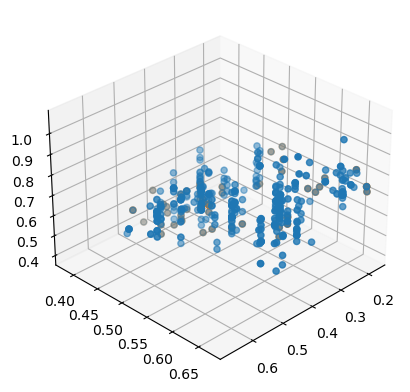

  2%|▏         | 1/50 [02:13<1:48:49, 133.26s/it]

leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[19, 20, 0, 18, 11]
0.31744907159999997
0.5573774722
0.6632217622999999
0.7690660523999998
0.7690660523999998
maxIjogbon 0.266903016
cont_distance 0.669677499
C2 0.7690660523999998
end_valmod 0.8
sum 0.11777908857142855
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
co

maxIjogbon 0.299491969
cont_distance 0.669677499
C2 0.7447635511999999
end_valmod 0.875
sum 0.11067296795238095
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 6, 13, 0, 17]
0.2781694409
0.4310634564
0.5380461029999999
0.5763413216
0.5763413216
maxIjogbon 0.423034124
cont_distance 0.446947035
C2 0.5763413216
end_valmod 0.75
sum 0.11366438009523812
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 15, 0, 13, 16]
0.3331702474
0.599085388
0.6977149677999999
0.7963445475999998
0.7963445475999998
maxIjogbon 0.438764182
cont_distance 0.642858658
C2 0.7963445475999998
end_valmod 0.875
sum 0.14988581747619048
leader <__main__.Particle object at 0x00000184F020FC40>
[6, 0, 1, 20, 2]
0.1858229649
0.2646391525999999
0.36250811559999996
0.4222715279999999
0.4222715279999999
maxIjogbon 0.423034124
cont_distance 0.446947035
C2 0.4222715279999999
end_valmod 0.9166666666666666
sum 0.16502986561904762
leader <__main__.Particle object at 0x00000184F020FC40>
[4, 2, 17, 20, 19]
0.27

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 6, 11, 18]
0.3531023179
0.6108808607999999
0.7702285394999999
0.8760728296
0.8760728296
maxIjogbon 0.267516943
cont_distance 0.669677499
C2 0.8760728296
end_valmod 0.75
sum 0.11268798628571429
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 10, 15, 0, 17]
0.3335831685
0.6098820876000001
0.7597010134000001
0.797996232
0.797996232
maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.797996232
end_valmod 0.75
sum 0.11741479876190476
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 14, 1]
0.2887182481
0.39865768220000003
0.5503246358
0.6185365504
0.6185365504
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6185365504
end_valmod 0.7777777777777778
sum 0.11153371252380953
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 11, 0, 1, 2]
0.2798680481
0.51489278199999

leader <__main__.Particle object at 0x00000184F020FC40>
[20, 14, 8, 19, 13]
0.33069948839999996
0.5809384414
0.7103902780999999
0.7864615115999999
0.7864615115999999
maxIjogbon 0.403059166
cont_distance 0.491591393
C2 0.7864615115999999
end_valmod 0.875
sum 0.12911310938095238
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 8, 3]
0.0680766214
0.1742587934
0.23835134840000002
0.27230648560000004
0.27230648560000004
maxIjogbon 0.467361064
cont_distance 0.266903016
C2 0.27230648560000004
end_valmod 0.875
sum 0.21455977476190474
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 12, 19, 1]
0.1549951711
0.3993797492
0.5592003896000001
0.6199806844
0.6199806844
maxIjogbon 0.503587055
cont_distance 0.495201728
C2 0.6199806844
end_valmod 0.9285714285714286
sum 0.17977835757142857
leader <__main__.Particle object at 0x00000184F020FC40>
[2, 7, 0, 1, 3]
0.1288019416
0.2817480378
0.3080656487
0.33438325960000004
0.33438325960000004
maxIjogbon 0.44158265
cont_distance

leader <__main__.Particle object at 0x00000184F020FC40>
[9, 12, 14, 3, 0]
0.3092347069
0.5142192002
0.6198023144
0.62706715
0.62706715
maxIjogbon 0.295152355
cont_distance 0.508226398
C2 0.62706715
end_valmod 0.875
sum 0.12175339109523807
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 4]
0.1386640224
0.36671745180000004
0.47973954600000007
0.5546560896000001
0.5546560896000001
maxIjogbon 0.490886818
cont_distance 0.446947035
C2 0.5546560896000001
end_valmod 0.8
sum 0.13087248385714284
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 0, 1, 2]
0.2472440122
0.3843966384
0.41851812259999993
0.4526396067999999
0.4526396067999999
maxIjogbon 0.503587055
cont_distance 0.446947035
C

leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 9, 12, 6]
0.3476008404
0.5998779057999999
0.7777950524999999
0.8540669195999999
0.8540669195999999
maxIjogbon 0.420679736
cont_distance 0.508226398
C2 0.8540669195999999
end_valmod 0.9333333333333333
sum 0.15323728033333328
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 6, 18]
0.15205045749999999
0.393490322
0.5425735955
0.6082018299999999
0.6082018299999999
maxIjogbon 0.423034124
cont_distance 0.446947035
C2 0.6082018299999999
end_valmod 0.75
sum 0.11803256200000001
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 9, 12, 19, 18]
0.3597256863
0.6423178382000001
0.8219622435
0.9025663032000001
0.9025663032000001
maxIjogbon 0.388765402
cont_distance 0.508226398
C2 0.9025663032000001
end_valmod 0.9285714285714286
sum 0.14660841852380951
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 8, 1]
0.2662494104
0.43717504579999994
0.48291812269999984
0.5286611995999999
0.5286611995

maxIjogbon 0.467361064
cont_distance 0.508226398
C2 0.5650416808000001
end_valmod 0.7777777777777778
sum 0.15800358390476188
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 14, 12, 19, 18]
0.3580621858
0.6356638361999999
0.8153082414999998
0.8959123011999999
0.8959123011999999
maxIjogbon 0.428657641
cont_distance 0.495201728
C2 0.8959123011999999
end_valmod 0.9
sum 0.15593192147619048
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 18, 8, 0]
0.27868936980000003
0.4472873536
0.5517307356
0.5784210371999999
0.5784210371999999
maxIjogbon 0.403059166
cont_distance 0.446947035
C2 0.5784210371999999
end_valmod 0.7777777777777778
sum 0.11796575814285715
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 10, 14, 17, 20]
0.1928963437
0.507287252
0.6885954527
0.7715853748
0.7715853748
maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.7715853748
end_valmod 0.75
sum 0.11904740595238095
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 18, 14, 8,

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 0, 2, 19]
0.26991875639999996
0.4297461267999999
0.48654235519999994
0.5433385836
0.5433385836
maxIjogbon 0.601263673
cont_distance 0.446947035
C2 0.5433385836
end_valmod 0.9
sum 0.2101940633809524
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 17, 14, 1, 0]
0.2852859472
0.46838351759999997
0.5857545715
0.6048073467999999
0.6048073467999999
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6048073467999999
end_valmod 0.6666666666666666
sum 0.1083405043809524
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 15, 4, 7, 20]
0.17585

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.5592748491999999
end_valmod 0.9166666666666666
sum 0.181217087
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 15, 16, 19]
0.34055405290000007
0.5023292918000001
0.7198663843
0.8258797696
0.8258797696
maxIjogbon 0.438764182
cont_distance 0.642858658
C2 0.8258797696
end_valmod 0.8888888888888888
sum 0.15287784442857144
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 11, 14, 17, 1]
0.17347488309999998
0.4808852659999999
0.6365515384999999
0.6938995323999999
0.6938995323999999
maxIjogbon 0.495201728
cont_distance 0.669677499
C2 0.6938995323999999
end_valmod 0.7142857142857143
sum 0.1290628760952381
leader <__main__.Particle object at 0x00000184F020FC40>
[8, 16, 9, 10, 0]
0.28261699430000004
0.5870445138
0.7494370757
0.8101843579999999
0.8101843579999999
maxIjogbon 0.495201728
cont_distance 0.642858658
C2 0.8101843579999999
end_valmod 0.7142857142857143
sum 0.17100944957142855
leader <__main__.Particle object

maxIjogbon 0.421022636
cont_distance 0.446947035
C2 0.5286611995999999
end_valmod 0.75
sum 0.16852951376190475
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 5, 14, 0, 1]
0.2745221586
0.42532836320000006
0.5426994171
0.5617521924
0.5617521924
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.5617521924
end_valmod 0.7142857142857143
sum 0.11291509409523809
leader <__main__.Particle object at 0x00000184F020FC40>
[4, 0, 13, 1, 2]
0.2012212946
0.26968649279999996
0.37249540499999995
0.40661688919999994
0.40661688919999994
maxIjogbon 0.490886818
cont_distance 0.34343714
C2 0.40661688919999994
end_valmod 0.9
sum 0.14233591033333334
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 9, 2]
0.263722938
0.34866706199999997
0.45266396130000003
0.51855531
0.51855531
maxIjogbon 0.467361064
cont_distance 0.508226398
C2 0.51855531
end_valmod 0.9090909090909091
sum 0.15990529757142855
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 7, 0, 4, 5]
0.281708763

maxIjogbon 0.467361064
cont_distance 0.446947035
C2 0.42202595719999997
end_valmod 0.875
sum 0.17705389614285713
leader <__main__.Particle object at 0x00000184F020FC40>
[12, 0, 14, 6, 3]
0.2812563604
0.36443202960000004
0.4967668381000001
0.530783368
0.530783368
maxIjogbon 0.423034124
cont_distance 0.495201728
C2 0.530783368
end_valmod 0.8571428571428571
sum 0.12402753066666666
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 14, 19, 18]
0.308542013
0.43830521200000006
0.6172275503000001
0.69783161
0.69783161
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.69783161
end_valmod 0.7142857142857143
sum 0.12542656885714287
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 12, 0, 13, 19]
0.30437022030000005
0.5290019722
0.6050732057
0.6811444392
0.6811444392
maxIjogbon 0.669677499
cont_distance 0.495201728
C2 0.6811444392
end_valmod 0.9
sum 0.23582927971428572
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 8, 0, 9, 1]
0.27534453070000003
0.42529085060000005
0.4951662657
0.5650416808000001
0.5650416808000001
maxIjogbon 0.467361064
cont_distance 0.508226398
C2 0.5650416808000001
end_valmod 0.7777777777777778
sum 0.15800358390476188
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 15, 16, 8, 19]
0.36724435450000004
0.6672336021999999
0.8642231549
0.9326409760000001
0.9326409760000001
maxIjogbon 0.403059166
cont_distance 0.642858658
C2 0.9326409760000001
end_valmod 0.9
sum 0.13522359814285714
leader <__main__.Particle

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 16, 18, 17]
0.3619639580999999
0.6286041412
0.8343476316
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 6, 11, 1]
0.2915510335
0.404323253
0.5438471668
0.629867692
0.629867692
maxIjogbon 0.420679736
cont_distance 0.669677499
C2 0.629867692
end_valmod 0.8
sum 0.14437079923809523
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 10, 19, 18]
0.320130156
0.46148149800000005
0.6635801223000001
0.744184182
0.744184182
maxIjogbon 0.379449102
cont_distance 0.607472823
C2 0.744184182
end_valmod 0.7142857142857143
sum 0.12275171933333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 14, 19, 0]
0.3040091868
0.4979269876
0.637

maxIjogbon 0.382952186
cont_distance 0.446947035
C2 0.8232139075999999
end_valmod 0.7142857142857143
sum 0.15559402147619047
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 15, 1, 2, 3]
0.0971481734
0.30582005399999995
0.36625914909999996
0.3885926936
0.3885926936
maxIjogbon 0.44158265
cont_distance 0.557618536
C2 0.3885926936
end_valmod 0.875
sum 0.15958772171428573
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 12, 1, 2]
0.262420471
0.34606212799999997
0.47922395780000004
0.5133454420000001
0.5133454420000001
maxIjogbon 0.503587055
cont_distance 0.495201728
C2 0.5133454420000001
end_valmod 0.9285714285714286
sum 0.18830273995238092
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 14, 8, 15]
0.1506640698
0.3394336902
0.5202041239999999
0.6026562792
0.6026562792
maxIjogbon 0.495201728
cont_distance 0.557618536
C2 0.6026562792
end_valmod 0.5
sum 0.1559004598095238
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 18]
0.2784

maxIjogbon 0.467361064
cont_distance 0.669677499
C2 0.6296221212
end_valmod 0.7777777777777778
sum 0.15734139514285714
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 13, 14]
0.2813344426
0.3838900712
0.5054984751
0.5890013284
0.5890013284
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.5890013284
end_valmod 0.7777777777777778
sum 0.11153371252380953
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 10, 0, 18]
0.320130156
0.544936537
0.7053076417999999
0.7441841819999999
0.7441841819999999
maxIjogbon 0.379449102
cont_distance 0.607472823
C2 0.7441841819999999
end_valmod 0.7142857142857143
sum 0.12275171933333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 7, 0, 8, 1]
0.266731386
0.43910294819999995
0.48484602509999986
0.5305891019999999
0.5305891019999999
maxIjogbon 0.357032701
cont_distance 0.446947035
C2 0.5305891019999999
end_valmod 0.7777777777777778
sum 0.1200584240952381
leader <__main__.Particle object at 0x00000184F020FC4

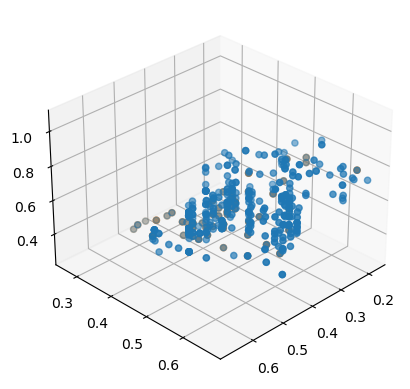

  4%|▍         | 2/50 [04:27<1:46:57, 133.70s/it]

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 15, 0, 18]
0.3151447273
0.5349656796
0.685365927
0.7242424672
0.7242424672
maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.7242424672
end_valmod 0.7142857142857143
sum 0.1239536057142857
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.654

maxIjogbon 0.502584073
cont_distance 0.495201728
C2 0.6085767672000001
end_valmod 0.8888888888888888
sum 0.1298882396190476
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 5, 20, 1, 19]
0.1330064283
0.32107571660000006
0.4712454184
0.5320257132
0.5320257132
maxIjogbon 0.490670485
cont_distance 0.446947035
C2 0.5320257132
end_valmod 0.8
sum 0.1473139065238095
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 14]
0.1546341376
0.3986576822
0.5503246358
0.6185365504
0.6185365504
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6185365504
end_valmod 0.7777777777777778
sum 0.11153371252380953
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 18, 1, 2, 3]
0.08026286
0.2382788004
0.2987178955
0.32105144
0.32105144
maxIjogbon 0.502584073
cont_distance 0.388765402
C2 0.32105144
end_valmod 0.9090909090909091
sum 0.1668305513809524
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 3, 20, 1, 19]
0.1127398339
0.240009339
0.3901790408
0.450959

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 5, 11, 20, 18]
0.17807042359999997
0.4112037072
0.6287104506999999
0.7122816943999999
0.7122816943999999
maxIjogbon 0.256454083
cont_distance 0.669677499
C2 0.7122816943999999
end_valmod 0.7142857142857143
sum 0.10900381304761905
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 9, 1, 19]
0.1562976381
0.40198468319999997
0.5644102576
0.6251905524
0.6251905524
maxIjogbon 0.421022636
cont_distance 0.508226398
C2 0.6251905524
end_valmod 0.8181818181818182
sum 0.1513809151904762
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 17, 20, 19, 18]
0.1635939818
0.4037784008
0.5737718675
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 3, 14, 20, 19]
0.1428461979
0.300222067
0.4849625686
0.5713847916
0.5713847916
maxIjogbon 0.428657641
cont_distance 0.49159139

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 12, 2, 20]
0.1283363605
0.2947782716
0.4535820296
0.513345442
0.513345442
maxIjogbon 0.503587055
cont_distance 0.495201728
C2 0.513345442
end_valmod 0.9285714285714286
sum 0.18830273995238092
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 14, 1, 20]
0.1472503321
0.3631880922
0.5252538496
0.5890013284
0.5890013284
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.5890013284

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 20, 14, 19]
0.1699250763
0.4085375806
0.5888136464
0.6797003052000001
0.6797003052000001
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6797003052000001
end_valmod 0.9166666666666666
sum 0.14171147633333334
leader <__main__.Particle object at 0x00000184F020FC40>
[6, 20, 0, 19, 11]
0.26039675009999996
0.5031761299999999
0.6118713993999999
0.7205666687999999
0.7205666687999999
maxIjogbon 0.420679736
cont_distance 0.669677499
C2 0.7205666687999999
end_valmod 0.8333333333333334
sum 0.13947205466666665
leader <__main__.Particle object at 0x0000018

leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 15, 2]
0.26866215179999997
0.3585454896
0.46748160270000005
0.5383121652
0.5383121652
maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.5383121652
end_valmod 0.875
sum 0.1220818430952381
leader <__main__.Particle object at 0x00000184F020FC40>
[1, 14, 12, 0, 18]
0.21376695349999997
0.44964108439999995
0.5875579702
0.6264345104
0.6264345104
maxIjogbon 0.428657641
cont_distance 0.495201728
C2 0.6264345104
end_valmod 0.6666666666666666
sum 0.11694120147619048
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 8, 19]
0.13216529989999998
0.3024361504
0.46024337849999997
0.5286611995999999
0.5286611995999999
maxIjogbon 0.421022636
cont_distance 0.446947035
C2 0.5286611995999999
end_valmod 0.75
sum 0.16852951376190475
leader <__main__.Particle object at 0x00000184F020FC40>
[2, 20, 19, 0, 18]
0.18557359880000002
0.400261769
0.5225933482
0.5614698884
0.5614698884
maxIjogbon 0.502584073
cont_distance 0.44694703

maxIjogbon 0.403059166
cont_distance 0.557618536
C2 0.6754975128
end_valmod 0.7142857142857143
sum 0.11701981566666668
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 12]
0.1283363605
0.2947782716
0.4191305657
0.513345442
0.513345442
maxIjogbon 0.503587055
cont_distance 0.495201728
C2 0.513345442
end_valmod 0.9285714285714286
sum 0.18830273995238092
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 3, 8, 11]
0.1352666011
0.33922063019999993
0.4474083529
0.5410664044
0.5410664044
maxIjogbon 0.420310776
cont_distance 0.669677499
C2 0.5410664044
end_valmod 0.8888888888888888
sum 0.1682831566190476
leader <__main__.Particle object at 0x00000184F020FC40>
[5, 19, 14, 1, 12]
0.26958532690000003
0.5124999727999999
0.6793911994999999
0.7479641476
0.7479641476
maxIjogbon 0.428657641
cont_distance 0.495201728
C2 0.7479641476
end_valmod 0.7142857142857143
sum 0.11311319161904762
leader <__main__.Particle object at 0x00000184F020FC40>
[12, 3, 14, 8, 20]
0.3258896

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.5302543951999998
end_valmod 0.9090909090909091
sum 0.14070664019047618
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 20, 11, 4]
0.1791951915
0.42707781100000003
0.616623992
0.716780766
0.716780766
maxIjogbon 0.310969875
cont_distance 0.669677499
C2 0.716780766
end_valmod 0.8333333333333334
sum 0.11722308009523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 15, 1, 20]
0.1538530464
0.37639352079999994
0.5516647067999999
0.6154121856
0.6154121856
maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.6154121856
end_valmod 0.75
sum 0.11576405252380953
leader <__main__.Particle object at 0x00000184F020FC40>
[13, 20, 19, 0, 1]
0.2428498543
0.43771425960000004
0.5402220739000001
0.5592748492
0.5592748492
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.5592748492
end_valmod 0.9166666666666666
sum 0.181217087
leader <__main__.Particle object at 0x00000184F020FC40>
[2, 8, 10, 13, 0]
0.1820561335
0.35

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.5592748492
end_valmod 0.9166666666666666
sum 0.181217087
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 4, 2]
0.1120052118
0.3133998306
0.39976311419999994
0.4480208471999999
0.4480208471999999
maxIjogbon 0.490886818
cont_distance 0.446947035
C2 0.4480208471999999
end_valmod 0.9
sum 0.13719027442857146
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 14, 11, 19]
0.3709769367
0.6318624874000001
0.8388760354
0.9475713048
0.9475713048
maxIjogbon 0.34343714
cont_distance 0.669677499
C2 0.9475713048
end_valmod 0.9090909090909091
sum 0.14836068323809526
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 15, 20, 6, 19]
0.1689357709
0.449395249
0.6072638697999999
0.6757430835999999
0.6757430835999999
maxIjogbon 0.423034124
cont_distance 0.557618536
C2 0.6757430835999999
end_valmod 0.7777777777777778
sum 0.11038253861904762
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 10, 3, 19]

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 2, 12, 16, 20]
0.173569451
0.3772763198
0.5852972347
0.6942778039999999
0.6942778039999999
maxIjogbon 0.492027414
cont_distance 0.642858658
C2 0.6942778039999999
end_valmod 0.8888888888888888
sum 0.15652576371428573
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 12, 19, 18]
0.174818936
0.439027279
0.6186716843
0.699275744
0.699275744
maxIjogbon 0.502584073
cont_distance 0.495201728
C2 0.699275744
end_valmod 0.9166666666666666
sum 0.1471844346190476
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 6, 18]
0.15205045749999999
0.393490322
0.5425735955
0.6082018299999999
0.6082018299999999
maxIjogbon 0.423034124
cont_distance 0.446947035
C2 0.6082018299999999
end_valmod 0.75
sum 0.11803256200000001
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 14, 20, 1, 19]
0.154634

maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6788113859999999
end_valmod 0.7777777777777778
sum 0.11448681480952382
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 12, 1, 2]
0.12833636050000002
0.3460621280000001
0.4792239578000001
0.5133454420000001
0.5133454420000001
maxIjogbon 0.503587055
cont_distance 0.495201728
C2 0.5133454420000001
end_valmod 0.9285714285714286
sum 0.18830273995238092
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 10, 20, 1, 4]
0.1576837852
0.43686213500000004
0.5784933414
0.6307351408
0.6307351408
maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.6307351408
end_valmod 0.6
sum 0.10569453442857143
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 18, 19, 1

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[1, 18, 20, 19, 17]
0.23980508299999997
0.48115214519999994
0.6505642903
0.7305870283999999
0.7305870283999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.7305870283999999
end_valmod 0.75
sum 0.1263283551904762
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 7, 8, 2]
0.1030212809
0.2441481124
0.37032611309999997
0.4120851236
0.4120851236
maxIjogbon 0.44158265
cont_distance 0.422094951
C2 0.4120851236
end_valmod 0.7777777777777778
sum 0.15617996971428572
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 6, 14, 20]
0.13965831239999998
0.3174221754
0.46477940679999996
0.5586332495999999
0.5586332495999999
maxIjogbon 0.423034124
cont_distance 0.491591393
C2 0.5586332495999999
end_valmod 0.7142857142857143
sum 0.11234003004761905
leader <__main__.Particle object at 0x00000184F020FC4

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 14, 3, 20]
0.1354623924
0.3396122128
0.48989003049999996
0.5418495696
0.5418495696
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.5418495696
end_valmod 0.9
sum 0.1292734843809524
leader <__main__.Particle object at 0x00000184F020FC40>
[11, 20, 14, 18, 0]
0.40060138259999994
0.6227211725999999
0.7599159914
0.7987925316
0.7987925316
maxIjogbon 0.266903016
cont_distance 0.669677499
C2 0.7987925316
end_valmod 0

maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 16, 1, 19]
0.1697608641
0.4289111352
0.6182631616
0.6790434564
0.6790434564
maxIjogbon 0.492027414
cont_distance 0.642858658
C2 0.6790434564
end_valmod 0.8
sum 0.13068413776190477
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 14, 8, 19]
0.16227166389999997
0.41393273480000004
0.5806688345
0.6490866555999999
0.6490866555999999
maxIjogbon 0.403059166
cont_distance 0.491591393
C2 0.6490866555999999
end_valmod 0.75
sum 0.11039534457142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 15, 2, 20]
0.1345780413
0.3072616332
0.

maxIjogbon 0.357032701
cont_distance 0.446947035
C2 0.6404978111999999
end_valmod 0.75
sum 0.12514888414285716
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 2, 1]
0.1205437072
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 7, 2]
0.1210256828
0.3314407726
0.42682452719999997
0.48410273119999997
0.48410273119999997
maxIjogbon 0.357032701
cont_distance 0.446947035
C2 0.48410273119999997
end_valmod 0.9
sum 0.12292362714285716
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 20, 8, 18]
0.14460525929999998
0.35789794659999996
0.5128541953999999
0.5784210371999999
0.5784210371999999
maxIjogbon 0.403059166
cont_distance 0.446947035
C2 0.5784210371999999
end_valmod 0.7777777777777778
sum 0.11796575814285715
leader <__main__.Particle object at 0x00000184F020FC40>
[

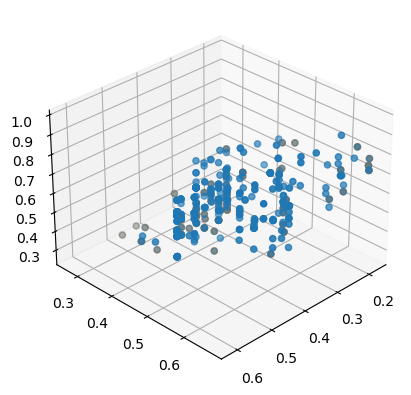

  6%|▌         | 3/50 [06:43<1:45:45, 135.00s/it]

leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2

leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 12]
0.3089030465
0.522482318
0.6108790309999999
0.6992757439999999
0.6992757439999999
maxIjogbon 0.502584073
cont_distance 0.495201728
C2 0.6992757439999999
end_valmod 0.9166666666666666
sum 0.1471844346190476
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 11, 20, 15, 19]
0.20915182650000003
0.5522391528
0.7391179329
0.8366073060000001
0.8366073060000001
maxIjogbon 0.2753143
cont_distance 0.669677499
C2 0.8366073060000001
end_valmod 0.75
sum 0.12445330066666666
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446

maxIjogbon 0.403059166
cont_distance 0.446947035
C2 0.6079562592
end_valmod 0.7777777777777778
sum 0.11796575814285715
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 9, 15, 0, 17]
0.323658526
0.5701835176000001
0.7200024434000001
0.758297662
0.758297662
maxIjogbon 0.236773839
cont_distance 0.557618536
C2 0.758297662
end_valmod 0.7142857142857143
sum 0.09538476695238095
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[2, 20, 14, 0, 1]
0.1731814537
0.3

maxIjogbon 0.2753143
cont_distance 0.669677499
C2 0.8565490208
end_valmod 0.7142857142857143
sum 0.13824550023809523
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 17]
0.2

maxIjogbon 0.503587055
cont_distance 0.495201728
C2 0.5133454420000001
end_valmod 0.9285714285714286
sum 0.18830273995238092
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 13, 3, 18]
0.3009914233
0.5066590715999999
0.6214878754
0.6676292511999999
0.6676292511999999
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.6676292511999999
end_valmod 0.9090909090909091
sum 0.1404700004285714
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 2, 0, 19, 1]
0.2546278177
0.36061423919999996
0.42139453399999993
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x000001

maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.7061111623999999
end_valmod 0.8888888888888888
sum 0.15059197357142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 6, 16, 20, 18]
0.1746088038
0.40272099619999996
0.6148639714999999
0.6984352152
0.6984352152
maxIjogbon 0.423034124
cont_distance 0.642858658
C2 0.6984352152
end_valmod 0.5
sum 0.10679677590476193
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 8, 18]
0.28607317

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.5592748492
end_valmod 0.9166666666666666
sum 0.181217087
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 2, 0, 8, 1]
0.2395905998
0.33053980339999994
0.37628288029999996
0.42202595719999997
0.42202595719999997
maxIjogbon 0.467361064
cont_distance 0.446947035
C2 0.42202595719999997
end_valmod 0.875
sum 0.17705389614285713
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 14, 19, 0, 18]
0.308542013
0.5366234906
0.6589550698
0.6978316099999999
0.6978316099999999
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6978316099999999
end_valmod 0.7142857142857143
sum 0.12542656885714287
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 19, 8, 0]
0.28154034910000003
0.4529893122
0.5631346528
0.5898249543999999
0.5898249543999999
maxIjogbon 0.420310776
cont_distance 0.446947035
C2 0.5898249543999999
end_valmod 0.8888888888888888
sum 0.17939041638095238
leader <__main__.Particle object at 0x00000184F02

maxIjogbon 0.421022636
cont_distance 0.495201728
C2 0.6505307896
end_valmod 0.9090909090909091
sum 0.18019715176190476
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 19, 3, 18]
0.3009914233
0.49189146059999994
0.6214878754
0.6676292511999999
0.6676292511999999
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.6676292511999999
end_valmod 0.9090909090909091
sum 0.1404700004285714
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 10, 12, 0, 1]
0.3080990444
0.5589138394
0.6770069603
0.6960597355999999
0.6960597355999999
maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.6960597355999999
end_valmod 0.8888888888888888
sum 0.12632823738095236
leader <__main__.Particle object at 0x00000184F020FC40>

maxIjogbon 0.428657641
cont_distance 0.495201728
C2 0.6497071635999999
end_valmod 0.8888888888888888
sum 0.1163022380952381
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 0, 19, 18]
0.2937265877
0.4773617893999999
0.5579658490999999
0.6385699087999999
0.6385699087999999
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.6385699087999999
end_valmod 0.9166666666666666
sum 0.14988139285714283
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 14, 18]
0.308542013
0.43830521200000006
0.6097959305
0.69783161
0.69783161
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.69783161
end_valmod 0.7142857142857143
sum 0.12542656885714287
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 14, 2, 3]
0.0905454591
0.21919646879999996
0.3398482919
0.36218183639999996
0.36218183639999996
maxIjogbon 0.44158265
cont_distance 0.491591393
C2 0.36218183639999996
end_valmod 0.8888888888888888
sum 0.15535738171428573
leader <__main__.Particle object at 0x0000

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 10, 15, 7, 19]
0.3792249645
0.7011656796000001
0.8966264014
0.9805634160000001
0.9805634160000001
maxIjogbon 0.417275195
cont_distance 0.607472823
C2 0.9805634160000001
end_valmod 0.9090909090909091
sum 0.15345198566666668
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 11, 1, 2]
0.2798680481
0.38095728219999997
0.5490142662
0.5831357504000001
0.5831357504000001
maxIjogbon 0.467361064
cont_distance 0.669677499
C2 0.5831357504000001
end_valmod 0.9090909090909091
sum 0.1592431088095238
leader <__main__.

maxIjogbon 0.357032701
cont_distance 0.446947035
C2 0.5907379735999999
end_valmod 0.8
sum 0.11660583657142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 9, 3]
0.0922089596
0.22252346980000004
0.310748363
0.3688358384
0.3688358384
maxIjogbon 0.467361064
cont_distance 0.508226398
C2 0.3688358384
end_valmod 0.9090909090909091
sum 0.19741117619047616
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 14, 16, 2]
0.1475664893
0.3332385292
0.5109113825
0.5902659572
0.5902659572
maxIjogbon 0.44158265
cont_distance 0.642858658
C2 0.5902659572
end_valmod 0.7142857142857143
sum 0.15103449357142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 17, 19, 18]
0.2976780923
0.41657737059999994
0.5737718675
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 16, 0, 19, 18]
0.32366873949999997
0.597130

leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 9, 8, 18]
0.3368958151
0.5784678552
0.7456799766000001
0.8112468184000001
0.8112468184000001
maxIjogbon 0.266903016
cont_distance 0.508226398
C2 0.81

maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.6956847984000001
end_valmod 0.7777777777777778
sum 0.11383685595238092
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 19]
0.

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 12, 5, 19, 18]
0.3364344765
0.5931304846000001
0.7287974043000001
0.8094014640000001
0.8094014640000001
maxIjogbon 0.490670485
cont_distance 0.495201728
C2 0.8094014640000001
end_valmod 0.9
sum 0.1436397057142857
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 3, 1, 2, 4]
0.07457534390000001
0.163680359
0.2500436426
0.2983013756
0.2983013756
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013756
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[3, 0, 14, 8, 1]
0.123961

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.6385699087999999
end_valmod 0.9166666666666666
sum 0.14988139285714283
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 0, 1, 19]
0.2739028228
0.4377142596
0.49849455439999996
0.5592748491999999
0.5592748491999999
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.5592748491999999
end_valmod 0.9166666666666666
sum 0.181217087
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 13, 11, 19]
0.32181779740000005
0.46485678080000004
0.6422394782
0.7509347476
0.7509347476
maxIjogbon 0.420310776
cont_distance 0.669677499
C2 0.7509347476
end_valmod 0.8888888888888888
sum 0.19001495685714284
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20,

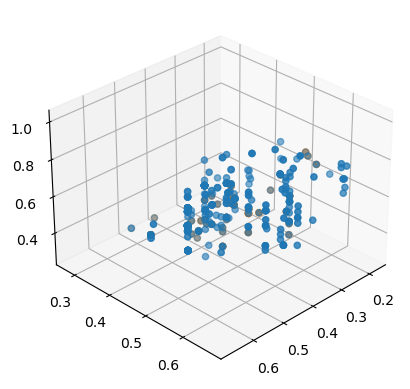

  8%|▊         | 4/50 [08:55<1:42:23, 133.56s/it]

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.5774061

maxIjogbon 0.503587055
cont_distance 0.495201728
C2 0.5014767059999999
end_valmod 0.9230769230769231
sum 0.18132762257142854
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 15, 1, 12, 20]
0.16902950519999999
0.44958271760000007
0.5819031445
0.6761180208
0.6761180208
maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.6761180208
end_valmod 0.875
sum 0.1205325780952381
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 7, 1, 20, 19]
0.1476844934
0.379787977
0.5043157506
0.5907379736
0.5907379736
maxIjogbon 0.357032701
cont_distance 0.446947035
C2 0.5907379736
end_valmod 0.8
sum 0.11660583657142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 14, 20, 19]
0.1699250763
0.4085375806
0.5932780822
0.6797003052
0.6797003052
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6797003052
end_valmod 0.916666666

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 19, 2, 20]
0.1205437072
0.279192965
0.4224114164
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 4, 14, 1, 2]
0.1164696476
0.2993173434
0

maxIjogbon 0.420310776
cont_distance 0.446947035
C2 0.4991259776
end_valmod 0.6666666666666666
sum 0.16727128495238094
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[10, 0, 20, 1, 2]
0.3218053169
0.4006215046
0.5241323957999999
0.55825388
0.55825388
maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.55825388
end_valmod 0.875
sum 0.12787750238095238
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 20, 1, 19]
0.1398187123
0.3483248526
0.4984945544
0.5592748492
0.5592748492
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.5592748492
end_valmod 0.9166666666666666
sum 0.181217087
leader <__main__.Particle object at 0x00000184F020FC40>
[1, 20, 0, 19, 2]
0.17770203310000002
0.368582372
0.42537860040000003

maxIjogbon 0.421022636
cont_distance 0.508226398
C2 0.6251905524
end_valmod 0.8181818181818182
sum 0.1513809151904762
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 18, 11, 1]
0.3036758794
0.42857294479999997
0.5923465504
0.6783670756
0.6783670756
maxIjogbon 0.256454083
cont_distance 0.669677499
C2 0.6783670756
end_valmod 0.75
sum 0.10345418495238094
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 6, 14, 0, 18]
0.29356618779999993
0.4618569501999999
0.5990517689999999
0.6379283091999999
0.6379283091999999
maxIjogbon 0.423034124
cont_distance 0.491591393
C2 0.6379283091999999
end_valmod 0.5
sum 0.10618100238095239
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 15, 8, 2]
0.11657363940000001
0.2712528294
0.42453554709999997
0.46629455760000005
0.46629455760000005
maxIjogbon 0.44158265
cont_distance 0.557618536
C2 0.46629455760000005
end_valmod 0.7142857142857143
sum 0.15000842166666667
leader <__main__.Particle object at 0x00000184F020FC40>
[1

maxIjogbon 0.421022636
cont_distance 0.446947035
C2 0.5286611995999999
end_valmod 0.75
sum 0.16852951376190475
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 17, 1, 20, 2]
0.11711140630000001
0.3108132498
0.40868221280000006
0.46844562520000005
0.46844562520000005
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.46844562520000005
end_valmod 0.8888888888888888
sum 0.12440371785714287
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 1, 8, 20]
0.1247814944
0.31825041679999994
0.4277409725
0.4991259776
0.4991259776
maxIjogbon 0.420310776
cont_distance 0.446947035
C2 0.4991259776
end_valmod 0.6666666666666666
sum 0.16727128495238094
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 2, 7, 1]
0.1210256828
0.33144077260000004
0.4228404608
0.48410273119999997
0.48410273119999997
maxIjogbon 0.357032701
cont_distance 0.446947035
C2 0.48410273119999997
end_valmod 0.9
sum 0.12292362714285716
leader <__main__.Particle object at 0x00000184F020FC40>
[10, 

maxIjogbon 0.357032701
cont_distance 0.446947035
C2 0.6700330332
end_valmod 0.75
sum 0.12514888414285716
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 1, 19, 2]
0.11019271769999998
0.2890728634
0.3839746424
0.44077087079999994
0.44077087079999994
maxIjogbon 0.503587055
cont_distance 0.417275195
C2 0.44077087079999994
end_valmod 0.9090909090909091
sum 0.1891809200952381
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 7, 11, 3, 20]
0.16113678409999999
0.40669255839999996
0.5925875973
0.6445471364
0.6445471364
maxIjogbon 0.264922331
cont_distance 0.669677499
C2 0.6445471364
end_valmod 0.9
sum 0.11830558004761905
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 12, 20, 1]
0.14761136

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.45263960680000004
end_valmod 0.9090909090909091
sum 0.18006939376190476
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 14, 18, 17]
0.3468372316
0.5983506882
0.7738407256000001
0.8510124844
0.8510124844
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.8510124844
end_valmod 0.8
sum 0.1503795823809524
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 18, 8, 16]
0.1745474111
0.4384842292
0.607213

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 5, 3]
0.0689177498
0.1759410502
0.24087473359999997
0.2756709992
0.2756709992
maxIjogbon 0.490670485
cont_distance 0.2753143
C2 0.2756709992
end_valmod 0.9
sum 0.19113757571428572
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 13, 18, 17]
0.33202180629999994
0.5687198376
0.7145790243999999
0.7917507831999998
0.7917507831999998
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.7917507831999998
end_valmod 0.9166666666666666
sum 0.1634364073333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 9, 20, 1, 19]
0.1562976381


maxIjogbon 0.263721654
cont_distance 0.508226398
C2 0.7456160084000001
end_valmod 0.8
sum 0.11376469961904763
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 6, 20, 1, 2]
0.105567882
0.26463915260000004
0.38815004380000007
0.4222715280000001
0.4222715280000001
maxIjogbon 0.423034124
cont_distance 0.446947035
C2 0.4222715280000001
end_valmod 0.9166666666666666
sum 0.16502986561904762
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]


maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 8, 2]
0.10550648929999999
0.2491185292
0.38026694670000005
0.4220259572000001
0.4220259572000001
maxIjogbon 0.467361064
cont_distance 0.446947035
C2 0.4220259572000001
end_valmod 0.875
sum 0.17705389614285713
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 19, 1, 

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 14, 20, 19]
0.1699250763
0.4085375806
0.5932780822
0.6797003052
0.6797003052
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6797003052
end_valmod 0.9166666666666666
sum 0.14171147633333334
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 13, 18, 0]
0.2937265877
0.

maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.8774233415999999
end_valmod 0.8
sum 0.14588798633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 14, 8, 19]
0.16227166389999997
0.41393273480000004
0.5806688345
0.6490866555999999
0.6490866555999999
maxIjogbon 0.403059166
cont_distance 0.491591393
C2 0.6490866555999999
end_valmod 0.75
sum 0.11039534457142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[8, 0, 20, 1, 19]
0.2122362047
0.317711

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 3, 2]
0.0860810233
0.2615514536
0.3219905487
0.34432409319999996
0.34432409319999996
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.344324093199999

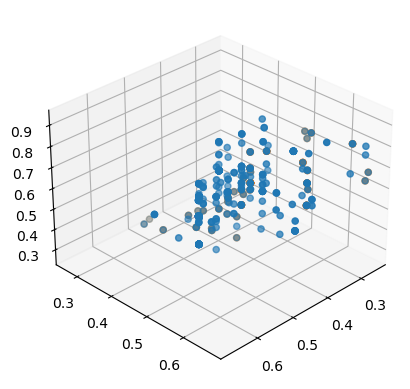

 10%|█         | 5/50 [11:08<1:40:01, 133.36s/it]

leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 13, 18, 14]
0.342885727
0.5904476790000001
0.7471707865
0.835206466
0.835206466
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.835206466
end_valmod 0.8571428571428571
sum 0.15416325542857143
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 8, 20, 1, 2]
0.

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 6, 18]
0.2861345679999999
0.47694536099999996
0.5425735955
0.6082018299999999
0.6082018299999999
maxIjogbon 0.423034124
cont_distance 0.446947035
C2 0.6082018299999999
end_valmod 0.75
sum 0.11803256200000001
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 8, 19, 0, 16]
0.31148250089999996
0.49756679099999995
0.6453076957999999
0.7095935616
0.7095935616
maxIjogbon 0.403059166
cont_distance 0.642858658
C2 0.7095935616
end_valmod 0.7777777777777778
sum 0.1314453857142857
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0,

leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 16, 19, 1]
0.1697608641
0.42891113520000007
0.6182631616
0.6790434564000001
0.6790434564000001
maxIjogbon 0.492027414
cont_distance 0.642858658
C2 0.6790434564000001
end_valmod 0.8
sum 0.13068413776190477
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C

maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.6648891224
end_valmod 0.7777777777777778
sum 0.1215597118095238
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 14, 2, 0]
0.28473418170000003
0.47414458840000007
0.5875315759000002
0.6026002848
0.6026002848
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6026002848
end_valmod 0.8
sum 0.12397087671428574
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 6, 20, 19, 1]
0.1322266926
0.3179567737999999
0.4681264755999999
0.5289067703999999
0.5289067703999999
maxIjogbon 0.423034124
cont_distance 0.446947035
C2 0.5289067703999999
end_valmod 0.8333333333333334
sum 0.15871207504761903
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 1, 20, 2]

maxIjogbon 0.669677499
cont_distance 0.495201728
C2 0.6811444391999999
end_valmod 0.9
sum 0.23582927971428572
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 14, 19, 1]
0.2887182481
0.39865768220000003
0.5577562556
0.6185365504
0.6185365504
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6185365504
end_valmod 0.7777777777777778
sum 0.11153371252380953
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 5, 15, 19]
0.16971550659999998
0.4288204202
0.5813726533000001
0.6788620264
0.6788620264
maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.6788620264
end_valmod 0.8
sum 0.11065353147619045
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 11, 19, 18]
0.1922665131
0.4739224332
0.6884619927
0.7690660523999999
0.7690660523999999
maxIjogbon 0.266903016
cont_distance 0.669677499
C2 0.7690660523999999
end_valmod 0.8
sum 0.11777908857142855
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 8, 17]
0.32436839390000005
0.553413

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.7917507831999998
end_valmod 0.9166666666666666
sum 0.1634364073333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 8, 1]
0.2662494104
0.43717504579999994
0.48291812269999984
0.5286611995999999
0.5286611995999999
maxIjogbon 0.421022636
cont_distance 0.446947035
C2 0.5286611995999999
end_valmod 0.75
sum 0.16852951376190475
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 7, 18, 0, 19]
0.3015923688
0.5088249138000001
0.6283055137
0.6700330332
0.6700330332
maxIjogbon 0.357032701
cont_distance 0.446947035
C2 0.6700330332
end_valmod 0.75
sum 0.12514888414285716
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 19, 8, 0]
0.28154034910000003
0.4529893122
0.5631346528
0.5898249543999999
0.5898249543999999
maxIjogbon 0.420310776
cont_distance 0.446947035
C2 0.5898249543999999
end_valmod 0.8888888888888888
sum 0.17939041638095238
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20

maxIjogbon 0.421022636
cont_distance 0.495201728
C2 0.6505307896
end_valmod 0.9090909090909091
sum 0.18019715176190476
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 19, 0, 18]
0.2937265877
0.4773617893999999
0.5996933685999999
0.6385699087999999
0.6385699087999999
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.6385699087999999
end_valmod 0.9166666666666666
sum 0.14988139285714283
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 2

maxIjogbon 0.357032701
cont_distance 0.491591393
C2 0.6204644528
end_valmod 0.6
sum 0.10808753442857141
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 19, 18, 17]
0.33202180629999994
0.5539522265999999
0.7145790243999999
0.7917507831999998
0.7917507831999998
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.7917507831999998
end_valmod 0.9166666666666666
sum 0.1634364073333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 14, 1, 2]
0.11762433750000001
0.303936103
0.4363758658
0.47049735000000004
0.47049735000000004
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.47049735000000004
end_valmod 0.8888888888888888
sum 0.122997139
leader <__main__.Particle object at 0

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 15, 19, 11, 18]
0.3821124772
0.6969698476
0.8862691767000002
0.9921134668
0.9921134668
maxIjogbon 0.388765402
cont_distance 0.669677499
C2 0.9921134668
end_valmod 0.8181818181818182
sum 0.1280926547142857
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 5, 2, 3]
0.06891774980000001
0.1759410502
0.25333745469999996
0.2756709992
0.2756709992
maxIjogbon 0.490670485
cont_distance 0.2753143
C2 0.2756709992
end_valmod 0.9
sum 0.19113757571428572
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 18]
0.278435649
0

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.4707709116
end_valmod 0.8888888888888888
sum 0.13143750461904763
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 5, 3]
0.0689177498
0.1759410502
0.24087473359999997
0.2756709992
0.2756709992
maxIjogbon 0.490670485
cont_distance 0.2753143
C2 0.2756709992
end_valmod 0.9
sum 0.19113757571428572
leader <__main__.Particle object at 0x00000184F020FC40>
[8, 20, 14, 19, 18]
0.28121910889999996
0.5450664184
0.7239887567
0.8045928163999999
0.8045928163999999
maxIjogbon 0.403059166
cont_distance 0.491591393
C2 0.8045928163999999
end_valmod 0.75
sum 0.1175586532857143
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 0, 19, 18]
0.2937265877
0.477361

maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.6534852052
end_valmod 0.6666666666666666
sum 0.10739800871428572
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 6, 1, 19]
0.2663108031
0.35384279220000003
0.4681264756
0.5289067704
0.5289067704
maxIjogbon 0.423034124
cont_distance 0.446947035
C2 0.5289067704
end_valmod 0.8333333333333334
sum 0.15871207504761903
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[13, 0, 1, 2, 3]
0.17876117579999998
0.22014749559999996
0.2805865906999999
0.30292013519999994
0.30292013519999994
maxIjogbon 0.503587055
cont_distance 0.34343714
C2 0.30292013519999994
end_valmod 0.9090909090909091
sum 0.19291715323809525
leader <__main__.Particle object at 0x00000184F020FC40

leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 12, 1, 20, 19]
0.1549951711
0.40903068779999996
0.5335584614
0.6199806844
0.6199806844
maxIjogbon 0.503587055
cont_distance 0.495201728
C2 0.6199806844
end_valmod 0.9285714285714286
sum 0.17977835757142857
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[15, 0, 14, 8, 1]
0.3179496306
0.41285184680000003
0.5569132023
0.6026562792
0.6026562792
maxIjogbon 0.495201728
cont_distance 0.557618536
C2 0.60265627

leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 11, 5, 19]
0.31500551340000005
0.4512322128000001
0.6544266621000001
0.7236856116000001
0.7236856116000001
maxIjogbon 0.369072145
cont_distance 0.669677499
C2 0.7236856116000001
end_valmod 0.8461538461538461
sum 0.1255257459047619
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 17, 18]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance

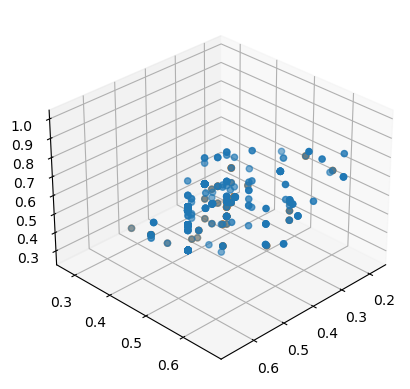

 12%|█▏        | 6/50 [13:20<1:37:36, 133.11s/it]

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.44

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 7, 2, 20]
0.12102568279999999
0.2801569162
0.4243393188
0.48410273119999997
0.48410273119999997
maxIjogbon 0.357032701
cont_distance 0.446947035
C2 0.48410273119999997
end_valmod 0.9
sum 0.12292362714285716
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[10, 17, 0, 9, 1]
0.3511597629
0.5359208338000001
0.6057962489000001
0.675671664
0.675671664
maxIjogbon 0.495201728
cont_dista

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 8, 1, 20, 19]
0.13216529989999998
0.317711203
0.4422389766
0.5286611996
0.5286611996
maxIjogbon 0.421022636
cont_distance 0.446947035
C2 0.5286611996
end_valmod 0.75
sum 0.16852951376190475
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 2

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 19, 2, 3]
0.0831138393
0.20433322919999997
0.31012181269999994
0.33245535719999997
0.33245535719999997
maxIjogbon 0.503587055
cont_distance 0.417275195
C2 0.33245535719999997
end_valmod 0.9230769230769231
sum 0.19067578866666665
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 

leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 7, 2, 20]
0.12102568279999999
0.2801569162
0.4243393188
0.48410273119999997
0.48410273119999997
maxIjogbon 0.357032701
cont_distance 0.446947035
C2 0.48410273119999997
end_valmod 0.9
sum 0.12292362714285716
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035


[0, 14, 15, 1, 20]
0.1686684717
0.435655222
0.6109264080000001
0.6746738868000002
0.6746738868000002
maxIjogbon 0.428657641
cont_distance 0.557618536
C2 0.6746738868000002
end_valmod 0.6666666666666666
sum 0.11455116095238095
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 15, 1, 19]
0.1612368519
0.4118631108
0.5841671128
0.6449474075999999
0.6449474075999999
maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.6449474075999999
end_valmod 0.75
sum 0.11576405252380953
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.1251

maxIjogbon 0.503587055
cont_distance 0.34343714
C2 0.30292013519999994
end_valmod 0.9090909090909091
sum 0.19291715323809525
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 8, 19]
0.13216529989999998
0.3024361504
0.46024337849999997
0.5286611995999999
0.5286611995999999
maxIjogbon 0.421022636
cont_distance 0.446947035
C2 0.5286611995999999
end_valmod 0.75
sum 0.16852951376190475
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 17, 19, 1]
0.1437702169
0.3769298408
0.5143005728000001
0.5750808676
0.5750808676
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.5750808676
end_valmod 0.7777777777777778
sum 0.11808592728571429
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 1, 8, 20]
0.1247814944
0.31825041679999994
0.4277409725
0.4991259776
0.4991259776
maxIjogbon 0.420310776
cont_distance 0.446947035
C2 0.4991259776
end_valmod 0.6666666666666666
sum 0.16727128495238094
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19

maxIjogbon 0.421022636
cont_distance 0.495201728
C2 0.6505307896
end_valmod 0.9090909090909091
sum 0.18019715176190476
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 1, 20, 2]
0.11315990169999998
0.2950072314
0.3928761944
0.45263960680000004
0.45263960680000004
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.45263960680000004
end_valmod 0.9090909090909091
sum 0.18006939376190476
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 7, 19, 18]
0.3015923688
0.4244059236
0.5894289735
0.6700330332
0.6700330332
maxIjogbon 0.357032701
cont_distance 0.446947035
C2 0.6700330332
end_valmod 0.75
sum 0.12514888414285716
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 17]
0.2976780923


maxIjogbon 0.357032701
cont_distance 0.491591393
C2 0.7111634296
end_valmod 0.75
sum 0.11983986380952381
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 1, 2, 3]
0.07573003379999999
0.22014749559999996
0.2805865906999999
0.30292013519999994
0.30292013519999994
maxIjogbon 0.503587055
cont_distance 0.34343714
C2 0.30292013519999994
end_valmod 0.9090909090909091
sum 0.19291715323809525
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 14, 19, 18]
0.308542013
0.43830521200000006
0.6172275503000001
0.69783161
0.69783161
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.69783161
end_valmod 0.7142857142857143
sum 0.12542656885714287
leader <__main__.Particle object at 0x00

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 5, 18, 17]
0.32520952229999994
0.5550952696
0.6873298884000001
0.7645016472
0.7645016472
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.7645016472
end_valmod 0.75
sum 0.13999778442857141
leader <__main__.Particle object at 0x00000184F020

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 6, 17]
0.3244297866
0.5535357982
0.6963357914999999
0.7613827044
0.7613827044
maxIjogbon 0.423034124
cont_distance 0.446947035
C2 0.7613827044
end_valmod 0.7777777777777778
sum 0.13070541057142857
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 14, 2, 3]
0.0905454591
0.21919646879999996
0.3398482919
0.36218183639999996
0.36218183639999996
maxIjogbon 0.44158265
cont_distance 0.491591393
C2 0.36218183639999996
end_valmod 0.8888888888888888
sum 0.15535738171428573
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 20, 19,

maxIjogbon 0.492027414
cont_distance 0.642858658
C2 0.7583385159999999
end_valmod 0.75
sum 0.1306774249047619
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 10, 19, 1]
0.16622228060000002
0.42183396819999996
0.6041088276
0.6648891224
0.6648891224
maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.6648891224
end_valmod 0.7777777777777778
sum 0.1215597118095238
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 8, 2]

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 1]
0

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 14, 19, 0, 1]
0.2887182481
0.49697596079999995
0.5994837751
0.6185365503999999
0.6185365503999999
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6185365503999999
end_valmod 0.7777777777777778
sum 0.11153371252380953
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4526396067999999
end_valmod 0.9090909090909091
sum 0.18006939376190476
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 12, 11, 1]
0.1802354015
0.44986021000000004
0.6349210808000001
0.720941606
0.720941606
maxIjogbon 0.467361064
cont_distance 0.669677499
C2 0.720941606
end_valmod 0.9166666666666666
sum 0.15769384380952378
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 

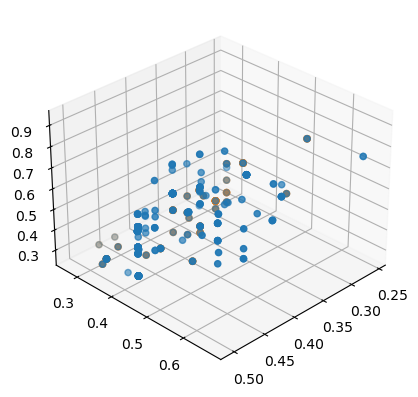

 14%|█▍        | 7/50 [15:32<1:35:04, 132.65s/it]

leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 5, 19]
0.1330064283
0.3041184072
0.46276676370000003
0.5320257132
0.5320257132
maxIjogbon 0.490670485
cont_distance 0.446947035
C2 0.5320257132
end_valmod 0.8
sum 0.1473139065238095
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 0]
0.

leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 14, 1, 2]
0.26205943749999994
0.345340061
0.4777798238
0.511901308
0.511901308
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.511901308


maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 3, 19, 18]
0.1325635988
0.35451660459999995
0.4496503354999999
0.5302543951999998
0.5302543951999998
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.5302543951999998
end_valmod 0.9090909090909091
sum 0.14070664019047618
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x0000

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 1, 20, 19]
0.1398187123
0.34832485259999996
0.4728526261999999
0.5592748491999999
0.5592748491999999
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.5592748491999999
end_valmod 0.9166666666666666
sum 0.181217087
leader <__main__.Particle objec

maxIjogbon 0.423034124
cont_distance 0.446947035
C2 0.5289067704
end_valmod 0.8333333333333334
sum 0.15871207504761903
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 6, 8, 19]
0.2739483294
0.36911784480000004
0.4910390545
0.5594568756
0.5594568756
maxIjogbon 0.420679736
cont_distance 0.446947035
C2 0.5594568756
end_valmod 0.8181818181818182
sum 0.15873931514285713
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 3]
0.08608102329999999
0.2

maxIjogbon 0.403059166
cont_distance 0.642858658
C2 0.6188945847999999
end_valmod 0.6666666666666666
sum 0.125550848
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 14, 1, 19]
0.2887182481
0.3986576822
0.5577562556
0.6185365504
0.6185365504
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6185365504
end_valmod 0.7777777777777778
sum 0.11153371252380953
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 19, 8, 0]
0.28154034910000003
0.4529893122
0.5631346528
0.5898249543999999
0.5898249543999999
maxIjogbon 0.420310776
cont_distance 0.446947035
C2 0.5898249543999999
end_valmod 0.8888888888888888
sum 0.17939041638095238
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 14, 8, 1]
0.

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 19, 0, 18]
0.2937265877
0.4773617893999999
0.5996933685999999
0.6385699087999999
0.6385699087999999
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.6385699087999999
end_valmod 0.9166666666666666
sum 0.14988139285714283
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 12, 1]
0.1549951711
0.3993797492
0.5514077363000001
0.6199806844
0.6199806844
maxIjogbon 0.503587055
cont_distance 0.495201728
C2 0.6199806844
end_valmod 0.9285714285714286
sum 0.17977835757142857
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>


maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.7917507831999998
end_valmod 0.9166666666666666
sum 0.1634364073333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 14, 2, 20]
0.127975327
0.29405620460000004
0.45213789560000006
0.511901308
0.511901308
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.511901308
end_valmod 0.8888888888888888
sum 0.1178515030952381
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 8, 20, 19]
0.13216529989999998
0.3024361504
0.4422389766
0.5286611996
0.5286611996
maxIjogbon 0.421022636
cont_distance 0.446947035
C2 0.5286611996
end_valmod 0.75
sum 0.16852951376190475
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19

leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 14, 18, 17]
0.3468372316
0.5983506882
0.7738407256000001
0.8510124844
0.8510124844
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.8510124844
end_valmod 0.8
sum 0.1503795823809524
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 10, 0, 1, 19]
0.3003063911
0.5433285328
0.6041088276
0.6648891224
0.6648891224
maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.6648891224
end_valmod 0.7777777777777778
sum 0.1215597118095238
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 8, 18]
0.2860731753
0.47682257559999996
0.5423894173999999
0.6079562592
0.6079562592
maxIjogbon 0.403059166
cont_distance 0.446947035
C2 0.6079562592
end_valmod 0.7777777777777778
sum 0.11796575814285715
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 2]
0.1205437072
0.330476

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 14, 0, 1]
0.2813344426
0.45257749919999996
0.5699485530999999
0.5890013284
0.5890013284
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.5890013284
end_valmod 0.7777777777777778
sum 0.11153371252380953
leader <__main__.Particle object at 0x00000184F020FC40>
[2, 20, 12, 10, 0]
0.215236994

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 14, 8, 1]
0.2736810302
0.36858324639999995
0.5126446018999999
0.5583876788
0.5583876788
maxIjogbon 0.403059166
cont_distance 0.491591393
C2 0.5583876788
end_valmod 0.75
sum 0.11013779990476191
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 2]


maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 18]
0.1176927279
0.2734910064
0.41682566249999997
0.4707709116
0.4707709116
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.4707709116
end_valmod 0.8888888888888888
sum 0.13143750461904763
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20

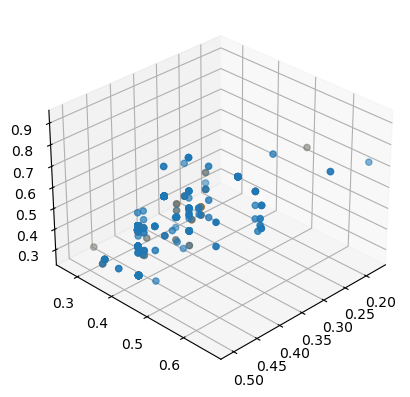

 16%|█▌        | 8/50 [17:44<1:32:49, 132.60s/it]

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 4, 2]


maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 1]
0.1443515385
0.378092

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 19, 2, 20]
0.1205437072
0.279192965
0.4224114164
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 1]
0.278435649
0.461

[0, 20, 16, 1, 19]
0.1697608641
0.4289111352
0.6182631616
0.6790434564
0.6790434564
maxIjogbon 0.492027414
cont_distance 0.642858658
C2 0.6790434564
end_valmod 0.8
sum 0.13068413776190477
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle 

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 8, 18]
0.1519890648
0.3933675366
0.5423894174
0.6079562592000001
0.6079562592000001
maxIjogbon 0.403059166
cont_distance 0.446947035
C2 0.6079562592000001
end_valmod 0.7777777777777778
sum 0.11796575814285715
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 18, 19, 1]
0.1443515385
0.37809248400000006
0.5166258592
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 1, 8, 20]
0.1247814944
0.31825041679999994
0.4277409725
0.4991259776
0.4991259776
maxIjogbon 0.420310776
cont_distance 0.446947035
C2 0.4991259776
end_valmod 0.6666666666666666
sum 0.16727128495238094
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035


leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 1, 20, 2]
0.11315990169999998
0.2950072314
0.3928761944
0.45263960680000004
0.45263960680000004
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.45263960680000004
end_valmod 0.9090909090909091
sum 0.18006939376190476
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 5, 19, 18]
0.2869143037
0.39504979339999996
0.5307167131
0.6113207728
0.6113207728
maxIjogbon 0.490670485
cont_distance 0.446947035
C2 0.6113207728
end_valmod 0.75
sum 0.130727713
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 18, 14, 20, 19]
0.17445790249999998
0.4266688854
0.6114093869999999
0.6978316099999999
0.6978316099999999
maxIjogbon 0.428657641
cont_distance 0.49159

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 14, 18, 0]
0.308542013
0.5217602510000001
0.6589550698000001
0.69783161
0.69783161
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.69783161
end_valmod 0.7142857142857143
sum 0.12542656885714287
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 14, 0, 1]
0.2887182481
0.4821127211999999
0.5994837751
0.6185365503999999
0.6185365503999999
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6185365503999999
end_valmod 0.7777777777777778
sum 0.11153371252380953
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 11, 2]
0.14578393760000002
0.3809572822000001
0.5010992916000001
0.5831357504000001
0.5831357504000001
maxIjogbon 0.467361064
cont_distance 0.669677499
C2 0.5831357504000001
end_valmod 0.9090909090909091
sum 0.1592431088095238
leader <__main__.Particle object

maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 12, 20, 19, 1]
0.1549951711
0.409

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 9, 20, 19, 1]
0.1562976381
0.4142405558
0.5644102576
0.6251905524
0.6251905524
maxIjogbon 0.421022636
cont_distance 0.508226398
C2 0.6251905524
end_valmod 0.8181818181818182
sum 0.1513809151904762
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 8, 2]
0.10550648929999999
0.2491185292
0.38026694670000005
0.4220259572000001
0.4220259572000001
maxIjogbon 0.467361064
cont_distance 0.446947035
C2 0.4220259572000001
end_valmod 0.875
sum 0.17705389614285713
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_dista

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 14, 19, 18]
0.342885727
0.5756800679999999
0.7546024063
0.835206466
0.835206466
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.835206466
end_valmod 0.8571428571428571
sum 0.15416325542857143
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 16, 2, 20]
0.1431020535
0.3243096576
0.5126448016
0.572408214
0.572408214
maxIjogbon 0.492027414
cont_distance 0.642858658
C2 0.572408214
end_valmod 0.8888888888888888
sum 0.13700192833333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 1]
0.278435649
0.3780

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 14, 8, 19]
0.16227166389999997
0.41393273480000004
0.5806688345
0.6490866555999999
0.6490866555999999
maxIjogbon 0.403059166
cont_distance 0.491591393
C2 0.6490866555999999
end_valmod 0.75
sum 0.11039534457142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 20, 8, 19]
0.14745623859999998
0.36359990519999996
0.5214071333
0.5898249543999999
0.5898249543999999
maxIjogbon 0.420310776
cont_distance 0.446947035
C2 0.5898249543999999
end_valmod 0.8888888888888888
sum 0.17939041638095238
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073

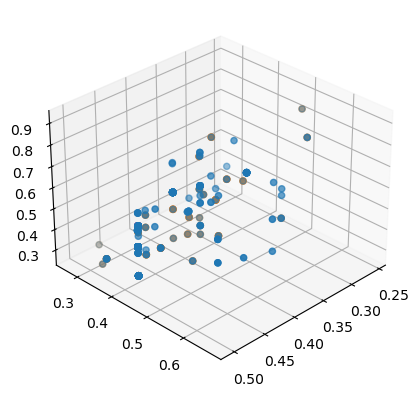

 18%|█▊        | 9/50 [19:58<1:30:43, 132.76s/it]

leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.5774

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[15, 0, 20, 14, 19]
0.3586287767
0.49421013900000005
0.6744862048000001
0.7653728636
0.7653728636
maxIjogbon 0.428657641
cont_distance 0.557618536
C2 0.7653728636
end_valmod 0.7777777777777778
sum 0.13726344095238094
leader <__main__.Particle object at 0x00000184F020FC40>
[0,

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 19, 0, 1]
0.2739028228
0.4377142596
0.5402220739
0.5592748491999999
0.5592748491999999
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.5592748491999999
end_valmod 0.9166666666666666
sum 0.181217087
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 14, 2, 20]
0.127975327
0.

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 17]
0.297678092

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 11, 19, 1]
0.1724427482
0.4342749034000001
0.6289906980000001
0.6897709928
0.6897709928
maxIjogbon 0.421022636
cont_distance 0.669677499
C2 0.6897709928
end_valmod 0.8181818181818182
sum 0.15071872642857143
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>

maxIjogbon 0.421022636
cont_distance 0.446947035
C2 0.5286611996
end_valmod 0.75
sum 0.16852951376190475
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 8, 18]
0.2860731753
0.4768225755999999

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.7917507831999998
end_valmod 0.9166666666666666
sum 0.1634364073333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 8, 2]
0.2395905998
0.3004023856
0.3802669467
0.42202595719999997
0.42202595719999997
maxIjogbon 0.467361064
cont_distance 0.446947035
C2 0.42202595719999997
end_valmod 0.875
sum 0.17705389614285713
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 3, 1, 19]
0.2468239444
0.3148690748
0.3901790408
0.4509593356
0.4509593356
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4509593356
end_valmod 0.9230769230769231
sum 0.1819489277142857
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 19, 8, 0]
0.28154034910000003
0.4529893122
0.5631346528
0.5898249543999999
0.5898249543999999
maxIjogbon 0.420310776
cont_distance 0.446947035
C2 0.5898249543999999
end_valmod 0.8888888888888888
sum 0.17939041638095238
leader <__main__.Particle object at 0x00000184F020FC40>
[18, 0, 20, 1,

maxIjogbon 0.365543138
cont_distance 0.607472823
C2 0.6954392276
end_valmod 0.7142857142857143
sum 0.12701034190476188
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 19, 0, 18]
0.2937265877
0.4773617893999999
0.5996933685999999
0.6385699087999999
0.6385699087999999
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.6385699087999999
end_valmod 0.9166666666666666
sum 0.14988139285714283
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 3]
0.086081

maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.5119013079999999
end_valmod 0.8888888888888888
sum 0.1178515030952381
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 19, 0, 1]
0.2739028228
0.4377142596
0.5402220739
0.5592748491999999
0.5592748491999999
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.5592748491999999
end_valmod 0.9166666666666666
sum 0.181217087
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 14, 2, 20]
0.127975327
0.29405620460000004
0.45213789560000006
0.511901308
0.511901308
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.511901308
end_valmod 0.8888888888888888
sum 0.1178515030952381
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 19]
0.12054370

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 8, 20]
0.10550648929999999
0.2491185292
0.3506409521
0.42202595719999997
0.42202595719999997
maxIjogbon 0.467361064
cont_distance 0.446947035
C2 0.42202595719999997
end_valmod 0.875
sum 0.17705389614285713
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 14, 18, 17]
0.3468372316
0.5983506882
0.7738407256000001
0.8510124844
0.8510124844
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.8510124844
end_valmod 0.8
sum 0.1503795823809524
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 19]
0.1205437072
0.33047

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.45263960680000004
end_valmod 0.9090909090909091
sum 0.18006939376190476
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 8, 18]
0.2860731753
0.476

maxIjogbon 0.357032701
cont_distance 0.446947035
C2 0.48410273119999997
end_valmod 0.9
sum 0.12292362714285716
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 1]
0.278435649
0.46154752

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 14, 1, 20, 19]
0.1546341376
0.40758655380000003
0.5321143274000001
0.6185365504000001
0.6185365504000001
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6185365504000001
end_valmod 0.7777777777777778
sum 0.11153371252380953
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 14, 8, 1]
0.2736810302
0.36858324639999995
0.5126446018999999
0.5583876788
0.5583876788
maxIjogbon 0.403059166
c

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.6385699087999999
end_valmod 0.9166666666666666
sum 0.14988139285714283
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 13, 1, 2]
0.2472440122
0.3157092104
0.41851812259999993
0.4526396067999999
0.4526396067999999
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4526396067999999
end_valmod 0.9090909090909091
sum 0.18006939376190476
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 13]
0.11315990170000001
0.264425354
0.4032271839
0.4526396067999999
0.4526396067999999
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4526396067999999
end_valmod 0.9090909090909091
sum 0.18006939376190476
leader <__main__.Particle object at 0x00000184F020FC40

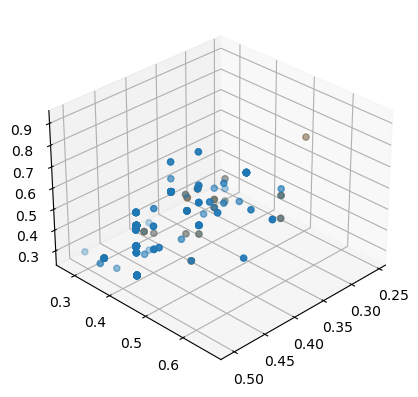

 20%|██        | 10/50 [22:10<1:28:27, 132.69s/it]

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 2

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 8, 1, 20, 19]
0.13216529989999998
0.317711203
0.4422389766
0.5286611996
0.5286611996
maxIjogbon 0.421022636
cont_distance 0.446947035
C2 0.5286611996
end_valmod 0.75
sum 0.16852951376190475
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 14, 18, 0]
0.308542013
0.5217602510000001
0.6589550698000001
0.69783161
0.69783161
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.69783161
end_valmod 0.

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.4469

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 19, 0, 18]


maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 8, 2]

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4526396067999999
end_valmod 0.9090909090909091
sum 0.18006939376190476
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 8, 18]
0.1519890648
0.3933675366
0.5423894174
0.6079562592000001
0.6079562592000001
maxIjogbon 0.403059166
cont_distance 0.446947035
C2 0.6079562592000001
end_valmod 0.7777777777777778
sum 0.11796575814285715
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 1, 8, 20]
0.1247814944
0.31825041679999994
0.4277409725
0.4991259776
0.4991259776
maxIjogbon 0.420310776
cont_distance 0.446947035
C2 0.4991259776
end_valmod 0.6666666666666666
sum 0.16727128495238094
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 

maxIjogbon 0.467361064
cont_distance 0.669677499
C2 0.6296221212
end_valmod 0.7777777777777778
sum 0.15734139514285714
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 1, 2, 3]
0.07573003379999999
0.22014749559999996
0.2805865906999999
0.30292013519999994
0.30292013519999994
maxIjogbon 0.503587055
cont_distance 0.34343714
C2 0.30292013519999994
end_valmod 0.9090909090909091
sum 0.19291715323809525
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F020FC4

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 1, 20, 19]
0.1398187123
0.34832485259999996
0.4728526261999999
0.5592748491999999
0.5592748491999999
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.5592748491999999
end_valmod 0.9166666666666666
sum 0.181217087
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 14, 18, 0]
0.308542013
0.5217602510000001
0.6589550698000001
0.69783161
0.69783161
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.69783161
end_valmod 0.7142857142857143
sum 0.12542656885714287
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1

maxIjogbon 0.490670485
cont_distance 0.446947035
C2 0.5320257131999999
end_valmod 0.8
sum 0.1473139065238095
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 14, 20, 2]
0.127975327
0.2940562046
0.45213789559999995
0.5119013079999999
0.5119013079999999
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.5119013079999999
end_valmod 0.8888888888888888
sum 0.1178515030952381
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 9, 19, 18, 0]
0.3102055135
0.5432774925999999
0.6656090718
0.7044856119999999
0.7044856119999999
maxIjogbon 0.256454083
cont_distance 0.508226398
C2 0.7044856119999999
end_valmod 0.8
sum 0.11679683557142857
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 3]
0.086081

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 8, 1]
0.2662494104
0.3537200068
0.48291812269999995
0.5286611995999999
0.5286611995999999
maxIjogbon 0.421022636
cont_distance 0.446947035
C2 0.5286611995999999
end_valmod 0.75
sum 0.16852951376190475
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 14, 

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.5592748491999999
end_valmod 0.9166666666666666
sum 0.181217087
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 14, 8, 19]
0.16227166389999997
0.41393273480000004
0.5806688345
0.6490866555999999
0.6490866555999999
maxIjogbon 0.403059166
cont_distance 0.491591393
C2 0.6490866555999999
end_valmod 0.75
sum 0.11039534457142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 16]
0

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 13]
0.2937265877
0.49212940039999997
0.5653496546
0.6385699087999999
0.6385699087999999
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.6385699087999999
end_valmod 0.9166666666666666
sum 0.14988139285714283
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 4

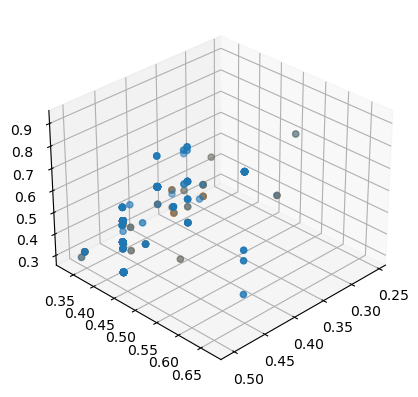

 22%|██▏       | 11/50 [24:22<1:26:04, 132.42s/it]

leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
en

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 19, 0, 1]
0.2739028228
0.4377142596
0.5402220739
0.5592748491999999
0.5592748491999999
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.5592748491999999
end_valmod 0.9166666666666666
sum 0.181217087
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 1

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 1, 18]
0.278435649
0.3

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 13, 19, 1]
0.1398187123
0.36902683160000005
0.4984945544
0.5592748492
0.5592748492
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.5592748492
end_valmod 0.9166666666666666
sum 0.181217087
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 2]
0.1205437072
0.2791929

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 18]


maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 20, 19, 18]
0.1596424772
0.3879723824
0.5579658491
0.6385699088
0.6385699088
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.6385699088
end_valmod 0.9166666666666666
sum 0.14988139285714283
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 8, 2]
0.2395905998
0.3004023856
0.3802669467
0.42202595719999997
0.42202595719999997
maxIjogbon 0.467361064
cont_distance 0.446947035
C2 0.42202595719999997
end_valmod 0.875
sum 0.17705389614285713
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 20, 8, 1]
0.1247814944
0.318

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 14, 19, 8, 18]
0.33523231459999997
0.5900040938
0.7390259746
0.8045928163999999
0.8045928163999999
maxIjogbon 0.403059166
cont_distance 0.491591393
C2 0.8045928163999999
end_valmod 0.75
sum 0.1175586532857143
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 19, 18, 17]
0.33202180629999994
0.5539522265999999
0.7145790243999999
0.7917507831999998
0.7917507831999998
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.7917507831999998
end_valmod 0.9166666666666666
sum 0.1634364073333333
leader <__main__.Particle object at 

maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 14, 20, 2]
0.127975327
0.2940562046
0.45213789559999995
0.5119013079999999
0.5119013079999999
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.5119013079999999
end_valmod 0.8888888888888888
sum 0.1178515030952381
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 19, 0, 18]
0.2937265877
0.4773617893999999
0.5996933685999999
0.6385699087999999
0.6385699087999999
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.6385699087999999
end_valmod 0.9166666666666666
sum 0.14988139285714283
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 

maxIjogbon 0.490670485
cont_distance 0.446947035
C2 0.6113207727999999
end_valmod 0.75
sum 0.130727713
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 4, 18]
0.2925718978
0.4898200206
0.5618855849
0.6339511492
0.6339511492
maxIjogbon 0.490886818
cont_distance 0.446947035
C2 0.6339511492
end_valmod 0.75
sum 0.13947119133333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 14, 0, 18]
0.308542013
0.521760251
0.6589550698
0.6978316099999999
0.6978316099999999
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6978316099999999
end_valmod 0.7142857142857143
sum 0.12542656885714287
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.4253

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 14]
0.127975327
0.29405620460000004
0.4180474652
0.511901308
0.511901308
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.511901308
end_valmod 0.8888888888888888
sum 0.1178515030952381
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.261

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end

maxIjogbon 0.490670485
cont_distance 0.446947035
C2 0.5885707084
end_valmod 0.75
sum 0.13901781476190475
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 12, 1, 20, 19]
0.1549951711
0.40903068779999996
0.5335584614
0.6199806844
0.6199806844
maxIjogbon 0.503587055
cont_distance 0.495201728
C2 0.6199806844
end_valmod 0.9285714285714286
sum 0.17977835757142857
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 3]


maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.547870932
end_valmod 0.7777777777777778
sum 0.12511971404761907
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 0, 1, 19]
0.2739028228
0.4377142596
0.49849455439999996
0.5592748491999999
0.5592748491999999
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.5592748491999999
end_valmod 0.9166666666666666
sum 0.181217087
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 8, 1, 2]
0.2395905998
0.3004023856
0.38790447299999997
0.42202595719999997
0.42202595719999997
maxIjogbon 0.467361064
cont_distance 0.446947035
C2 0.42202595719999997
end_valmod 0.875
sum 0.17705389614285713
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2,

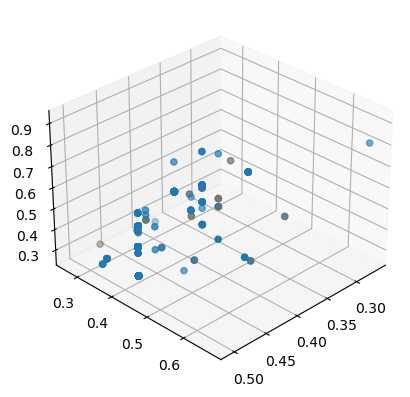

 24%|██▍       | 12/50 [26:34<1:23:52, 132.45s/it]

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035


maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 3]


maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 15, 1, 19]
0.29532096240000005
0.41186311080000004
0.5841671128000001
0.6449474076
0.6449474076
maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.6449474076
end_valmod 0.75
sum 0.11576405252380953
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 18]
0.2

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 1, 18]
0.278

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 1, 2, 3]
0.07573003379999999
0.22014749559999996
0.2805865906999999
0.30292013519999994
0.30292013519999994
maxIjogbon 0.503587055
cont_distance 0.34343714
C2 0.30292013519999994
end_valmod 0.9090909090909091
sum 0.19291715323809525
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 8, 19]
0.13216529989999998
0.3537200068
0.46024337849999997
0.5286611995999999
0.5286611995999999
maxIjogbon 0.421022636
cont_distance 0.446947035
C2 0.5286611995999999
end_valmod 0.75
sum 0.16852951376190475
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 0, 8, 19]
0.2815403491
0.4529893121999999
0.5214071332999999
0.5898249543999998
0.58982495439

maxIjogbon 0.467361064
cont_distance 0.508226398
C2 0.4465377024
end_valmod 0.75
sum 0.19412512952380953
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 1, 2, 3]
0.07573003379999999
0.22014749559999996
0.2805865906999999
0.30292013519999994
0.30292013519999994
maxIjogbon 0.503587055
cont_distance 0.34343714
C2 0.30292013519999994
end_valmod 0.9090909090909091
sum 0.19291715323809525
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 1

maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6978316099999999
end_valmod 0.7142857142857143
sum 0.12542656885714287
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 1, 20, 2]
0.11315990169999998
0.2950072314
0.3928761944
0.45263960680000004
0.45263960680000004
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.45263960680000004
end_valmod 0.9090909090909091
sum 0.18006939376190476
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 14, 18, 0]
0.308542013
0.5217602510000001
0.6589550698000001
0.69783161
0.69783161
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.69783161
end_valmod 0.7142857142857143
sum 0.12542656885714287
leader <__main__.Particle object

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC40>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 19]
0.1205437072
0.279

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 4, 2]
0.1120052118
0.2621159742
0.39976311420000005
0.4480208472
0.4480208472
maxIjogbon 0.490886818
cont_distance 0.446947035
C2 0.4480208472
end_valmod 0.9
sum 0.13719027442857146
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 14, 20, 2]
0.127975327
0.2940562046
0.45213789559999995
0.5119013079999999
0.5119013079999999
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.5119013079999999
end_valmod 0.8888888888888888
sum 0.1178515030952381
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 14, 19, 18, 0]
0.308542013
0.5

[20, 19, 18, 0, 13]
0.2937265877
0.49212940039999997
0.6042261948000001
0.6385699088
0.6385699088
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.6385699088
end_valmod 0.9166666666666666
sum 0.14988139285714283
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.1

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20,

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 18, 19, 17, 0]
0.2976780923
0.494330451
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 14, 8, 19]
0.16227166389999997


maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.5592748492
end_valmod 0.9166666666666666
sum 0.181217087
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1

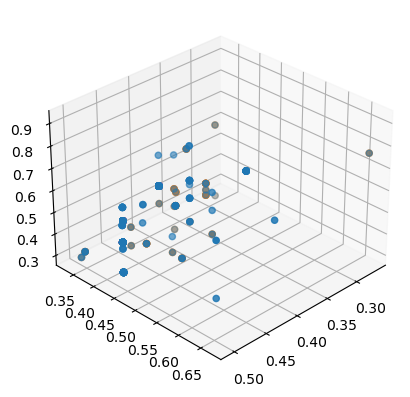

 26%|██▌       | 13/50 [28:49<1:22:07, 133.18s/it]

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
con

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_dist

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.4466063

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 14, 19, 1]
0.1546341376
0.39865768220000003
0.5577562556
0.6185365504
0.6185365504
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6185365504
end_valmod 0.7777777777777778
sum 0.11153371252380953
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.7917507831999998
end_valmod 0.9166666666666666
sum 0.1634364073333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 8, 1]
0.2662494104
0.3537200068
0.48291812269999995
0.5286611995999999
0.5286611995999999
maxIjogbon 0.421022636
cont_distance 0.446947035
C2 0.5286611995999999
end_valmod 0.75
sum 0.16852951376190475
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 20, 8, 1]
0.1247814944
0.31825041679999994
0.4533829007
0.4991259776
0.4991259776
maxIjogbon 0.420310776
cont_distance 0.446947035
C2 0.4991259776
end_valmod 0.6666666666666666
sum 0.16727128495238094
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 1, 18]
0.

maxIjogbon 0.403059166
cont_distance 0.446947035
C2 0.7611371336
end_valmod 0.75
sum 0.13232814704761903
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 19, 18, 17]
0.33202180629999994
0.5539522265999999
0.7145790243999999
0.7917507831999998
0.7917507831999998
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.7917507831999998
end_valmod 0.9166666666666666
sum 0.1634364073333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2

leader <__main__.Particle object at 0x00000184F020FC40>
[20, 13, 19, 0, 18]
0.2937265877
0.4773617893999999
0.5996933685999999
0.6385699087999999
0.6385699087999999
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.6385699087999999
end_valmod 0.9166666666666666
sum 0.14988139285714283
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 14, 2, 20]
0.127975327
0.29405620460000004
0.45213789560000006
0.511901308
0.511901308
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.511901308
end_valmod 0.8888888888888888
sum 0.1178515030952381
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont

maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BC40>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 3]
0.086081023

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 14, 1, 19]
0.2887182481
0.3986576822
0.5577562556
0.6185365504
0.6185365504
maxIjogbon 0.428657641
cont_distance 0.491591393
C2 0.6185365504
end_valmod 0.7777777777777778
sum 0.11153371252380953
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 17]
0.297

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 1, 8, 19]
0.13216529989999998
0.3537200068
0.46024337849999997
0.5286611995999999
0.5286611995999999
maxIjogbon 0.421022636
cont_distance 0.446947035
C2 0.5286611995999999
end_valmod 0.75
sum 0.16852951376190475
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 1]
0.278

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x0000

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BC40>
[20, 0, 14, 8, 1]
0.2736810302
0.36858324639999995
0.5126446018999999
0.5583876788
0.5583876788
maxIjogbon 0.403059166
cont_distance 0.491591393
C2 0.5583876788
end_valmod 0.75
sum 0.11013779990476191
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 19]
0.2546278177
0.3

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 17]
0.11711140630000001
0.27232836320000003
0.4150816977
0.46844562520000005
0.46844562520000005
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.46844562520000005
end_valmod 0.8888888888888888
sum 0.12440371785714287
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x0

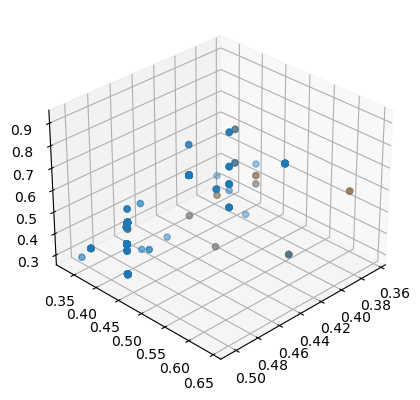

 28%|██▊       | 14/50 [31:01<1:19:41, 132.81s/it]

leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 1,

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x0000

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 20, 2, 3]
0.0860810233
0.2102

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 13, 1, 2, 3]
0.07573003379999999
0.22014749559999996
0.2805865906999999
0.30292013519999994
0.30292013519999994
maxIjogbon 0.503587055
cont_distance 0.34343714
C2 0.30292013519999994
end_valmod 0.9090909090909091
sum 0.19291715323809525
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 1, 8, 2]
0.10550648929999999
0.3004023856
0.3802669467
0.42202595719999997
0.42202595719999997
maxIjogbon 0.467361064
cont_distance 0.446947035
C2 0.42202595719999997
end_valmod 0.875
sum 0.17705389614285713
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 9, 1, 8, 2]
0.1116344256
0.3249141308
0.4047786919
0.4465377024
0.4465377024
maxIjogbon 0.467361064
cont_distance 0.508226398
C2 0.4465377024
end_valmod 0.75
sum 0.19412512952380953
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 13, 1, 2, 20]
0.11315990169999998
0.29500723139999996
0.3928761944
0.4526396067999999
0.4526396067999999
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4526396067999999
end_valmod 0.9090909090909091
sum 0.18006939376190476
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443

leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 13, 1, 20, 2]
0.11315990169999998
0.2950072314
0.3928761944
0.45263960680000004
0.45263960680000004
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.45263960680000004
end_valmod 0.9090909090909091
sum 0.18006939376190476
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446

leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 15, 2]
0.1345780413
0.3072616332
0.46748160269999994
0.5383121652
0.5383121652
maxIjogbon 0.438764182
cont_distance 0.557618536
C2 0.5383121652
end_valmod 0.875
sum 0.1220818430952381
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0162D00>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.

maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x0

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 2, 8, 20]
0.1055064892999

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.5592748492
end_valmod 0.9166666666666666
sum 0.181217087
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 2, 3, 4]
0.0745753

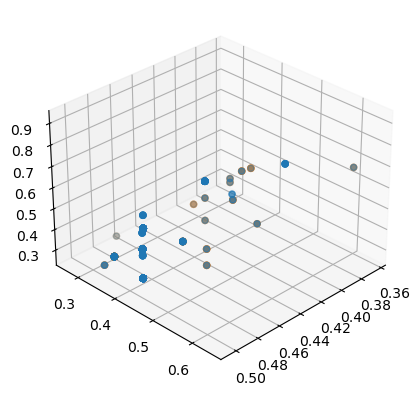

 30%|███       | 15/50 [33:19<1:18:24, 134.41s/it]

leader <__main__.Particle object at 0x00000184F017BC10>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.482174

leader <__main__.Particle object at 0x00000184F017BC10>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.44

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 1, 

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.6385699088
end_valmod 0.9166666666666666
sum 0.14988139285714283
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 19, 8, 18]
0.2860731753
0.3933675366
0.5423894174
0.6079562592000001
0.6079562592000001
maxIjogbon 0.403059166
cont_distance 0.446947035
C2 0.6079562592000001
end_valmod 0.7777777777777778
sum 0.11796575814285715
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 13, 19, 8, 0]
0.28154034910000003
0.4529893122
0.5631346528
0.5898249543999999
0.5898249543999999
maxIjogbon 0.420310776
cont_distance 0.446947035
C2 0.5898249543999999
end_valmod 0.8888888888888888
sum 0.17939041638095238
leader <__main__.Particle object at 0x00000184F020FC40>

maxIjogbon 0.403059166
cont_distance 0.446947035
C2 0.7611371336
end_valmod 0.75
sum 0.13232814704761903
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 13, 19, 0, 1]
0.2739028228
0.4377142596
0.5402220739
0.5592748491999999
0.5592748491999999
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.5592748491999999
end_valmod 0.9166666666666666
sum 0.181217087
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.519

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 13, 19, 0, 18]
0.2937265877
0.4773617893999999
0.5996933685999999
0.6385699087999999
0.6385699087999999
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.6385699087999999
end_valmod 0.9166666666666666
sum 0.14988139285714283
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 2]


maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object a

maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 2, 8, 20]
0.10550648929999999
0.2491185292
0.350

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 1, 2, 3]
0.2201651

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BC10>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 19, 18, 8, 0]
0.286073175

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.5592748491999999
end_valmod 0.9166666666666666
sum 0.181217087
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BC10>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 16]
0.361963958

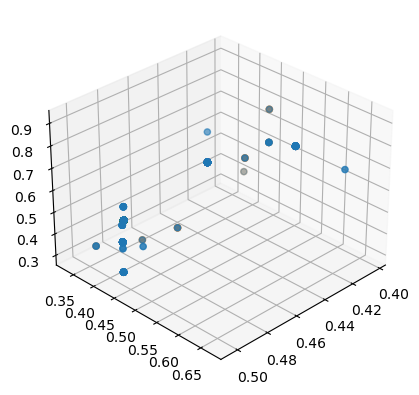

 32%|███▏      | 16/50 [35:45<1:18:04, 137.79s/it]

leader <__main__.Particle object at 0x00000184F020FA90>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FA90>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.50358705

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.0860810232999

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 2]
0.

maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
en

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 8, 2]
0.1055064

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 8, 2]
0.10550648929999999
0.3004023856
0.3802669467
0.42202595719999997
0.42202595719999997
maxIjogbon 0.467361064
cont_distance 0.446947035
C2 0.42202595719999997
end_valmod 0.875
sum 0.17705389614285713
leader <__main__.Particle object at 0x00000184F020FA90>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 20, 8, 19]
0.14745623859999998
0.36359990519999996
0.5214071333
0.5898249543999999
0.5898249543999999
maxIjogbon 0.420310776
cont_distance 0.446947035
C2 0.5898249543999999
end_valmod 0.8888888888888888
sum 0.17939041638095238
leader <__main__.Particle object at 0x00000184F020FA90>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_d

maxIjogbon 0.467361064
cont_distance 0.446947035
C2 0.42202595719999997
end_valmod 0.875
sum 0.17705389614285713
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 1, 20, 19]
0.1398187123
0.34832485259999996
0.4728526261999999
0.5592748491999999
0.5592748491999999
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.5592748491999999
end_valmod 0.9166666666666666
sum 0.181217087
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F020FC40>


maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 13, 1, 20, 2]
0.11315990169999998
0.2950072314
0.3928761944
0.45263960680000004
0.45263960680000004
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.45263960680000004
end_valmod 0.9090909090909091
sum 0.18006939376190476
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19,

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 8, 1]
0.13216529989999998
0.3537200068
0.48291812269999995
0.5286611995999999
0.5286611995999999
maxIjogbon 0.421022636
cont_distance 0.446947035
C2 0.5286611995999999
end_valmod 0.75
sum 0.16852951376190475
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0,

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017B910>
[0,

[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 20, 8, 19]
0.13216529989999998
0.3024361504
0.46024337849999997
0.5286611995999999
0.5286611995999999
maxIjogbon 0.421022636
cont_distance 0.446947035
C2 0.5286611995999999
end_valmod 0.75
sum 0.16852951376190475

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 20, 3]
0.08608102329999999


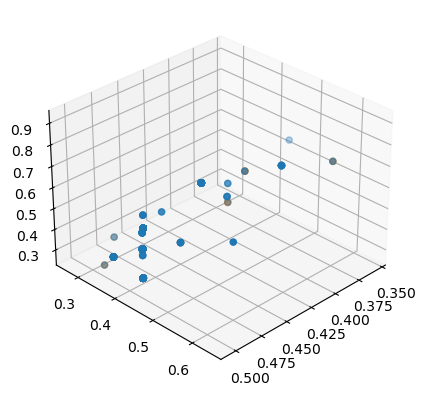

 34%|███▍      | 17/50 [37:59<1:15:12, 136.75s/it]

leader <__main__.Particle object at 0x00000184F015BC70>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.654375927

[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761

leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BC70>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.654375

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 1, 2]
0.2546278177
0.3

leader <__main__.Particle object at 0x00000184F020FA90>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B730>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BC70>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BC70>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.321

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 1, 19, 2]
0.254

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BC70>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 1, 2]
0.2546278177
0.33047

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BC70>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0,

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0,

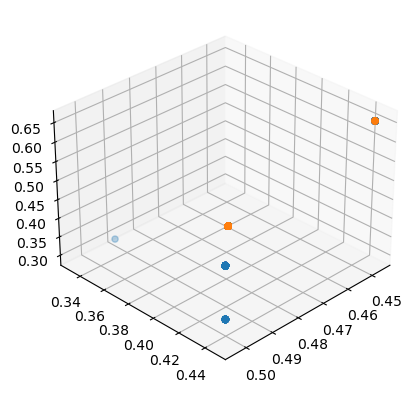

 36%|███▌      | 18/50 [40:15<1:12:45, 136.43s/it]

leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015AB80>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F07460D0>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154

leader <__main__.Particle object at 0x00000184F0194370>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B100>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BC70>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194370>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
en

maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F076E490>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015FC70>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F015BC70>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194D90>
[0, 20, 1, 2, 3]
0.0860

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194CA0>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015FC70>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F020FA90>
[0, 1, 2, 20, 3]
0.08

leader <__main__.Particle object at 0x00000184F0194CA0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BC70>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B100>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194CA0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015BC70>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BC70>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F07460D0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0760100>
[0, 20, 1, 2, 19]
0.1205437072
0.

leader <__main__.Particle object at 0x00000184F0760100>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0760100>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015AB80>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076E490>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015F070>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F07460D0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B100>
[20, 19, 0, 18, 1]
0.278435649
0.46154752

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BC70>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B100>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B100>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 19, 18]
0.1443515385


maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194D90>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BC70>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B100>
[0, 20, 19, 1, 18]
0.1443515385
0.3780

leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0760100>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FC40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FA90>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance

leader <__main__.Particle object at 0x00000184F017B100>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015AB80>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F015AB80>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FA90>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076E490>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F015FC70>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194CA0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076E490>
[0, 1, 2, 3, 4]
0.074575343

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015F070>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015BC70>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194D90>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0760100>
[0, 20, 1, 19, 2]
0.

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015BC70>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F07460D0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194CA0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015FC70>
[0, 1, 2, 3, 4

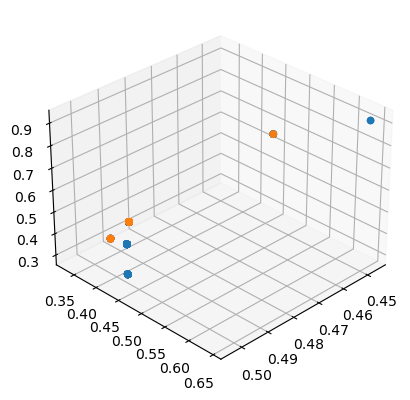

 38%|███▊      | 19/50 [42:28<1:09:53, 135.26s/it]

leader <__main__.Particle object at 0x00000184F017B130>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B130>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015AC10>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7

maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F015DA60>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015D580>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015AD90>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 19, 0, 18, 17]
0.29767

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015DB80>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F015DB80>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F015AC10>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F

leader <__main__.Particle object at 0x00000184F015DB80>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F015AD90>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015AD90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B9D0>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015D580>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B130>
[20, 19, 0, 1, 2]
0.2546278177
0.4139

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015AC10>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015AC10>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017B130>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015DB80>
[20, 19, 18, 17, 16]
0

leader <__main__.Particle object at 0x00000184F015B9D0>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B130>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F017B130>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F015AD90>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.4

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015DB80>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F015B9D0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015AD90>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B130>
[20, 19, 0, 18, 1]
0.278435649
0.46154752

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015AD90>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015DA60>
[20, 19, 18, 0, 17]
0.29

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015DB80>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F017B130>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B9D0>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015AD90>
[20, 19, 18, 0, 1]
0.2784356

maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F015D580>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015AC10>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B130>
[0, 20, 1, 19, 18]
0

[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015AD90>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F015AD90>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015DA60>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.57

leader <__main__.Particle object at 0x00000184F020FA90>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F015DB80>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F015B9D0>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FA90>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015AD90>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F020FA90>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015D580>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x0000

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B9D0>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015DA60>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FA90>
[0, 20, 1, 2, 19]
0.1205437072
0

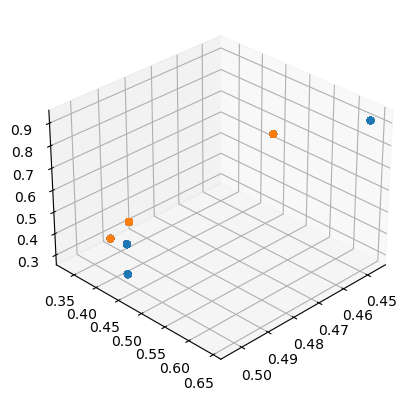

 40%|████      | 20/50 [44:41<1:07:21, 134.72s/it]

leader <__main__.Particle object at 0x00000184F015BE80>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0162430>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015B250>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015B4C0>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015D880>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015DA30>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0154BB0>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194670>
[0, 20, 1, 19, 18

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BE80>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184EFE26EE0>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015B250>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01946

leader <__main__.Particle object at 0x00000184F015BB50>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015DA30>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015B4C0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194D90>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184EFE26EE0>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162430>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0765460>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015DE80>
[20, 19, 0, 18, 1]
0.2784

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B460>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194670>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015B460>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015D100>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162760>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184EFE26EE0>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BE80>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015D880>
[20, 19, 0, 18, 17]
0.2976780

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015D5B0>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194D90>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015D100>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B4C0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0154BB0>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184EFE26EE0>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194670>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F015D580>
[20, 0, 

leader <__main__.Particle object at 0x00000184EFE26EE0>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F01D6550>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01D6550>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D90>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015DE80>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015D5B0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01D6550>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015D580>
[20, 19,

leader <__main__.Particle object at 0x00000184F015B4C0>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B4C0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015B4C0>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288


leader <__main__.Particle object at 0x00000184F015BB50>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0154BB0>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0765460>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F015DE80>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distanc

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015D580>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015D880>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015DA30>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015D580>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015B4C0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015D5B0>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BB50>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015D580>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536


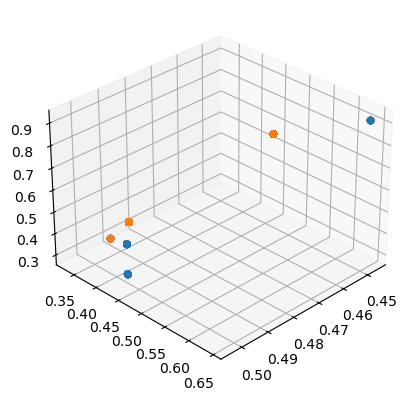

 42%|████▏     | 21/50 [46:54<1:04:50, 134.17s/it]

leader <__main__.Particle object at 0x00000184F0162580>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194580>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194580>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.44660

leader <__main__.Particle object at 0x00000184F0162580>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BB50>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015D850>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01D60D0>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947

leader <__main__.Particle object at 0x00000184F0765B50>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01546D0>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194670>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F01D60D0>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162580>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F015B4C0>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BAF0>
[20, 19, 0, 1, 2]
0.254627817

maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F015B4C0>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B4C0>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01D60D0>
[0, 1, 2, 20, 3]
0.08608102329999999
0

leader <__main__.Particle object at 0x00000184F01D66A0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015B0A0>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D66A0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035

maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F015B4C0>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BB50>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015D850>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F015D850>
[0, 1, 20, 2

leader <__main__.Particle object at 0x00000184F01D66A0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015BB50>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194580>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BAF0>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6

leader <__main__.Particle object at 0x00000184F0194580>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194670>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F015D850>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F0162580>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194580>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01546D0>
[0, 1, 2, 3, 4]
0.074575

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015D850>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015BB50>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D60D0>
[0, 20, 

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015BAF0>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01D66A0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194670>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B4C0>
[0, 1, 20, 2, 3]
0

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194580>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194670>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015B0A0>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 19, 0, 1, 

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194670>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F015D850>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F01546D0>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BAF0>
[20, 19, 0, 1

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B4C0>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162580>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0162580>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194670>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720

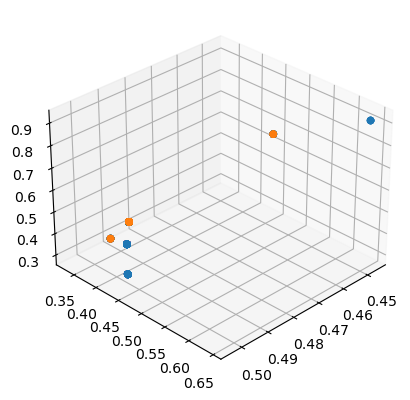

 44%|████▍     | 22/50 [49:07<1:02:26, 133.80s/it]

leader <__main__.Particle object at 0x00000184F01544F0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D90>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
su

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B4C0>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194370>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F400>
[0, 1, 2, 3, 4]
0.07

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194670>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194670>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F01D61C0>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076E0D0>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194670>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015B4C0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015B4C0>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>


leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194D90>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015AC40>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015B4C0>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015AC40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0154850>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015B4C0>
[20, 1

leader <__main__.Particle object at 0x00000184F0194370>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015AC40>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194370>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015FFA0>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076E0D0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015AC40>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194370>
[20, 19, 0, 18, 1]
0.278435649
0.4615

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015AC40>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015AC40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194670>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B4C0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0

maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F01544F0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194370>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 19, 0, 1, 18]
0

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194D90>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F076E0D0>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076E0D0>
[20, 19, 0

leader <__main__.Particle object at 0x00000184F016F400>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0154850>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194370>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F016F400>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194670>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194670>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 18, 1]
0.278435649
0.461547522

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076E0D0>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D61C0>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__ma

leader <__main__.Particle object at 0x00000184F076E0D0>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194880>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076E0D0>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.

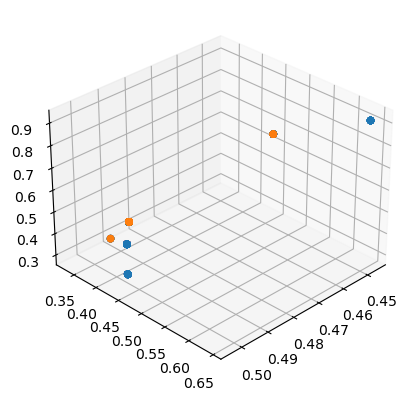

 46%|████▌     | 23/50 [51:20<1:00:06, 133.59s/it]

leader <__main__.Particle object at 0x00000184F016F400>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162370>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BAF0>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F400>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.4469470

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0760100>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BAF0>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F400>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162370>
[

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B400>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162370>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162370>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0760

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015D100>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017B400>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015D100>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F400

leader <__main__.Particle object at 0x00000184F017B400>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0760100>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015FFA0>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F400>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B400>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015D100>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0162370>


leader <__main__.Particle object at 0x00000184F0162370>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BAF0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015D100>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B400>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F400>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015FFA0>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015FFA0>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F400>
[20

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015FFA0>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F400>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017B400>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F016F400>
[20, 19, 18, 17,

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0760100>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B400>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015D100>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0162370>
[20, 19, 18, 17, 0]
0.2976780923
0.5

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015FFA0>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015D100>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0760100>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162370>
[20, 0, 19, 18, 17]


maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015FFA0>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F400>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B400>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0162370>
[20, 0, 19, 18, 1]
0.278435649
0.37

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BAF0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015FFA0>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BAF0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01544F0>
[20, 

leader <__main__.Particle object at 0x00000184F015D100>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015FFA0>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015D100>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01544F0>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F400>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B400>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B400>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015FFA0>
[20, 0

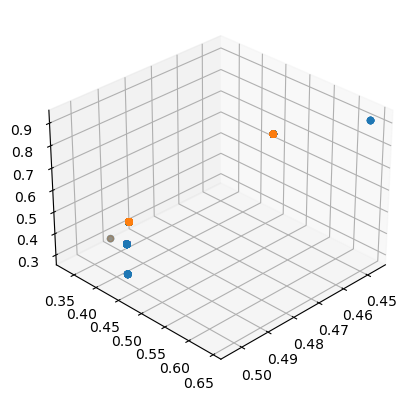

 48%|████▊     | 24/50 [53:35<58:03, 133.99s/it]  

leader <__main__.Particle object at 0x00000184F0194880>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194880>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194880>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distan

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 20, 2,

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F0194880>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 19, 18, 1]
0.1443

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 1, 2, 3]
0.0860810233
0.261551

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296

leader <__main__.Particle object at 0x00000184F0194880>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194880>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035

leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 1, 2, 3]
0.0860810233
0.26155

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Partic

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194880>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 2, 20, 19]
0.120

leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distanc

[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distan

leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194880>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIj

leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194880>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217

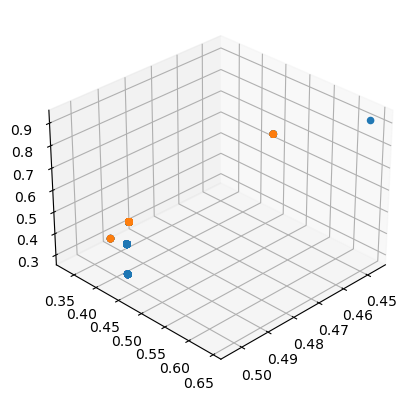

 50%|█████     | 25/50 [55:50<55:58, 134.32s/it]

leader <__main__.Particle object at 0x00000184F076E6A0>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F015BE80>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F076E6A0>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0162850>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.4

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0162550>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D66A0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F07724F0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0124400>
[0, 20, 1, 19, 18]
0.1443515385
0.37809

leader <__main__.Particle object at 0x00000184F01D6730>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162160>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01D6370>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F076E6A0>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0124400>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F015BE80>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01D6370>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000

leader <__main__.Particle object at 0x00000184F0162160>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D6730>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0162850>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015BE80>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01D66A0>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B940>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162850>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D66A0>
[0, 1, 2, 3, 4]
0.0745753439
0

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F076E6A0>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0162850>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D66A0>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B940>
[0, 20, 19, 18, 1]
0.1443515385
0.

maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F01D6730>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0124400>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0162850>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015BE80>
[20, 0, 19, 18, 17]
0.2976780923
0.41657

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F01D6730>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F0162160>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B940>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00

[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F01D6370>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194FD0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F01D6730>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.P

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D6370>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F0162850>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076E6A0>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01D6370>
[0, 1, 2, 20, 3]

maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F0162160>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01D6730>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F017B940>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F01D66A0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D66A0>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F076E6A0>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01D6370>
[0, 1, 2, 3, 4]
0.0745753439
0.187256

leader <__main__.Particle object at 0x00000184F01D6370>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F0162160>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015BE80>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BE80>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_dis

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B940>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F07724F0>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F01D6370>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F01D66A0>
[0, 1, 2, 20, 3]
0.086081023299999

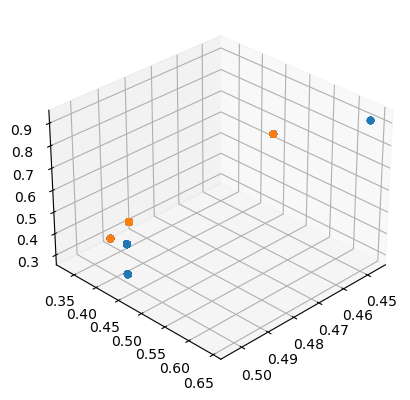

 52%|█████▏    | 26/50 [58:02<53:30, 133.77s/it]

leader <__main__.Particle object at 0x00000184F015D5E0>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0772C70>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0772C70>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01D6370>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbo

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01C6490>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01943D0>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B2B0>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B2B0>
[20, 0, 19, 1

maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F015D5B0>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B820>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0772C70>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01D6370>
[20, 0, 19, 18, 17]
0.2976780923
0.4165773

[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0162400>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0772C70>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162400>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__m

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01C6490>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D6370>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01943D0>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194700>
[0, 20, 1, 

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015BAC0>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B2B0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015DFD0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017B2B0>
[20, 19, 18, 17, 16]
0.3

maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F01D6370>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015D3D0>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F01C6490>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015D700>
[20, 0

leader <__main__.Particle object at 0x00000184F015D700>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0772C70>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B820>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B8B0>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.6

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015D5E0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015F310>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015D280>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015D3D0>
[0, 20, 1, 2, 19]
0.1205437072
0.33047

leader <__main__.Particle object at 0x00000184F01245B0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B820>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162400>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B820>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_dist

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01245B0>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194700>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015DFD0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B8B0>
[20, 0, 19, 18, 17]
0.2976780923
0.41

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015DFD0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015D5E0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B820>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F01C6490>
[0,

leader <__main__.Particle object at 0x00000184F015D280>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F0194700>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B8B0>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017B250>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073


maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B2B0>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194700>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015D280>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01D6370>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772

leader <__main__.Particle object at 0x00000184F0162400>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015D3D0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BAC0>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F01245B0>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.92

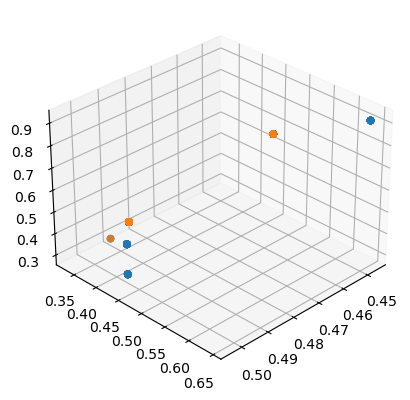

 54%|█████▍    | 27/50 [1:00:20<51:39, 134.75s/it]

leader <__main__.Particle object at 0x00000184F07460D0>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F07460D0>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F07460D0>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015F310>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194FD0>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015F310>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015F310>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 1, 2, 20, 19]
0.1205437072
0.27919

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194FD0>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F07460D0>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015F310>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015F310>
[20, 0, 1, 2, 19]
0.2546278177
0

leader <__main__.Particle object at 0x00000184F015F310>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F07460D0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.92

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F07460D0>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015F310>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F07460D0>
[0, 20, 1, 19, 18]
0.1443515385
0.3780924

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F07460D0>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015F310>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F07460D0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F07460D0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F07460D0>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015F310>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015F310>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0

leader <__main__.Particle object at 0x00000184F07460D0>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015F310>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F07460D0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F07460D0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.777777777

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F07460D0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F07460D0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194FD0>
[20, 0, 1, 2,

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015F310>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F07460D0>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015F310>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.425

leader <__main__.Particle object at 0x00000184F015F310>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F07460D0>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015F310>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015F310>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015F310>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F07460D0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 1, 2, 3, 20]
0.086081

leader <__main__.Particle object at 0x00000184F015F310>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F07460D0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015F310>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015F310>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F07460D0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015F310>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 1, 2, 3, 20]
0

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F07460D0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015F310>
[20, 0, 1

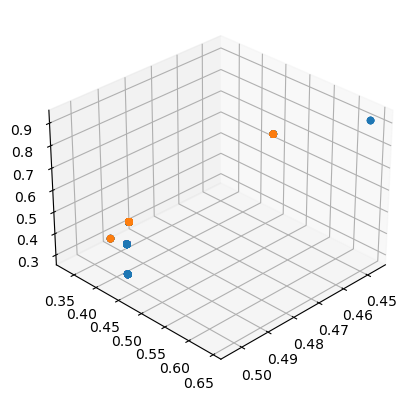

 56%|█████▌    | 28/50 [1:02:32<49:10, 134.12s/it]

leader <__main__.Particle object at 0x00000184F076E2B0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B0A0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194BE0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F08E9130>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
e

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162850>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194BE0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B670>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[20, 0, 1, 19, 18]
0.278435649
0.3

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F08E9130>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194580>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BDC0>
[20, 0, 1, 19, 18]
0.278435649


leader <__main__.Particle object at 0x00000184F015B670>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01589A0>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015B670>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.44694703

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194580>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F08E9130>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158DC0>
[0, 20, 1, 19, 18]
0.14

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01589A0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F01946A0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076E2B0>
[0,

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01589A0>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162850>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F08E9130>
[20, 19, 18, 0, 1]
0.278435649
0.

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194580>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0162850>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F0158DC0>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F08E9130>
[20, 19, 0

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076E2B0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B670>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0158DC0>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0162850>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01589A0>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F08E9130>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B670>
[0, 1, 20, 2, 3]
0.0860810233
0.210267

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158DC0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015B670>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01589A0>
[0, 1,

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162850>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194580>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01946A0>
[20, 0, 19, 1, 2]
0.2

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B0A0>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B0A0>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0162850>
[0, 20, 1, 2, 3]
0.086081

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194BE0>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194580>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162850>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194BE0>
[20, 0, 19, 1, 2]
0.2546278177
0.3304768213

leader <__main__.Particle object at 0x00000184F01946A0>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F08E9130>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158DC0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01946A0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distan

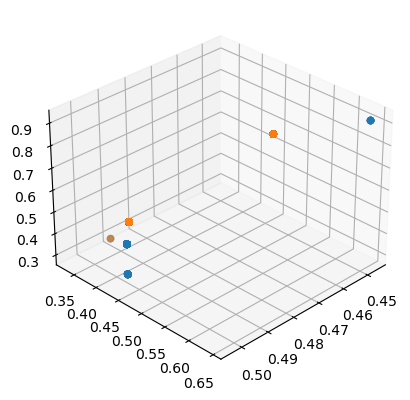

 58%|█████▊    | 29/50 [1:04:49<47:10, 134.79s/it]

leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
co

[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main_

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 20, 1, 19, 18]
0.14435153

leader <__main__.Particle object at 0x00000184F020FF70>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.77777777777

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 1, 2, 20, 19]
0.1205437072
0.27919296

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.49680

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 19, 0, 1, 18]
0.278435649
0.46154

[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015BDC0>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.4

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 2, 3]
0.2201651338
0.261551

leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015BDC0>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.77777777777

leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.57740615

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015BDC0>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 19, 0, 18, 17

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015BDC0>
[20, 19, 0, 1, 18]
0.278435

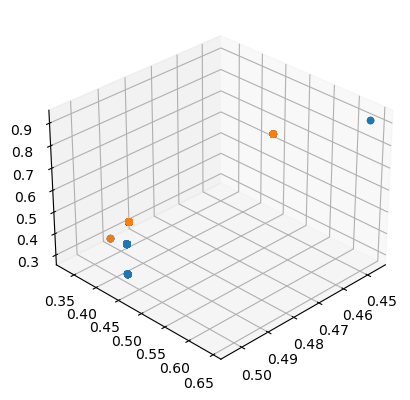

 60%|██████    | 30/50 [1:07:04<45:02, 135.11s/it]

leader <__main__.Particle object at 0x00000184F0154460>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F0A0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F0A0>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076E250>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B8E0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F0A0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015B8E0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B8E0>
[20, 19, 18, 17, 16]
0.3619639580999999
0.628604

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076E250>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F0A0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017B280>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B8E0>
[20, 19, 0, 1, 18]


leader <__main__.Particle object at 0x00000184F076E250>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0154460>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F0A0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0154460>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_val

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F016F0A0>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076E250>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B280>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B8E0>
[20, 0, 1, 19, 2]
0.2546278177
0.33

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076E250>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0154460>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F0154460>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076E250>
[20, 0, 1, 19, 18]
0.278435649
0.

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F0A0>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017B280>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0154460>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076E250>
[20, 0, 1, 2, 3]
0.220

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F0A0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076E250>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076E250>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B280>
[20, 19, 0, 1, 2]
0.2546278177
0

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076E250>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F0A0>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F0A0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0154460>
[0, 20, 19, 18, 17]
0.1635939818
0.416

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F016F0A0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015B8E0>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076E250>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076E250>
[0, 1, 2, 3, 20]
0.0860810232

[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F0A0>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F0A0>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F016F0A0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076E250>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F0A0>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F076E250>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F076E250>
[0, 1, 20, 2, 3]
0.08608102

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B280>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F076E250>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F0A0>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B8E0>
[20

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B8E0>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F0A0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076E250>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B8E0>
[20, 0,

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B280>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0154460>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F016F0A0>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle o

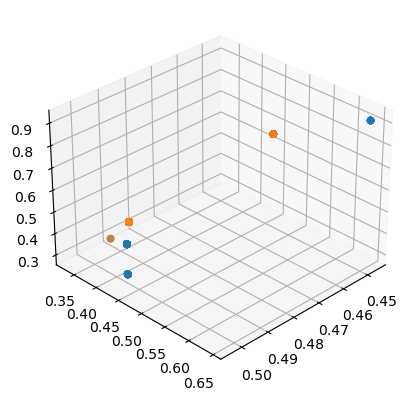

 62%|██████▏   | 31/50 [1:09:18<42:38, 134.66s/it]

leader <__main__.Particle object at 0x00000184F0194220>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076E250>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194220>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmo

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194220>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F076E250>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F076E250>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194220>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194220>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x0

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194220>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076E250>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076E250>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194220>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076E250>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194220>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194220>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194220>
[0, 20, 19, 1

leader <__main__.Particle object at 0x00000184F0194220>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194220>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194220>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076E250>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194220>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076E250>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076E250>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194220>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194220>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076E250>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194220>
[0, 1, 2, 20, 3]
0.08608102329999999
0.210267597200

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194220>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F076E250>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194220>
[0, 20, 19, 1, 18]

maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F076E250>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194220>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F076E250>
[20, 19, 18, 17, 0]
0.2976780923
0.500

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 1, 20, 2, 19]

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194220>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194220

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194220>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F076E250>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F076E250>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194220>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194220>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194220>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194220>
[0, 20, 19, 1, 18]
0.1443

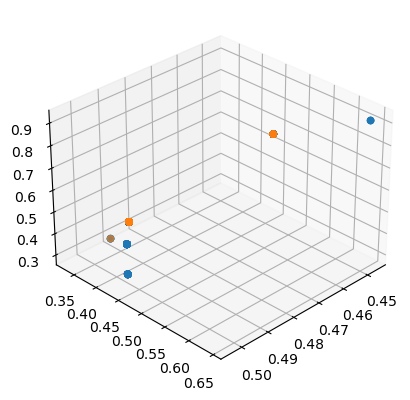

 64%|██████▍   | 32/50 [1:11:33<40:26, 134.81s/it]

leader <__main__.Particle object at 0x00000184F01544F0>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 

leader <__main__.Particle object at 0x00000184F020FF70>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01544F0>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 19, 18]
0.278435649
0.

leader <__main__.Particle object at 0x00000184F01544F0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01544F0>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01544F0>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 20, 19, 1, 2]
0.1205437072
0

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 1, 20, 19, 18]
0.1443515385


maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1,

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 1

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.4253786

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01544F0>
[0, 20, 19, 1, 18]
0.1443515385
0.3

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 19, 0, 18, 1]
0.2784

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01544F0>
[20, 0, 

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01544F0>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 2, 19]
0.2546278177

leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01544F0>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FF70>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01544F0>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0

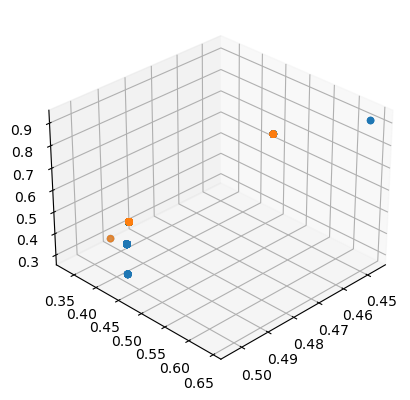

 66%|██████▌   | 33/50 [1:13:48<38:11, 134.79s/it]

leader <__main__.Particle object at 0x00000184EFE26EE0>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D60D0>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184EFE26EE0>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184EFE26EE0>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_dist

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B160>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B160>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184EFE26EE0>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214

leader <__main__.Particle object at 0x00000184F015B160>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B160>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B160>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B160>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778


maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE26EE0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015B160>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B160>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B160>
[0, 20, 19, 18, 17]
0.1

leader <__main__.Particle object at 0x00000184EFE26EE0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015B160>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.57740

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015B160>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184EFE26EE0>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.32

leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184EFE26EE0>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D60D0>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distanc

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184EFE26EE0>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE26EE0>
[20

leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184EFE26EE0>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184EFE26EE0>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.5774061

leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D60D0>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B160>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance

leader <__main__.Particle object at 0x00000184F015B160>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184EFE26EE0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184EFE26EE0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.77777

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184EFE26EE0>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184EFE26EE0>

leader <__main__.Particle object at 0x00000184F015B160>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE26EE0>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184EFE26EE0>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184EFE26EE0>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184EFE26EE0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B160>
[0, 20, 19, 18, 17]
0.1635939818
0.41

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015B160>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D60D0>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D60D0>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.425378600

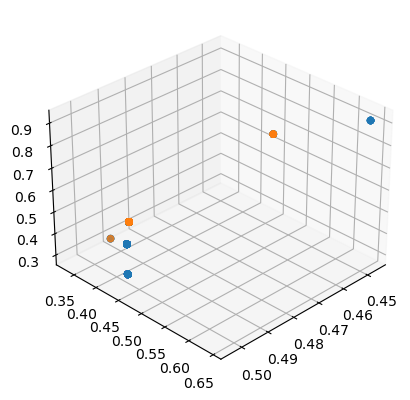

 68%|██████▊   | 34/50 [1:16:03<35:57, 134.84s/it]

leader <__main__.Particle object at 0x00000184F015B250>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158700>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B250>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158700>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158700>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.425

leader <__main__.Particle object at 0x00000184F015B250>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B250>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015B250>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B250>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158700>
[0, 20, 19, 1, 18]
0.1443515385
0.37809

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B250>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158700>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x000001

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0158700>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0158700>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F01

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158700>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158700>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015B250>
[0, 20, 1, 

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015B250>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158700>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B250>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B250>
[0, 20, 19, 1, 18]
0.1443515385
0.3

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158700>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B250>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B250>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484


maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0158700>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B250>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 1, 20, 19, 

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158700>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B250>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 1, 20, 19, 18]
0.1443515385
0.326808

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B250>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0158700>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B250>
[0, 20, 1, 2, 19]


[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158700>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.136463376

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158700>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0158700>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B250>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0158700>
[20, 19, 0, 18, 1]
0.278

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0158700>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194

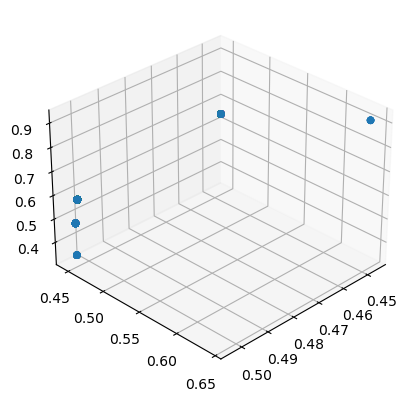

 70%|███████   | 35/50 [1:18:17<33:40, 134.71s/it]

leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158700>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015AC10>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158700>
[20, 19, 0, 18, 1]
0.278435649
0.461547522999999

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158700>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015AC10>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1, 19, 2]
0.2546

leader <__main__.Particle object at 0x00000184F0158700>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158700>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158700>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158700>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158700>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158700>
[0, 20, 1, 2, 3]
0.08608102

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0158700>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158700>
[0, 20, 1, 19, 2]
0.1205437072
0.3304

[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158700>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158700>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__

leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158700>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158700>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1, 19, 2]
0.2546278177


maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1, 19, 2]
0.2546278177


maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0158700>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158700>
[20, 0, 1, 19,

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158700>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158700>
[20, 0, 1, 19, 2]
0.2546278

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158700>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0158700>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1

leader <__main__.Particle object at 0x00000184F016F040>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F016F040>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158700>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158700>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F016F040>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F0158700>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158700>
[0, 20, 19, 1, 2]
0.1205437072

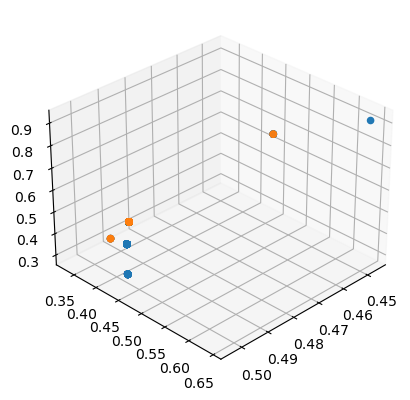

 72%|███████▏  | 36/50 [1:20:33<31:28, 134.92s/it]

leader <__main__.Particle object at 0x00000184F015FFA0>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B220>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01548B0>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015BC70>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_dist

leader <__main__.Particle object at 0x00000184F01548B0>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015FFA0>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015FFA0>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194130>
[0, 1, 20, 2, 19]
0.1205437072
0.2791929

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015B220>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015FFA0>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01548B0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015B220>
[0, 20, 19, 1, 2

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194130>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B220>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 20, 19, 18, 17]
0.1635939818
0.4

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194130>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01548B0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FAC0>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276

leader <__main__.Particle object at 0x00000184F01548B0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015B220>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015FFA0>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01548B0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.44694703

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01548B0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BC70>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 1, 20, 2, 19]
0.1205437072
0.279192

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BC70>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B220>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BC70>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01548B0>
[0, 20, 19, 18, 1]
0.1443515385
0.378092

leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B220>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FAC0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194130>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
e

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D00>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194130>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01548B0>
[0, 20, 19, 18, 17]
0.1635939818
0.4165

leader <__main__.Particle object at 0x00000184F015BC70>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B220>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01548B0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_dista

leader <__main__.Particle object at 0x00000184F020FAC0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B220>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F015FFA0>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194130>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288

leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01548B0>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015FFA0>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194130>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932

leader <__main__.Particle object at 0x00000184F01548B0>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FAC0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B220>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.5774061

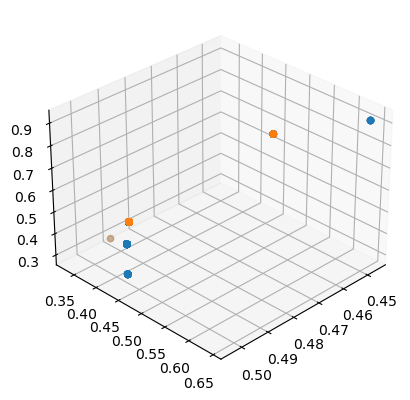

 74%|███████▍  | 37/50 [1:22:47<29:13, 134.87s/it]

leader <__main__.Particle object at 0x00000184F016F040>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F040>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.654375927199

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F040>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 18, 1]
0.278435649
0.4615475229999999

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[0, 1, 20, 2, 19]
0.12

maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1

leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
con

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 

leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F040>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F040>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 

leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.6428586

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 18,

leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_dis

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 19, 18, 1]
0.2

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F016F040>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[0, 20, 1

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F016F040>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F016F040>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle obj

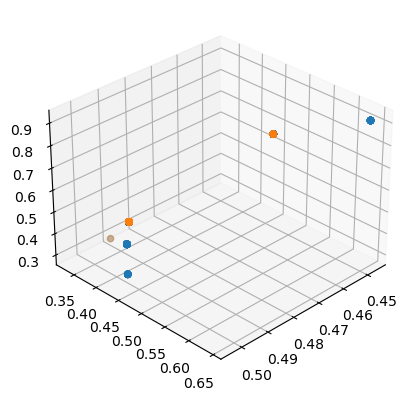

 76%|███████▌  | 38/50 [1:25:02<26:58, 134.91s/it]

leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BF40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF40>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 

leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217

maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 19, 1, 2]
0.120

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BF40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BF40>
[20, 19, 18, 0, 17]
0.2976780923
0.500032409

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF40>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 1, 2, 19]
0.1205437072
0.3

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BF40>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214


maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF40>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF40>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 1, 2, 3, 20]
0.086081

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF40>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF40>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 1, 2, 19]
0.12054

leader <__main__.Particle object at 0x00000184F017BF40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BF40>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BF40>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.77777

leader <__main__.Particle object at 0x00000184F017BF40>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.482174828

leader <__main__.Particle object at 0x00000184F017BF40>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BF40>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF40>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF40>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF40>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF40>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle obj

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BF40>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 1, 2, 20, 19]
0.120

leader <__main__.Particle object at 0x00000184F017BF40>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BF40>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.654

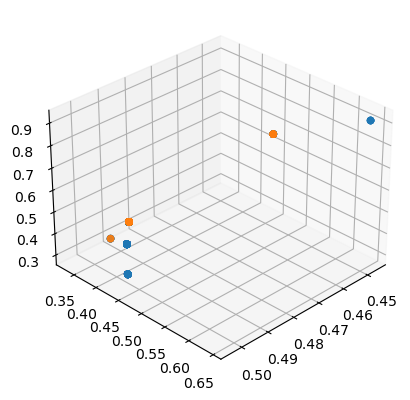

 78%|███████▊  | 39/50 [1:27:18<24:47, 135.20s/it]

leader <__main__.Particle object at 0x00000184F015DEB0>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076EEE0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777

leader <__main__.Particle object at 0x00000184F017B340>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076EEE0>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F07722E0>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B340>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035


maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F07722E0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B340>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015DEB0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015DEB0>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F07722E0>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B340>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015DEB0>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076EEE0>
[20, 0, 19, 1, 2]
0.2546

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076EEE0>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B340>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017B820>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 20, 19, 18, 1]
0.1443515385
0.378

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B340>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B340>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B820>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 1, 20, 19, 2]
0.1205437072
0.279192964

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B820>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B340>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F07722E0>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076EEE0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B340>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B820>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F07722E0>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076EEE0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B340>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.519476

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F07722E0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B340>
[0, 1, 20, 19, 2]
0.12

leader <__main__.Particle object at 0x00000184F076EEE0>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076EEE0>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B820>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B340>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.51947683849999

leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B820>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B820>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076EEE0>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_d

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B340>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076EEE0>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F07722E0>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Part

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F07722E0>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F076EEE0>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F07722E0>
[0, 1, 20, 19, 2]
0.1205437072


maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076EEE0>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F07722E0>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076EEE0>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x0

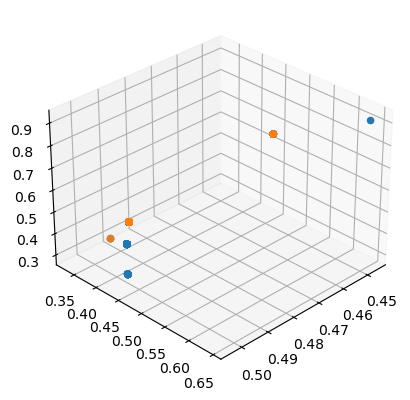

 80%|████████  | 40/50 [1:29:32<22:27, 134.70s/it]

leader <__main__.Particle object at 0x00000184F0194280>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F08C90D0>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194280>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162370>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle obj

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F08C90D0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F08C90D0>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F08C90D0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F08C90D0>
[0, 1, 20, 19, 2]
0.1205437072
0.2

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194280>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162370>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194280>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F08C90D0>
[0, 1, 20, 19, 2]
0.1205

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162370>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F08C90D0>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162370>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194280>
[0, 20

leader <__main__.Particle object at 0x00000184F0162370>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194280>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162370>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194280>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjog

leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F08C90D0>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194280>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.44694

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194280>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194280>
[20, 19, 0, 18, 17]
0.297678092

leader <__main__.Particle object at 0x00000184F08C90D0>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F08C90D0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.5025

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F08C90D0>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162370>
[0, 20, 19, 18, 17]
0.16359

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194280>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162370>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194280>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015D

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015DEB0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194280>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162370>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194280>
[20, 19,

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F08C90D0>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015DEB0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F08C90D0>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194280>
[20, 19, 18, 17, 16]
0.361963

leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162370>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194280>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162370>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.65437

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162370>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F015DEB0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162370>
[20, 1

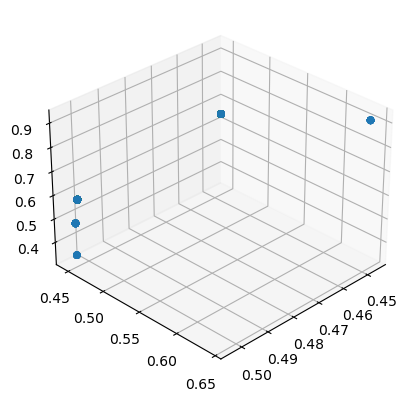

 82%|████████▏ | 41/50 [1:31:51<20:23, 135.92s/it]

leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B760>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.50

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 20,

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B760>
[0, 1, 2, 20, 3]


maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 0, 1, 2, 3]
0.2201651338
0

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 0, 1, 2, 3]
0.2201651338
0.26155145

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B760>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 20, 19, 1, 1

leader <__main__.Particle object at 0x00000184F017B760>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B760>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B760>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.92

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.39575

leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_dista

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B760>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B760>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B760>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.321

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B760>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 20, 

leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B760>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 1, 2

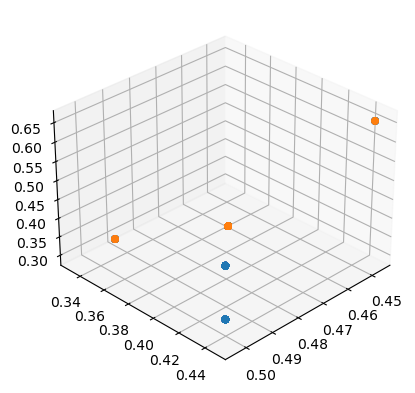

 84%|████████▍ | 42/50 [1:34:05<18:03, 135.50s/it]

leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0154850>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F076EEB0>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F07722B0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076EEB0>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162430>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F07722B0>
[0, 1, 20, 2, 3]
0.0860810233
0.

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01621F0>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0154850>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F07722B0>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01621F0>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162430>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01621F0>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 19, 0, 1, 18]
0.278435649
0.4615475

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F07722B0>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BCD0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01621F0>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0162430>
[20, 19, 18, 0, 17]
0.2976780923
0.500032409

maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F01621F0>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01621F0>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F076EEB0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F076EEB0>
[

[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F0154850>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0154850>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.1364

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0162430>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162430>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Par

[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0154850>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F076EEB0>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01621F0>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.777777777777

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0154850>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F076EEB0>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F07722B0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01621F0>
[20, 19, 18, 0, 1]
0.27

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0154850>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01621F0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0154850>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01621F0>
[0, 20, 19, 18, 17]
0.1635939818
0.4165773705999

maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F07722B0>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F076EEB0>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162430>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076EEB0>
[20, 19,

maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F076EEB0>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076EEB0>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F0154850>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F0162430>
[20, 19, 18

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01621F0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0154850>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F076EEB0>
[20, 0, 19, 18, 1]
0.

maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F017BCD0>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F076EEB0>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F076EEB0>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F0162430>
[20, 0

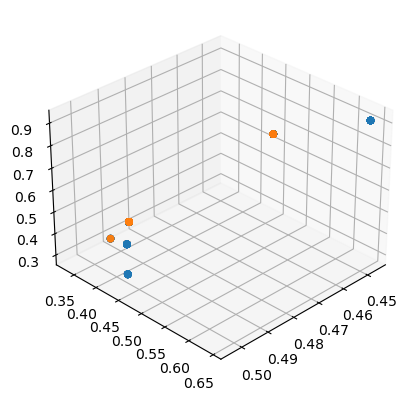

 86%|████████▌ | 43/50 [1:36:20<15:46, 135.18s/it]

leader <__main__.Particle object at 0x00000184F0169040>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017B280>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017B7F0>
[20, 19, 18, 17, 16]
0.3619639580999999
0.6286041412
0.8089383059999999
0.9115193904
0.9115193904
maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F017B280>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_dista

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017B7F0>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B970>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015DAF0>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015DAF0>
[0, 20, 1, 19, 2]
0.120543

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0124310>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B7F0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0760100>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015DAF0

leader <__main__.Particle object at 0x00000184F017B280>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0760100>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B7F0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017B7F0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.44694703

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B280>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B970>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0760100>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0124310>
[0, 20, 1, 19, 2]
0.1205

maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F015DAF0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0169040>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0124310>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B970>
[0, 1, 20, 2, 3]
0.0860810233

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017B280>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F0760100>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0169040>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0760100>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0124310>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0760100>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0124310>
[20, 0, 1

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B280>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015DAF0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0760100>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017B970>
[20, 0,

leader <__main__.Particle object at 0x00000184F017B970>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B970>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B280>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0169040>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.5774061

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B7F0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0760100>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015DAF0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0169040>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0124310>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0760100>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B7F0>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B7F0>
[20, 0, 1, 2, 3]
0.2201651338
0.2

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0124310>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F0760100>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B970>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0124310>
[20, 0, 19, 

leader <__main__.Particle object at 0x00000184F015DAF0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B970>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015DAF0>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B7F0>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_v

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B7F0>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0124310>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B7F0>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0760100>
[20, 19, 0, 18, 17]
0.2976780923
0.50003

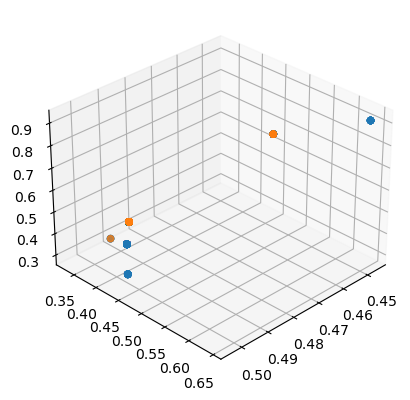

 88%|████████▊ | 44/50 [1:38:36<13:32, 135.46s/it]

leader <__main__.Particle object at 0x00000184F0169040>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0169040>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0169040>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BDC0>
[20, 19, 0, 18, 1]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.5

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B460>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BDC0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017B460>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BDC0>
[20, 19, 0, 1, 18]
0.2784

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0169040>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0169040>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B460>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[20, 19, 0, 18, 17]
0.2976780923
0.500032

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B460>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B460>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F0169040>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BDC0>
[20, 0, 19

leader <__main__.Particle object at 0x00000184F0169040>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B460>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0169040>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0169040>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015BDC0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B460>
[0, 1, 2, 20, 19]
0.1205437072
0.2791

leader <__main__.Particle object at 0x00000184F017B460>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F0169040>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B460>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_dista

leader <__main__.Particle object at 0x00000184F017B460>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0169040>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B460>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BDC0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
e

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0169040>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015BDC0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BDC0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 20, 19, 18, 1]
0.14435

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B460>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0169040>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0169040>
[0, 20, 19, 1, 18]
0.1443515385
0.

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0169040>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B460>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.519476

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B460>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 1, 20, 2, 3]
0.0860810233
0.21026759720000002
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017B460>
[20, 0, 19, 1, 2]
0.2546278177
0.3304768

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0169040>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F015BDC0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 1, 20, 2, 3]
0.086

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B460>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0169040>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B460>
[20, 0, 19, 1, 2]
0.2546278177
0.33

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B460>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015BDC0>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0169040>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214

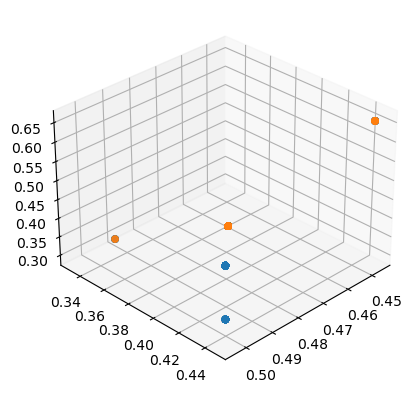

 90%|█████████ | 45/50 [1:40:51<11:16, 135.30s/it]

leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015B940>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B940>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_di

leader <__main__.Particle object at 0x00000184F0158370>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162AF0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162AF0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B460>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.4469

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0162AF0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE041C0>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0162AF0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B460>
[20, 0, 19, 1, 2]
0.25

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162AF0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162AF0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0169040>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B940>
[20, 19, 0, 18, 1]
0.27

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B940>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162AF0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0169040>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158370>
[20, 19, 0, 18, 1]
0.278435649
0.

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158370>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158370>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162AF0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B460>
[20, 0, 19, 1, 2]
0.2546278177
0.

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE041C0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B940>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0162AF0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162AF0>
[0, 20, 19, 18, 1]
0.14

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0162AF0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B460>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015B940>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0169040>
[20, 19, 18, 17, 0]
0.2976

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B460>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184EFE041C0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017B460>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017B460>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184EFE041C0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162AF0>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017B460>
[0, 20, 1, 19, 18]
0.1443515385
0.

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162AF0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015B940>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0162AF0>
[0, 20, 19, 18, 

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0162AF0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158370>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0169040>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158370>
[20, 0, 1

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0158370>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158370>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B940>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0162AF0>
[0, 20, 1, 19, 2]
0.1205

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015B940>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015B940>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0158370>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0162AF0>
[0, 20, 19, 18, 1]

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0169040>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE041C0>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0169040>
[20, 0, 1, 2, 19]
0.2546278177
0.3304

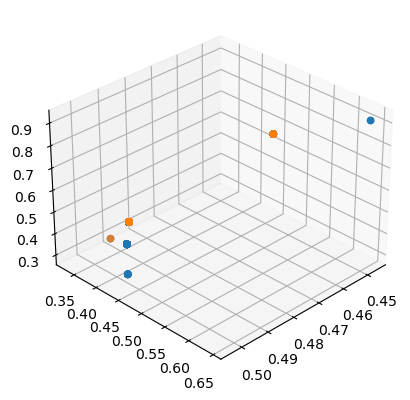

 92%|█████████▏| 46/50 [1:43:06<09:01, 135.43s/it]

leader <__main__.Particle object at 0x00000184EFE041C0>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE041C0>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184EFE041C0>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 20, 1, 19, 2]
0.1205437072
0.3304

leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12

leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.577204168

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.496802

leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF70>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 0, 1, 19, 

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF70>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.577204168

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF70>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BF70>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF70>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF70>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 19, 18, 17]
0.2976

leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162AF0>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0162AF0>
[20, 0, 1, 2, 19]
0.2546278177
0

leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF70>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184EFE041C0>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371


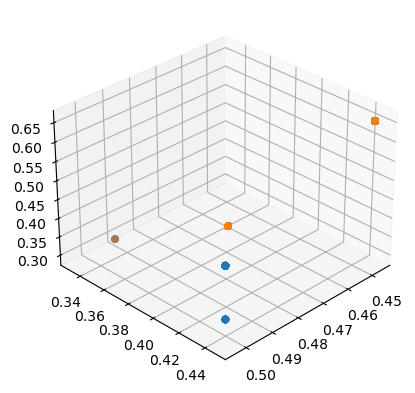

 94%|█████████▍| 47/50 [1:45:21<06:45, 135.28s/it]

leader <__main__.Particle object at 0x00000184F0194FD0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194FD0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194FD0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194FD0>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 1, 2, 3, 20]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 1, 2, 20, 19]
0.1205437072
0.279192965
0.3957526058
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF70>
[20, 0, 1, 19, 18]
0.278435649
0.

maxIjogbon 0.446606371
cont_distance 0.642858658
C2 0.9115193904
end_valmod 0.8333333333333334
sum 0.14985738657142855
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 1, 20, 19, 18]
0.1443515385
0.3268086276
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 20, 1, 19, 2]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 1, 20, 2, 3]
0.0860810233
0.210267597200

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF70>
[20, 19, 18, 0, 1]
0.278435649
0.461547

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 1, 19, 18]
0.1443515385
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484


maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 20, 19, 1, 2]
0.1205437072
0.3304

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0

leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.92307692307

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 20, 19, 1, 2]
0.1205437072
0.3

leader <__main__.Particle object at 0x00000184F017BF70>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_va

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 1, 2, 19]
0.1205437072
0.33047682

leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F017BF70>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194FD0>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.

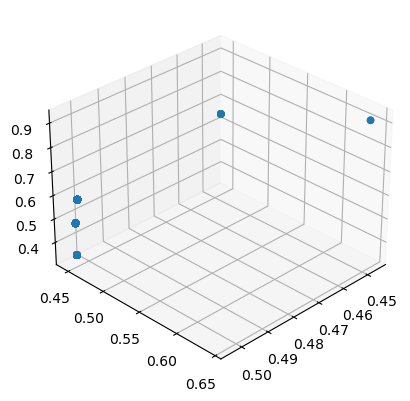

 96%|█████████▌| 48/50 [1:47:37<04:30, 135.39s/it]

leader <__main__.Particle object at 0x00000184F0194D90>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F0194D90>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D90>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 19, 18, 17, 0]
0.2976780923
0.5000324096
0.6160807086
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distanc

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 2, 3]
0.2201651

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[0, 1, 2, 3, 4]
0.0745753439
0.1872562384
0.25784751589999994
0.2983013755999999
0.2983013755999999
maxIjogbon 0.490886818
cont_distance 0.331890241
C2 0.2983013755999999
end_valmod 0.9166666666666666
sum 0.17348246271428572
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 2, 3]
0.22016

leader <__main__.Particle object at 0x00000184F0194D90>
[0, 1, 2, 20, 3]
0.08608102329999999
0.21026759720000002
0.2923645541
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.482174828

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[0, 1, 20, 19, 2]
0.1205437072
0.27919296499999996
0.4253786003999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.321

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.33047682

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 18]
0.278435649


maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.33047682

leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
en

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 19, 18, 1]
0.278435649

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 18]
0.278435

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 19, 18, 1]
0.278435649
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.330

leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 2, 3]
0.2201651338
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F0194D90>
[20, 0, 1, 19, 2]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valm

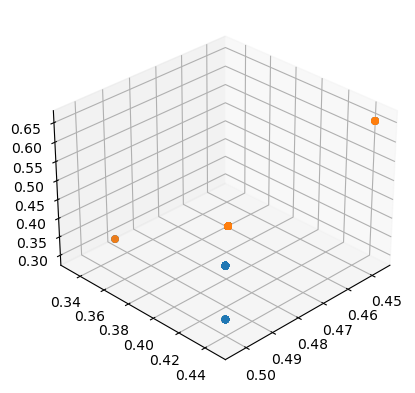

 98%|█████████▊| 49/50 [1:49:53<02:15, 135.73s/it]

leader <__main__.Particle object at 0x00000184F01D6550>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D6550>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015A880>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 1, 2, 19]
0.2546278177
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.4469

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015F310>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015F310>
[0, 20, 19, 18, 1]
0.1443515385
0.37809248399999995
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015FC70>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015A880>
[20, 0, 19, 18

leader <__main__.Particle object at 0x00000184F01B8400>
[20, 19, 18, 0, 1]
0.278435649
0.46154752299999996
0.5583533786999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01D6550>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015A880>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01D6550>
[0, 20, 19, 18, 17]
0.1635939818
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbo

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015FC70>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015FC70>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FA90>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01B

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015FC70>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01B8400>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015A880>
[20, 19, 18, 17, 16]
0.3619639580999999
0.62

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015FC70>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015FC70>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015FC70>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle 

leader <__main__.Particle object at 0x00000184F01B8400>
[20, 19, 0, 1, 2]
0.2546278177
0.41393186039999996
0.4480533445999999
0.48217482879999995
0.48217482879999995
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.48217482879999995
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015A880>
[20, 0, 19, 1, 18]
0.278435649
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 0, 19, 1, 2]
0.2546278177
0.33047682139999995
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01D6550>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F01B8400>
[0, 1, 20, 2, 19]
0.1205437072
0.279192965
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01D6550>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.

maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F020FA90>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015F310>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015FC70>
[20, 0, 19, 18, 17]
0.2976780923
0.41657

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015A880>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01B8400>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F015FC70>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015A880>
[0, 20, 1, 2, 3]
0

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015FC70>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015F310>
[0, 20, 1, 2, 19]
0.1205437072
0.3304768214
0.42537860040000003
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F01B8400>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015F310>
[0, 20, 1, 2, 1

maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015FC70>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F01D6550>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015A880>
[0, 20, 1, 2, 3]
0.0860810233
0.2615514536
0.3219905487
0.3443240932
0.3443240932
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.3443240932
end_valmod 0.9285714285714286
sum 0.1912363379523809
leader <__main__.Particle object at 0x00000184F01D6550>
[20, 19, 0, 18, 

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01B8400>
[0, 20, 19, 1, 18]
0.1443515385
0.378092484
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015F310>
[20, 19, 0, 1, 18]
0.278435649
0.46154752299999996
0.5194768384999999
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015FC70>
[20, 0, 19, 18, 17]
0.2976780923
0.41657737059999994
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015FC70>
[20, 19, 18,

leader <__main__.Particle object at 0x00000184F015FC70>
[20, 0, 1, 19, 18]
0.278435649
0.378092484
0.4968020943
0.577406154
0.577406154
maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F01D6550>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FA90>
[0, 20, 19, 1, 2]
0.1205437072
0.3304768214
0.4480533446
0.4821748288
0.4821748288
maxIjogbon 0.503587055
cont_distance 0.446947035
C2 0.4821748288
end_valmod 0.9230769230769231
sum 0.18132762257142856
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.818181818

maxIjogbon 0.502584073
cont_distance 0.446947035
C2 0.577406154
end_valmod 0.7777777777777778
sum 0.12511971404761904
leader <__main__.Particle object at 0x00000184F015FC70>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015FC70>
[20, 19, 0, 18, 17]
0.2976780923
0.5000324096
0.5772041684
0.6543759271999999
0.6543759271999999
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759271999999
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F020FA90>
[20, 19, 18, 0, 17]
0.2976780923
0.5000324096
0.6160807086
0.6543759272
0.6543759272
maxIjogbon 0.446606371
cont_distance 0.446947035
C2 0.6543759272
end_valmod 0.8181818181818182
sum 0.13646337633333333
leader <__main__.Particle object at 0x00000184F015F310>
[0, 20, 1,

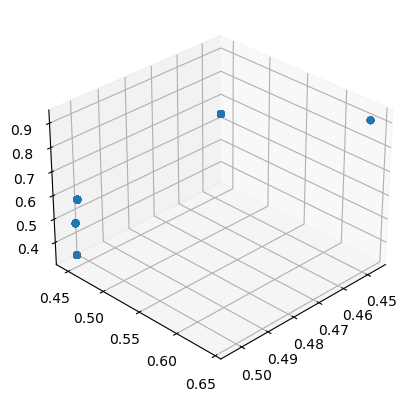

100%|██████████| 50/50 [1:52:10<00:00, 134.60s/it]


In [91]:
#MOPSO main loop
start1 = time.perf_counter()
exec_timemopso = []
avg_cpu_utilmopso = []
for it in tqdm(range(1, maxIt)):
    start1 = time.perf_counter()
    for i in range(nPop):
        leader = SelectLeader(Repos,beta)
        print ("leader", leader)
        # update velocity
#         print ("Particles[i].best_position", Particles[i].best_position, "type", 
   #                type(Particles[i].best_position))
        #leader.position = np.array(leader)
        leaderpos_1 = leader.position
        
        #print ("Repos", Repos, "type", type(Repos))
        #print ("beta", beta, "type", type(beta))
        #print ("Particles[i].velocity", Particles[i].velocity, "type", type(Particles[i].velocity))
        
        # Particles[i].position = np.array(Particle[i].position)
        
        #print ("Particles[i].position", Particles[i].position, "type", 
            #      type(Particles[i].position))
        #print ("leader.position", leader.position, "type", 
             #     type(leader.position))
        
        positions = zip(Particles[i].best_position, Particles[i].position)
        position_diff = [x - y for (x, y) in positions]
        
        leaders = zip(leaderpos_1, Particles[i].position)
        leader_pos = [x - y for (x, y) in leaders]
        
        Particles[i].velocity = w*Particles[i].velocity  \
            + c1*np.random.rand(1,nVar)[0]*(position_diff) \
            + c2*np.random.rand(1,nVar)[0]*(leader_pos)
        
       
        # update position
        Particles[i].position = Particles[i].position + Particles[i].velocity
        

        # evaluation
        tp = dupfix(Particles[i].position)
        Particles[i].cost = MOCPParticle(tp)
        
        

        if Dominates(Particles[i].cost,Particles[i].best_cost):
            Particles[i].best_position = tp
            Particles[i].best_cost = Particles[i].cost
        else:
            if np.random.rand() > 0.5:
                Particles[i].best_position = tp
                Particles[i].best_cost = Particles[i].cost
      
    end1 = time.perf_counter()
    end_time_mopso = end1 - start1
        
    exec_timemopso.append(end_time_mopso)
    
    Repos = Repos + Particles
    Repos = DetermineDomination(Repos)
    Repos = [item for item in Repos if item.IsDominated == False ]
    fitmopso = [item.cost for item in Particles]
    fitmopso = [item.cost for item in Repos]
    ftDfmopso = pd.DataFrame(fitmopso)
    ftDfmopso = pd.DataFrame(fitmopso)
    hyp = pg.hypervolume(ftDfmopso[[0, 1, 2, 3]].values)
    hyprepo  = pg.hypervolume(ftDfmopso[[0, 1, 2, 3]].values)
    hypvol = hyp.compute([20, 20, 20, 20]) / np.prod([20, 20, 20, 20])
    hypvolrepo = hyp.compute([20, 20, 20, 20]) / np.prod([20, 20, 20, 20])
    hyper2.append(hypvol)
    #hyper2repo.append(hypvolrepo)
    
    core_amount = psutil.cpu_count()
    core_load = [x / core_amount * 100 for x in psutil.getloadavg()]
    avg_cpu_util = psutil.cpu_percent()
    avg_cpu_utilmopso.append(avg_cpu_util)
        
        
    
       
    #return Repos, core_load, avg_cpu_utilmopso, exec_timemopso


    '''time measurement'''
    tracemalloc.start()
    #start1 = time.perf_counter()
    Repos, core_load, avg_cpu_utilmopso, exec_timemopso 
    current, peak = tracemalloc.get_traced_memory()
    #end = time.perf_counter()
    #tracemalloc.stop()
    #exec_timeNSGA3 = end - start
    
    #print("time taken is {}".format(exec_timemopso) )
    #print("time taken is {}".format(exec_timemopso) )
    print(f"current memory utilization is {current/10**6}MB")
    print(f"peak memory utilisation is {peak/10**6}MB")
    print("cpu load/core is {}".format(core_load))
    #print("avg_cpu utilisation is {}".format(avg_cpu_utilmopso))
    
 
    grid = CreateGrid(Repos,NoGrid,alpha=0.1,nobj=nObj)
    for r in range(len(Repos)):
        Repos[r] = FindGridIndex(Repos[r],grid)

    # check if repository is full
    if len(Repos) > nRep :
        extra = len(Repos) - nRep
        for e in range(extra):
            Repos = deleteOneRepositoryMember(Repos,gamma)

        ########## show figure ########## 
    #plt.clf()
    fig = plt.figure()
    ax = fig.add_subplot(111, projection="3d")
    particlesCost = np.reshape( [item.cost for item in Particles ],newshape=(nPop,5))
    repositoryCost = [item.cost for item in Repos]
    repositoryCost = np.reshape( repositoryCost, newshape=(len(repositoryCost),5))
    ax.scatter(particlesCost[:,0], particlesCost[:,1],  particlesCost[:,2],'o')
    ax.scatter(repositoryCost[:,0], repositoryCost[:,1], repositoryCost[:,2],'r*')
    ax.view_init(elev=30, azim=45)
    plt.grid(True)
    plt.show()
    #plt.draw()
    #plt.pause(0.00000000001)

    w=w*wdamping
    
# print(repositoryCost)
# print("ok")
# print(particlesCost)
    ########## show figure ##########
plt.show()
#print(exec_timemopso)

In [92]:
avg_cpu_utilmopso

[10.9,
 18.9,
 17.1,
 15.2,
 15.4,
 15.3,
 15.5,
 15.4,
 15.3,
 15.4,
 15.4,
 15.2,
 15.2,
 15.9,
 17.6,
 20.6,
 16.1,
 15.8,
 15.3,
 15.6,
 16.0,
 15.4,
 15.6,
 15.4,
 15.9,
 15.6,
 16.2,
 15.7,
 16.4,
 15.6,
 15.4,
 15.6,
 15.3,
 15.4,
 15.7,
 15.4,
 15.5,
 15.2,
 15.6,
 15.5,
 15.8,
 15.4,
 15.4,
 15.6,
 15.9,
 15.6,
 15.4,
 15.6,
 15.4,
 15.6]

In [93]:
exec_timemopso

[131.47586789999968,
 132.20281500000056,
 134.72967399999925,
 129.67918240000017,
 131.3385169000003,
 130.97053870000036,
 129.87019189999955,
 130.57225089999974,
 131.30259539999952,
 130.71854499999972,
 129.92806219999966,
 130.92577899999924,
 132.9999362999988,
 130.14329299999918,
 136.01425120000022,
 143.79161609999937,
 132.16994629999863,
 133.09720280000147,
 130.03314969999883,
 131.35375280000153,
 130.52172520000022,
 130.5198521000002,
 130.816251799999,
 132.55335969999942,
 132.91471400000046,
 130.26880830000118,
 134.52146209999955,
 130.39961980000044,
 134.12710490000063,
 133.49240740000096,
 131.41380740000022,
 132.61258910000106,
 132.2602454000007,
 132.74527560000024,
 131.54964909999944,
 133.15715979999914,
 132.33639869999934,
 132.3112142000009,
 133.5512531000004,
 131.34232769999835,
 135.43065800000113,
 132.33187890000045,
 131.93657750000057,
 133.46510239999952,
 132.5970703999992,
 133.04411980000077,
 131.76918189999924,
 133.1358349000002,
 1

In [94]:
core_load

[0.0, 0.0, 0.125]

In [95]:
 dir(Particles[0])

['IsDominated',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 'best_cost',
 'best_position',
 'cost',
 'gridIndex',
 'gridSubIndex',
 'position',
 'velocity']

In [96]:
Temp_Particles
indsDf1 = pd.DataFrame(Temp_Particles)
indsDf1

,0,1,2,3,4
0,8,9,15,13,6
1,17,4,5,12,0
2,14,3,11,12,0
3,18,17,5,3,4
4,4,13,11,9,10
...,...,...,...,...,...
450,14,18,2,15,5
451,12,1,3,16,10
452,11,3,2,10,13
453,8,7,9,6,13


In [97]:

inds = [item.best_position for item in Particles]
indsDf = pd.DataFrame(inds)
indsDf.sample(2)
indsDf

,0,1,2,3,4
0,20,19,0,1,2
1,20,0,1,19,18
2,0,20,19,18,1
3,0,20,1,19,2
4,20,0,1,19,18
...,...,...,...,...,...
450,0,20,19,1,2
451,20,0,1,19,18
452,0,20,19,1,18
453,20,19,0,1,18


In [98]:
mopsopop = pd.DataFrame(indsDf1)
mopsopop.to_csv("mopsoinitial_data.csv", index=False)

In [99]:
mopsopop = pd.DataFrame(indsDf)
mopsopop.to_csv("mopsofinal_data.csv", index=False)

In [100]:
print("avg_cpu utilisation is {}".format(avg_cpu_utilmopso))

avg_cpu utilisation is [10.9, 18.9, 17.1, 15.2, 15.4, 15.3, 15.5, 15.4, 15.3, 15.4, 15.4, 15.2, 15.2, 15.9, 17.6, 20.6, 16.1, 15.8, 15.3, 15.6, 16.0, 15.4, 15.6, 15.4, 15.9, 15.6, 16.2, 15.7, 16.4, 15.6, 15.4, 15.6, 15.3, 15.4, 15.7, 15.4, 15.5, 15.2, 15.6, 15.5, 15.8, 15.4, 15.4, 15.6, 15.9, 15.6, 15.4, 15.6, 15.4, 15.6]


In [101]:
sum(core_load)

0.125

In [102]:
sum(exec_timemopso)

6618.276311299998

In [103]:
sum(avg_cpu_utilmopso)

785.1999999999999

In [105]:
mopsopop = pd.DataFrame(indsDf1)
col_name = ['output_'+ str(col) for col in range (5)]
mopsopop[col_name] = indsDf
mopsopop['exec_timemopso'] = sum(exec_timemopso)
mopsopop['avg_cpu_utilmopso'] = sum(avg_cpu_utilmopso)
mopsopop['core_load'] = sum(core_load)
mopsopop.to_csv("mopsooptimised_data.csv", index=False)